In [172]:
import pandas as pd
import ta

# Load Stock Data

In [173]:
df = pd.read_csv('../data/TSLA_data.csv', parse_dates=['Date'], index_col='Date')

# Add Basic Features

In [174]:
df['Price Change'] = df['Adj Close'].pct_change()
df['Volume Change'] = df['Volume'].pct_change()

# Add Technical Indicators

In [175]:
# # Add moving averages - used for trend identification
# df['SMA_10'] = df['Adj Close'].rolling(window=10).mean()
# df['SMA_50'] = df['Adj Close'].rolling(window=50).mean()

# # Add EMA - used for trend identification for more recent prices
# df['EMA_10'] = df['Adj Close'].ewm(span=10, adjust=False).mean()

# # Add RSI - momentum indicator used to identify overbought/oversold conditions
# df['RSI'] = ta.momentum.RSIIndicator(df['Adj Close']).rsi()

# # Add MACD - momentum indicator used to identify trend reversals
# macd = ta.trend.MACD(df['Adj Close'])
# df['MACD'] = macd.macd()
# df['MACD_signal'] = macd.macd_signal()
# df['MACD_diff'] = macd.macd_diff()

# # Add Bollinger Bands - used to identify overbought/oversold conditions - price should be between bands
# bb = ta.volatility.BollingerBands(df['Adj Close'])
# df['BB_high'] = bb.bollinger_hband()
# df['BB_low'] = bb.bollinger_lband()

# # Add ADX - used to identify trend strength - 25 is considered a strong trend - pos > neg indicates uptrend and vice versa
# adx = ta.trend.ADXIndicator(df['High'], df['Low'], df['Adj Close'], fillna=False, window=14)
# df['ADX_pos'] = adx.adx_pos()
# df['ADX_neg'] = adx.adx_neg()
# df['ADX'] = adx.adx()

df = ta.add_all_ta_features(df, 'Open', 'High', 'Low', 'Adj Close', 'Volume', fillna=False)
df

/Users/dizzydwarfus/Library/Caches/pypoetry/virtualenvs/trading_bot-Cn-rSBDY-py3.12/lib/python3.12/site-packages/ta/trend.py:1030: FutureWarning:

Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`



,Open,High,Low,Close,Adj Close,Volume,Price Change,Volume Change,volume_adi,volume_obv,...,momentum_ppo,momentum_ppo_signal,momentum_ppo_hist,momentum_pvo,momentum_pvo_signal,momentum_pvo_hist,momentum_kama,others_dr,others_dlr,others_cr
Date,,,,,,,,,,,,,,,,,,,,,
2015-01-02,14.858000,14.883333,14.217333,14.620667,14.620667,71466000,NaN,NaN,1.509465e+07,71466000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000
2015-01-05,14.303333,14.433333,13.810667,14.006000,14.006000,80527500,-0.042041,0.126795,-1.490936e+07,-9061500,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-4.204103,-4.295033,-4.204103
2015-01-06,14.004000,14.280000,13.614000,14.085333,14.085333,93928500,0.005664,0.166415,2.410989e+07,84867000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.566424,0.564826,-3.661492
2015-01-07,14.223333,14.318667,13.985333,14.063333,14.063333,44526000,-0.001562,-0.525959,4.217776e+05,40341000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.156193,-0.156315,-3.811966
2015-01-08,14.187333,14.253333,14.000667,14.041333,14.041333,51637500,-0.001564,0.159716,-3.459365e+07,-11296500,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.156431,-0.156553,-3.962434
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-12-23,126.370003,128.619995,121.019997,123.150002,123.150002,166989700,-0.017551,-0.205153,1.008668e+10,11301974100,...,-10.433928,-7.869638,-2.564290,17.689086,13.348539,4.340547,134.895353,-1.755083,-1.770668,742.300818
2022-12-27,117.500000,119.669998,108.760002,109.099998,109.099998,208643400,-0.114089,0.249439,9.891045e+09,11093330700,...,-11.838146,-8.663340,-3.174806,19.438434,14.566518,4.871916,124.019029,-11.408853,-12.113826,646.203953
2022-12-28,110.349998,116.269997,108.239998,112.709999,112.709999,221070500,0.033089,0.059561,9.916098e+09,11314401200,...,-12.696081,-9.469888,-3.226193,20.934566,15.840127,5.094438,120.314445,3.308892,3.255326,670.895032


In [197]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# # Create a subplot
# fig = make_subplots(rows=5, cols=1, shared_xaxes=True, 
#                     vertical_spacing=0.02, subplot_titles=("Closing Price", "Volume", "Moving Averages", "RSI", "MACD"))

# # Plot 1: Closing Price
# fig.add_trace(go.Scatter(x=df.index, y=df['Adj Close'], mode='lines', name='Close Price'), row=1, col=1)

# # Plot 2: Volume
# fig.add_trace(go.Bar(x=df.index, y=df['Volume'], name='Volume'), row=2, col=1)

# # Plot 3: Moving Averages
# fig.add_trace(go.Scatter(x=df.index, y=df['SMA_10'], mode='lines', name='10-day SMA'), row=3, col=1)
# fig.add_trace(go.Scatter(x=df.index, y=df['SMA_50'], mode='lines', name='50-day SMA'), row=3, col=1)
# fig.add_trace(go.Scatter(x=df.index, y=df['EMA_10'], mode='lines', name='10-day EMA', line=dict(dash='dot')), row=3, col=1)

# # Plot 4: RSI
# fig.add_trace(go.Scatter(x=df.index, y=df['RSI'], mode='lines', name='RSI'), row=4, col=1)
# fig.add_hline(y=70, line_dash="dot", line_color="red", row=4, col=1)
# fig.add_hline(y=30, line_dash="dot", line_color="green", row=4, col=1)

# # Plot 5: MACD
# # MACD Line
# fig.add_trace(go.Scatter(x=df.index, y=df['MACD'], mode='lines', name='MACD Line'), row=5, col=1)
# # Signal Line
# fig.add_trace(go.Scatter(x=df.index, y=df['MACD_signal'], mode='lines', name='Signal Line', line=dict(dash='dot')), row=5, col=1)
# # Histogram
# fig.add_trace(go.Bar(x=df.index, y=df['MACD_diff'], name='Histogram'), row=5, col=1)

# # Update layout
# fig.update_layout(height=1000, width=1000, title_text="Tesla Stock Data Analysis", showlegend=True)
# fig.update_xaxes(title_text="Date", row=5, col=1)
# fig.update_yaxes(title_text="Price", row=1, col=1)
# fig.update_yaxes(title_text="Volume", row=2, col=1)
# fig.update_yaxes(title_text="Price", row=3, col=1)
# fig.update_yaxes(title_text="RSI", row=4, col=1)
# fig.update_yaxes(title_text="MACD", row=5, col=1)

# # Show plot
# fig.show()


# Assign Target Variable

If adjusted close price is higher than previous day adjusted close price, then the target variable is 1, otherwise, it is 0.

In [177]:
df['Target'] = (df['Adj Close'].shift(-1) > df['Adj Close']).astype(int)

# Cleaning Data

Dropping NaN values here makes most sense since technical indicators are the core features which are mostly based on moving averages with various window sizes. The NaN values are generated because there are not enough historical data for calculating moving averages in the early days.

In [178]:
# df.dropna(inplace=True)
df.drop(axis=1, labels=['trend_psar_up','trend_psar_down'],inplace=True)
df.dropna(inplace=True)

df.to_csv('../data/TSLA_data_with_indicators.csv')

# Feature Selection

In [195]:
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
import math


df = pd.read_csv('../data/TSLA_data_with_indicators.csv', parse_dates=['Date'], index_col='Date')

# Show Pairplot to examine bivariate relationships

to make sure no two features are highly correlated.

In [209]:
# Plotting feature distributions
features = [i for i in df.columns if i not in ['Target']+['Open','High','Low','Close']]

# plotly
n_features = len(features)
n_rows = math.ceil(n_features / 5)
fig = make_subplots(rows=n_rows, cols=5, subplot_titles=features)
for i, feature in enumerate(features):
    fig.add_trace(
        go.Histogram(x=df[feature], nbinsx=40, name=feature),
        row=(i // 5) + 1,  # Integer division to determine row
        col=(i % 5) + 1    # Modulo operation to alternate columns
    )

fig.update_layout(height=300*n_rows, width=1400, title_text="Feature Distributions", showlegend=False)
fig.update_layout(bargap=0.1)
fig.show()

# # matplotlib
# for feature in features:
#     plt.figure(figsize=(10, 4))
#     sns.histplot(df[feature], bins=30, kde=True)
#     plt.title(f'Distribution of {feature}')
#     plt.show()

# sns.pairplot(df[features], corner=True, diag_kind='kde')
# plt.show()

# Judge Basic Importance with Random Forecast - Feature Importance

features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf', 'volume_fi', 'volume_em', 'volume_sma_em', 'volume_vpt', 'volume_vwap', 'volume_mfi', 'volume_nvi', 'volatility_bbm', 'volatility_bbh', 'volatility_bbl', 'volatility_bbw', 'volatility_bbp', 'volatility_bbhi', 'volatility_bbli', 'volatility_kcc', 'volatility_kch', 'volatility_kcl', 'volatility_kcw', 'volatility_kcp', 'volatility_kchi', 'volatility_kcli', 'volatility_dcl', 'volatility_dch', 'volatility_dcm', 'volatility_dcw', 'volatility_dcp', 'volatility_atr', 'volatility_ui', 'trend_macd', 'trend_macd_signal', 'trend_macd_diff', 'trend_sma_fast', 'trend_sma_slow', 'trend_ema_fast', 'trend_ema_slow', 'trend_vortex_ind_pos', 'trend_vortex_ind_neg', 'trend_vortex_ind_diff', 'trend_trix', 'trend_mass_index', 'trend_dpo', 'trend_kst', 'trend_kst_sig', 'trend_kst_diff', 'trend_ichimoku_conv', 'trend_ichimoku_base', 'trend_ichimoku_a', 'trend_ichimoku_b', 'trend_stc', 'trend_adx', 'tre

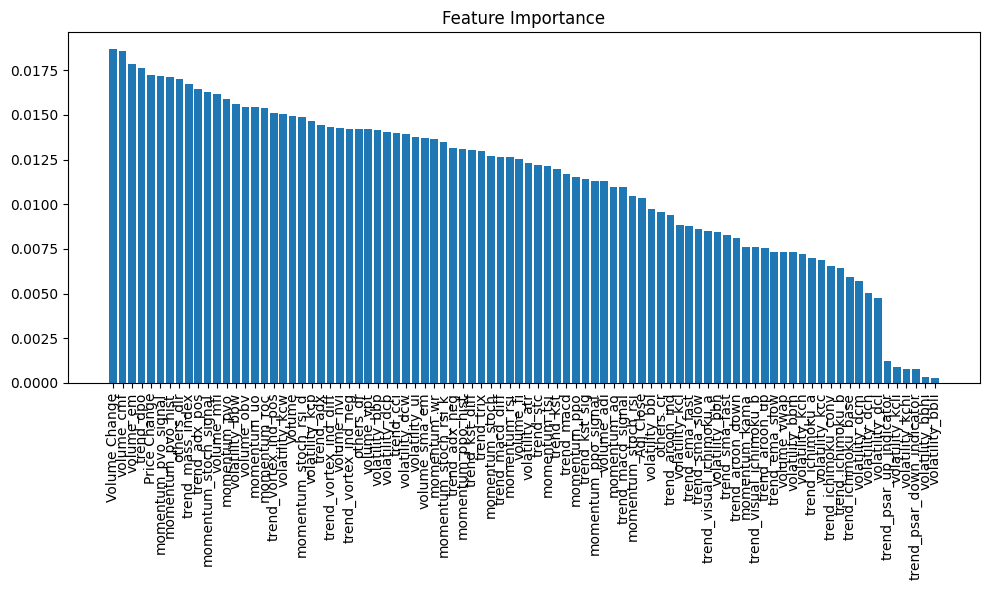

Top 88 features remaining
Score: 0.4781491002570694
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf', 'volume_fi', 'volume_em', 'volume_sma_em', 'volume_vpt', 'volume_vwap', 'volume_mfi', 'volume_nvi', 'volatility_bbm', 'volatility_bbh', 'volatility_bbl', 'volatility_bbw', 'volatility_bbp', 'volatility_bbhi', 'volatility_bbli', 'volatility_kcc', 'volatility_kch', 'volatility_kcl', 'volatility_kcw', 'volatility_kcp', 'volatility_kchi', 'volatility_kcli', 'volatility_dcl', 'volatility_dch', 'volatility_dcm', 'volatility_dcw', 'volatility_dcp', 'volatility_atr', 'volatility_ui', 'trend_macd', 'trend_macd_signal', 'trend_macd_diff', 'trend_sma_fast', 'trend_sma_slow', 'trend_ema_fast', 'trend_ema_slow', 'trend_vortex_ind_pos', 'trend_vortex_ind_neg', 'trend_vortex_ind_diff', 'trend_trix', 'trend_mass_index', 'trend_dpo', 'trend_kst', 'trend_kst_sig', 'trend_kst_diff', 'trend_ichimoku_conv', 'trend_ichimoku_base', 'trend_ichimoku_a'

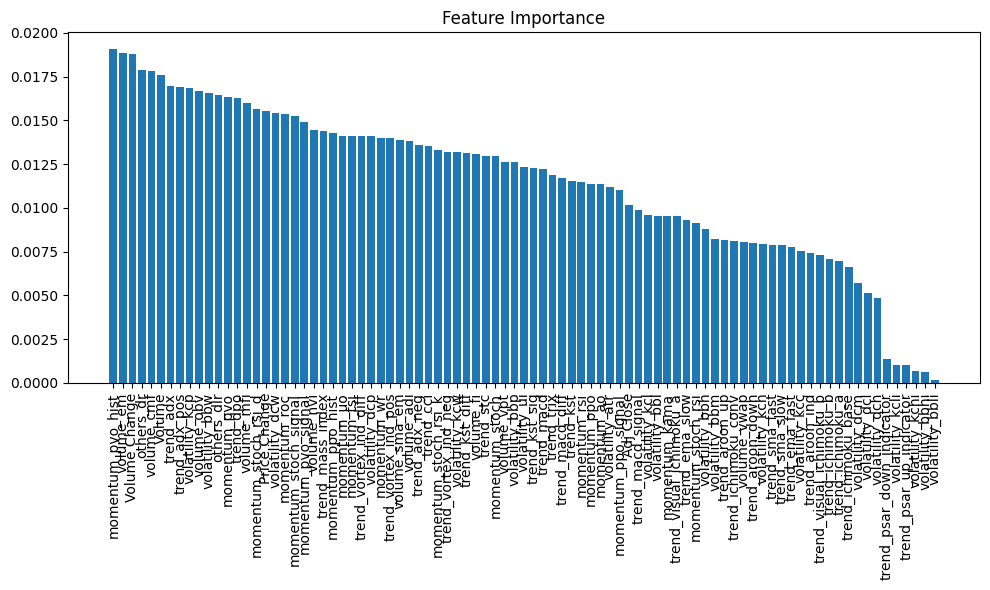

Top 87 features remaining
Score: 0.4473007712082262
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf', 'volume_fi', 'volume_em', 'volume_sma_em', 'volume_vpt', 'volume_vwap', 'volume_mfi', 'volume_nvi', 'volatility_bbm', 'volatility_bbh', 'volatility_bbl', 'volatility_bbw', 'volatility_bbp', 'volatility_bbhi', 'volatility_bbli', 'volatility_kcc', 'volatility_kch', 'volatility_kcl', 'volatility_kcw', 'volatility_kcp', 'volatility_kchi', 'volatility_kcli', 'volatility_dcl', 'volatility_dch', 'volatility_dcm', 'volatility_dcw', 'volatility_dcp', 'volatility_atr', 'volatility_ui', 'trend_macd', 'trend_macd_signal', 'trend_macd_diff', 'trend_sma_fast', 'trend_sma_slow', 'trend_ema_fast', 'trend_ema_slow', 'trend_vortex_ind_pos', 'trend_vortex_ind_neg', 'trend_vortex_ind_diff', 'trend_trix', 'trend_mass_index', 'trend_dpo', 'trend_kst', 'trend_kst_sig', 'trend_kst_diff', 'trend_ichimoku_conv', 'trend_ichimoku_base', 'trend_ichimoku_a'

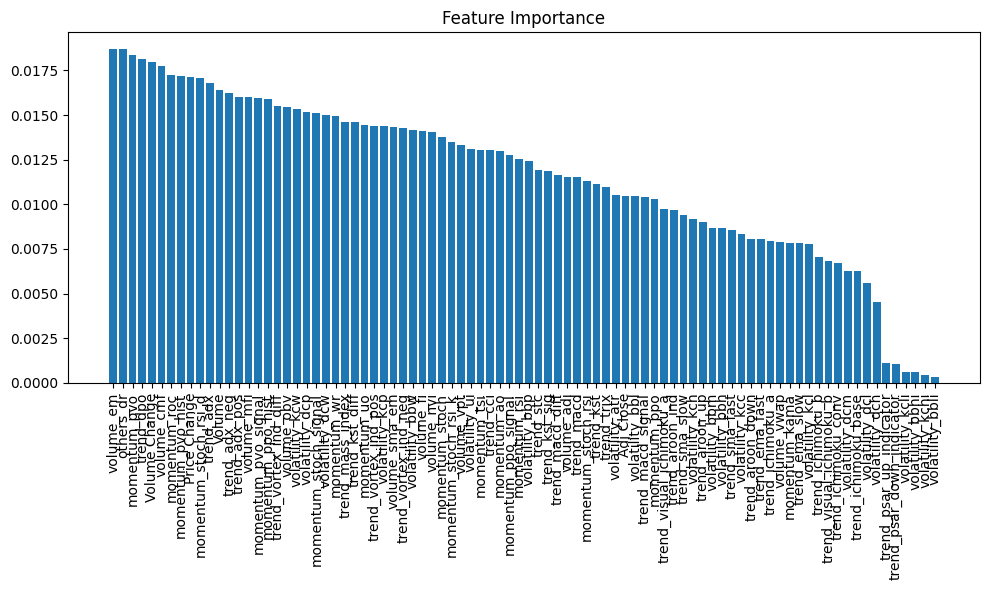

Top 86 features remaining
Score: 0.4884318766066838
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf', 'volume_fi', 'volume_em', 'volume_sma_em', 'volume_vpt', 'volume_vwap', 'volume_mfi', 'volume_nvi', 'volatility_bbm', 'volatility_bbh', 'volatility_bbl', 'volatility_bbw', 'volatility_bbp', 'volatility_bbhi', 'volatility_bbli', 'volatility_kcc', 'volatility_kch', 'volatility_kcl', 'volatility_kcw', 'volatility_kcp', 'volatility_kchi', 'volatility_kcli', 'volatility_dcl', 'volatility_dch', 'volatility_dcm', 'volatility_dcw', 'volatility_dcp', 'volatility_atr', 'volatility_ui', 'trend_macd', 'trend_macd_signal', 'trend_macd_diff', 'trend_sma_fast', 'trend_sma_slow', 'trend_ema_fast', 'trend_ema_slow', 'trend_vortex_ind_pos', 'trend_vortex_ind_neg', 'trend_vortex_ind_diff', 'trend_trix', 'trend_mass_index', 'trend_dpo', 'trend_kst', 'trend_kst_sig', 'trend_kst_diff', 'trend_ichimoku_conv', 'trend_ichimoku_base', 'trend_ichimoku_a'

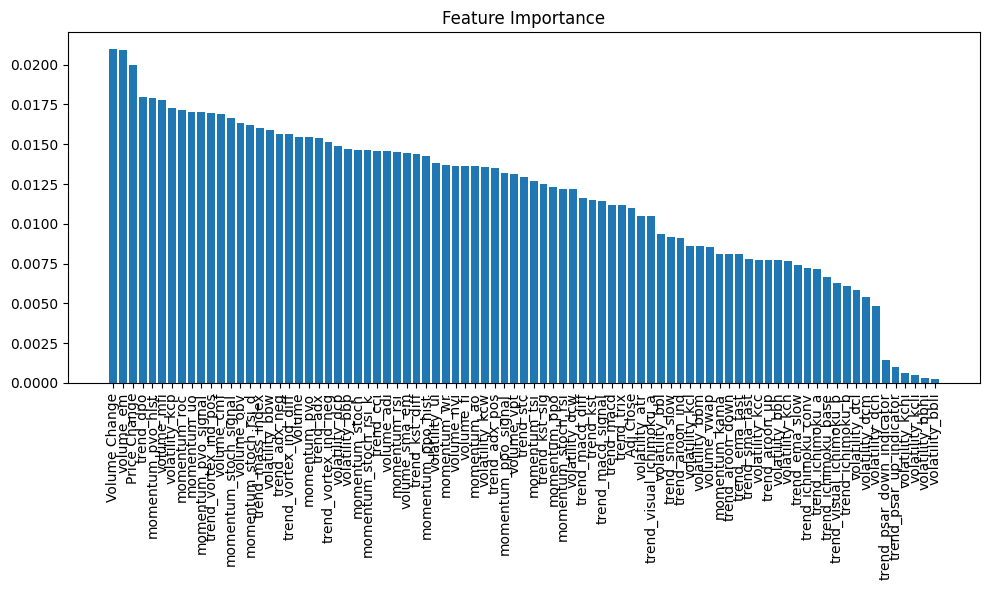

Top 85 features remaining
Score: 0.4910025706940874
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf', 'volume_fi', 'volume_em', 'volume_sma_em', 'volume_vpt', 'volume_vwap', 'volume_mfi', 'volume_nvi', 'volatility_bbm', 'volatility_bbh', 'volatility_bbl', 'volatility_bbw', 'volatility_bbp', 'volatility_bbhi', 'volatility_bbli', 'volatility_kcc', 'volatility_kch', 'volatility_kcl', 'volatility_kcw', 'volatility_kcp', 'volatility_kchi', 'volatility_kcli', 'volatility_dcl', 'volatility_dch', 'volatility_dcm', 'volatility_dcw', 'volatility_dcp', 'volatility_atr', 'volatility_ui', 'trend_macd', 'trend_macd_signal', 'trend_macd_diff', 'trend_sma_fast', 'trend_sma_slow', 'trend_ema_fast', 'trend_ema_slow', 'trend_vortex_ind_pos', 'trend_vortex_ind_neg', 'trend_vortex_ind_diff', 'trend_trix', 'trend_mass_index', 'trend_dpo', 'trend_kst', 'trend_kst_sig', 'trend_kst_diff', 'trend_ichimoku_conv', 'trend_ichimoku_base', 'trend_ichimoku_a'

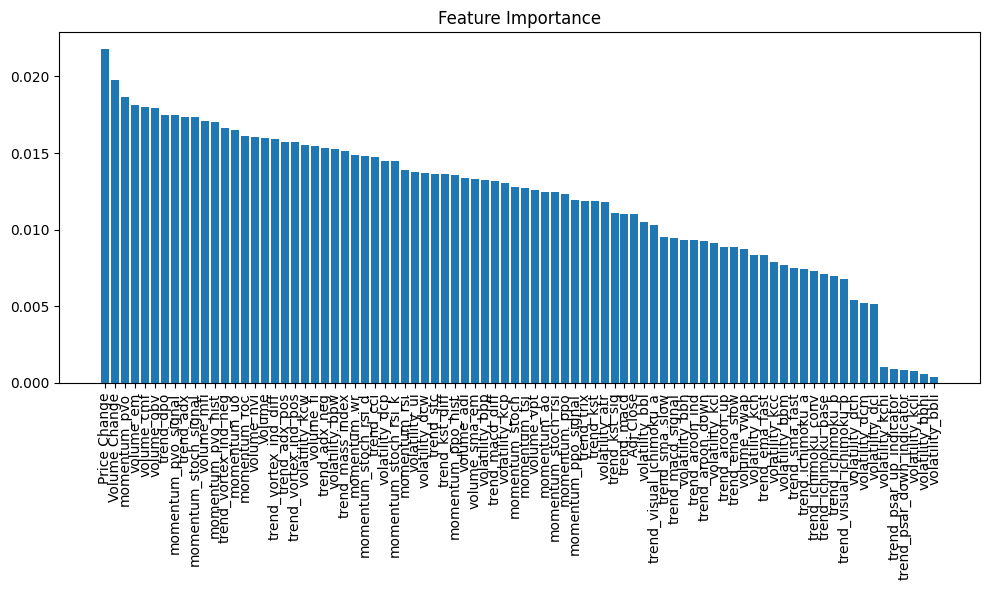

Top 84 features remaining
Score: 0.46786632390745503
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf', 'volume_fi', 'volume_em', 'volume_sma_em', 'volume_vpt', 'volume_vwap', 'volume_mfi', 'volume_nvi', 'volatility_bbm', 'volatility_bbh', 'volatility_bbl', 'volatility_bbw', 'volatility_bbp', 'volatility_bbhi', 'volatility_bbli', 'volatility_kcc', 'volatility_kch', 'volatility_kcl', 'volatility_kcw', 'volatility_kcp', 'volatility_kchi', 'volatility_kcli', 'volatility_dcl', 'volatility_dch', 'volatility_dcm', 'volatility_dcw', 'volatility_dcp', 'volatility_atr', 'volatility_ui', 'trend_macd', 'trend_macd_signal', 'trend_macd_diff', 'trend_sma_fast', 'trend_sma_slow', 'trend_ema_fast', 'trend_ema_slow', 'trend_vortex_ind_pos', 'trend_vortex_ind_neg', 'trend_vortex_ind_diff', 'trend_trix', 'trend_mass_index', 'trend_dpo', 'trend_kst', 'trend_kst_sig', 'trend_kst_diff', 'trend_ichimoku_conv', 'trend_ichimoku_base', 'trend_ichimoku_a

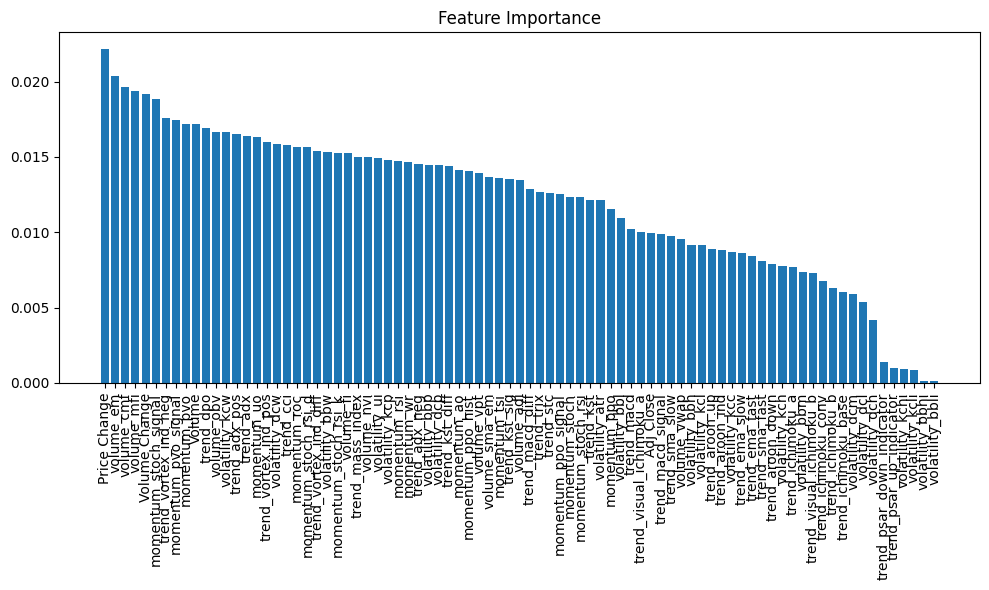

Top 83 features remaining
Score: 0.4652956298200514
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf', 'volume_fi', 'volume_em', 'volume_sma_em', 'volume_vpt', 'volume_vwap', 'volume_mfi', 'volume_nvi', 'volatility_bbm', 'volatility_bbh', 'volatility_bbl', 'volatility_bbw', 'volatility_bbp', 'volatility_bbhi', 'volatility_bbli', 'volatility_kcc', 'volatility_kch', 'volatility_kcl', 'volatility_kcw', 'volatility_kcp', 'volatility_kchi', 'volatility_kcli', 'volatility_dcl', 'volatility_dch', 'volatility_dcm', 'volatility_dcw', 'volatility_dcp', 'volatility_atr', 'volatility_ui', 'trend_macd', 'trend_macd_signal', 'trend_macd_diff', 'trend_sma_fast', 'trend_sma_slow', 'trend_ema_fast', 'trend_ema_slow', 'trend_vortex_ind_pos', 'trend_vortex_ind_neg', 'trend_vortex_ind_diff', 'trend_trix', 'trend_mass_index', 'trend_dpo', 'trend_kst', 'trend_kst_sig', 'trend_kst_diff', 'trend_ichimoku_conv', 'trend_ichimoku_base', 'trend_ichimoku_a'

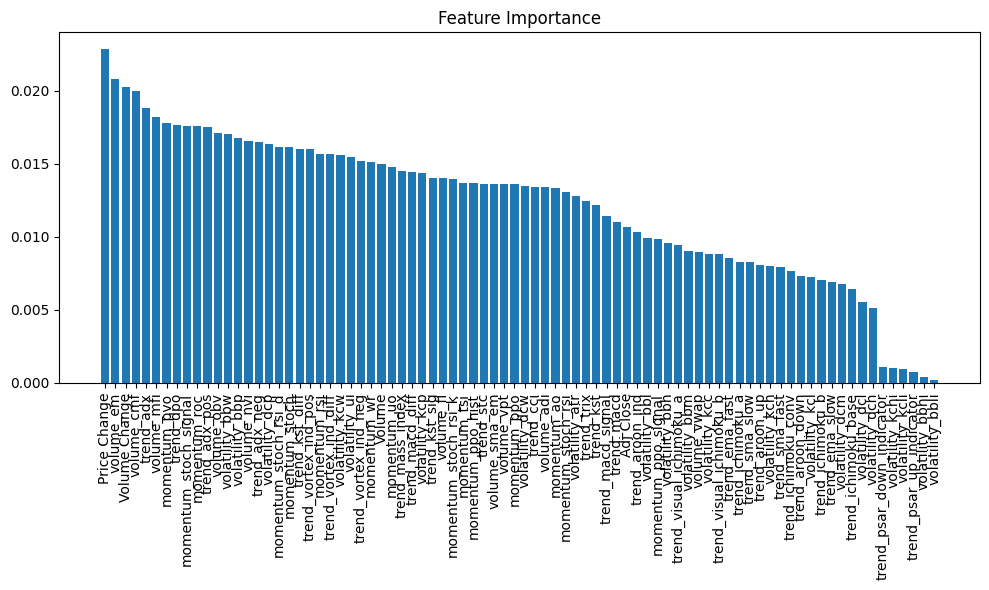

Top 82 features remaining
Score: 0.46786632390745503
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf', 'volume_fi', 'volume_em', 'volume_sma_em', 'volume_vpt', 'volume_vwap', 'volume_mfi', 'volume_nvi', 'volatility_bbm', 'volatility_bbh', 'volatility_bbl', 'volatility_bbw', 'volatility_bbp', 'volatility_bbhi', 'volatility_bbli', 'volatility_kcc', 'volatility_kch', 'volatility_kcl', 'volatility_kcw', 'volatility_kcp', 'volatility_kchi', 'volatility_kcli', 'volatility_dcl', 'volatility_dch', 'volatility_dcm', 'volatility_dcw', 'volatility_dcp', 'volatility_atr', 'volatility_ui', 'trend_macd', 'trend_macd_signal', 'trend_macd_diff', 'trend_sma_fast', 'trend_sma_slow', 'trend_ema_fast', 'trend_ema_slow', 'trend_vortex_ind_pos', 'trend_vortex_ind_neg', 'trend_vortex_ind_diff', 'trend_trix', 'trend_mass_index', 'trend_dpo', 'trend_kst', 'trend_kst_sig', 'trend_kst_diff', 'trend_ichimoku_conv', 'trend_ichimoku_base', 'trend_ichimoku_a

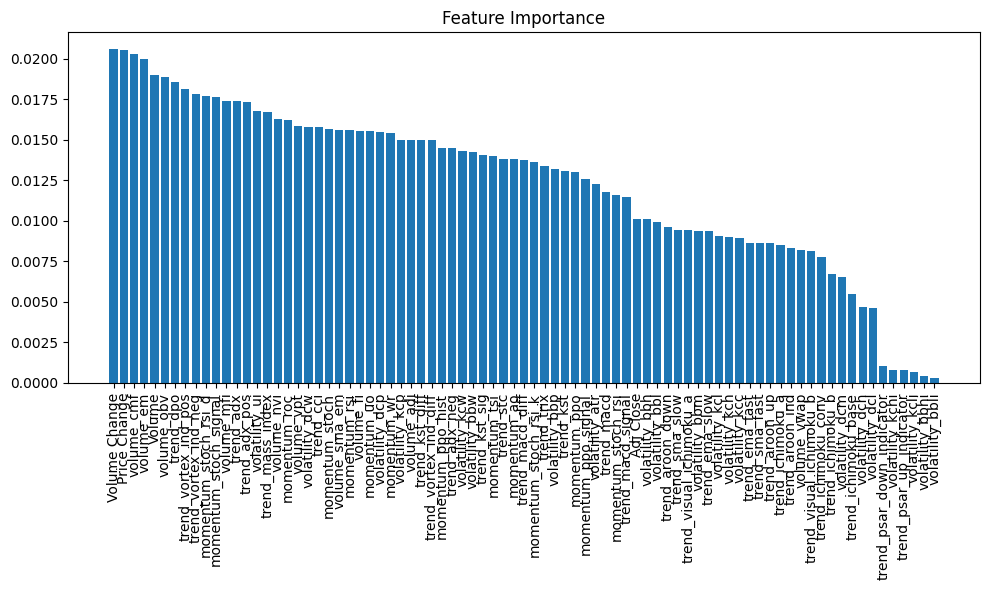

Top 81 features remaining
Score: 0.46272493573264784
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf', 'volume_fi', 'volume_em', 'volume_sma_em', 'volume_vpt', 'volume_vwap', 'volume_mfi', 'volume_nvi', 'volatility_bbm', 'volatility_bbh', 'volatility_bbl', 'volatility_bbw', 'volatility_bbp', 'volatility_bbhi', 'volatility_bbli', 'volatility_kcc', 'volatility_kch', 'volatility_kcl', 'volatility_kcw', 'volatility_kcp', 'volatility_kchi', 'volatility_kcli', 'volatility_dcl', 'volatility_dch', 'volatility_dcm', 'volatility_dcw', 'volatility_dcp', 'volatility_atr', 'volatility_ui', 'trend_macd', 'trend_macd_signal', 'trend_macd_diff', 'trend_sma_fast', 'trend_sma_slow', 'trend_ema_fast', 'trend_ema_slow', 'trend_vortex_ind_pos', 'trend_vortex_ind_neg', 'trend_vortex_ind_diff', 'trend_trix', 'trend_mass_index', 'trend_dpo', 'trend_kst', 'trend_kst_sig', 'trend_kst_diff', 'trend_ichimoku_conv', 'trend_ichimoku_base', 'trend_ichimoku_a

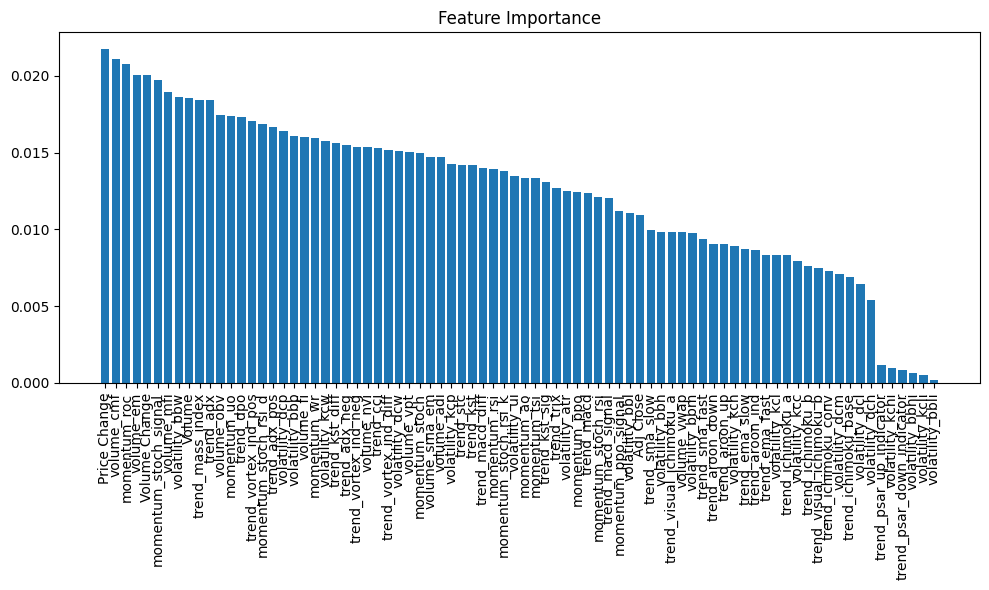

Top 80 features remaining
Score: 0.45758354755784064
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf', 'volume_fi', 'volume_em', 'volume_sma_em', 'volume_vpt', 'volume_vwap', 'volume_mfi', 'volume_nvi', 'volatility_bbm', 'volatility_bbh', 'volatility_bbl', 'volatility_bbw', 'volatility_bbp', 'volatility_bbhi', 'volatility_bbli', 'volatility_kcc', 'volatility_kch', 'volatility_kcl', 'volatility_kcw', 'volatility_kcp', 'volatility_kchi', 'volatility_kcli', 'volatility_dcl', 'volatility_dch', 'volatility_dcm', 'volatility_dcw', 'volatility_dcp', 'volatility_atr', 'volatility_ui', 'trend_macd', 'trend_macd_signal', 'trend_macd_diff', 'trend_sma_fast', 'trend_sma_slow', 'trend_ema_fast', 'trend_ema_slow', 'trend_vortex_ind_pos', 'trend_vortex_ind_neg', 'trend_vortex_ind_diff', 'trend_trix', 'trend_mass_index', 'trend_dpo', 'trend_kst', 'trend_kst_sig', 'trend_kst_diff', 'trend_ichimoku_conv', 'trend_ichimoku_base', 'trend_ichimoku_a

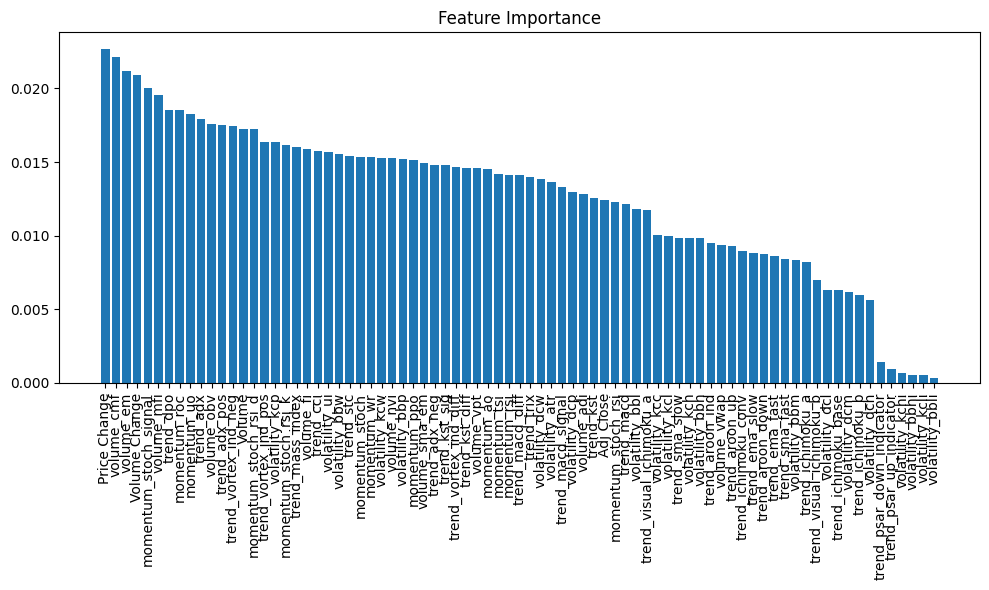

Top 79 features remaining
Score: 0.45758354755784064
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf', 'volume_fi', 'volume_em', 'volume_sma_em', 'volume_vpt', 'volume_vwap', 'volume_mfi', 'volume_nvi', 'volatility_bbm', 'volatility_bbh', 'volatility_bbl', 'volatility_bbw', 'volatility_bbp', 'volatility_bbhi', 'volatility_bbli', 'volatility_kcc', 'volatility_kch', 'volatility_kcl', 'volatility_kcw', 'volatility_kcp', 'volatility_kchi', 'volatility_kcli', 'volatility_dcl', 'volatility_dch', 'volatility_dcm', 'volatility_dcw', 'volatility_dcp', 'volatility_atr', 'volatility_ui', 'trend_macd', 'trend_macd_signal', 'trend_macd_diff', 'trend_sma_fast', 'trend_sma_slow', 'trend_ema_fast', 'trend_ema_slow', 'trend_vortex_ind_pos', 'trend_vortex_ind_neg', 'trend_vortex_ind_diff', 'trend_trix', 'trend_mass_index', 'trend_dpo', 'trend_kst', 'trend_kst_sig', 'trend_kst_diff', 'trend_ichimoku_conv', 'trend_ichimoku_base', 'trend_ichimoku_a

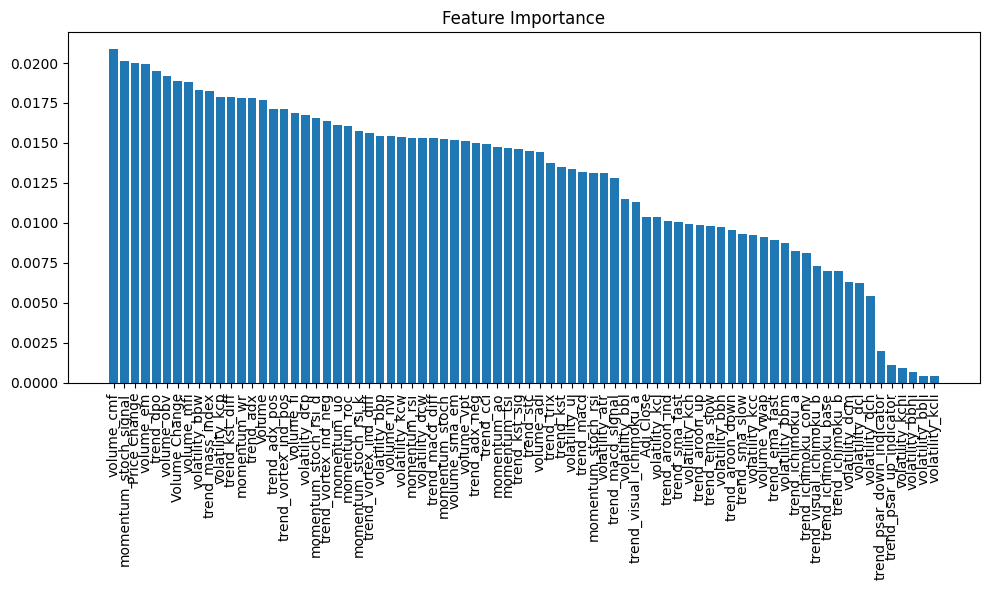

Top 78 features remaining
Score: 0.4832904884318766
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf', 'volume_fi', 'volume_em', 'volume_sma_em', 'volume_vpt', 'volume_vwap', 'volume_mfi', 'volume_nvi', 'volatility_bbm', 'volatility_bbh', 'volatility_bbl', 'volatility_bbw', 'volatility_bbp', 'volatility_bbhi', 'volatility_bbli', 'volatility_kcc', 'volatility_kch', 'volatility_kcl', 'volatility_kcw', 'volatility_kcp', 'volatility_kchi', 'volatility_kcli', 'volatility_dcl', 'volatility_dch', 'volatility_dcm', 'volatility_dcw', 'volatility_dcp', 'volatility_atr', 'volatility_ui', 'trend_macd', 'trend_macd_signal', 'trend_macd_diff', 'trend_sma_fast', 'trend_sma_slow', 'trend_ema_fast', 'trend_ema_slow', 'trend_vortex_ind_pos', 'trend_vortex_ind_neg', 'trend_vortex_ind_diff', 'trend_trix', 'trend_mass_index', 'trend_dpo', 'trend_kst', 'trend_kst_sig', 'trend_kst_diff', 'trend_ichimoku_conv', 'trend_ichimoku_base', 'trend_ichimoku_a'

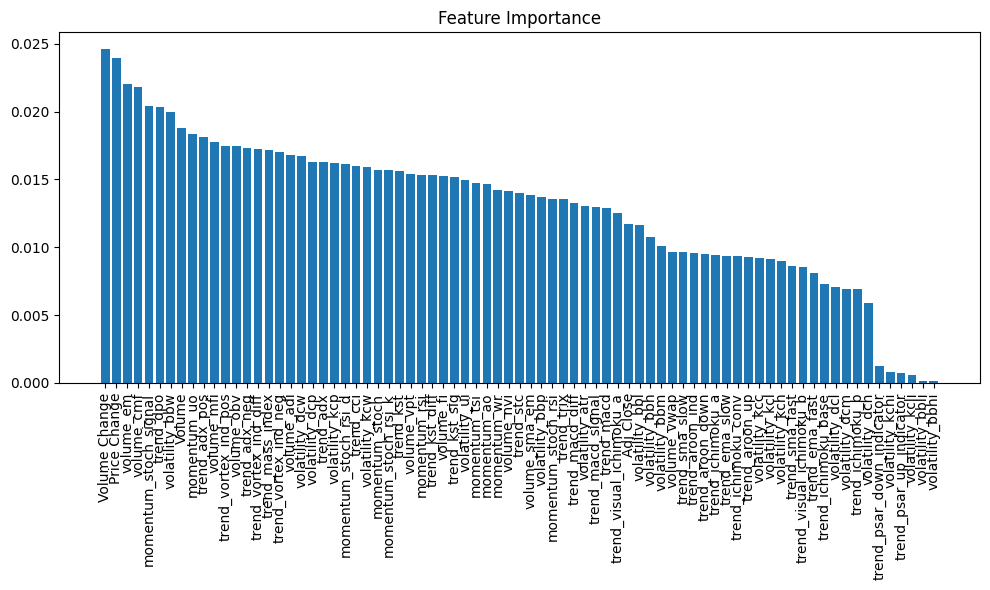

Top 77 features remaining
Score: 0.4730077120822622
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf', 'volume_fi', 'volume_em', 'volume_sma_em', 'volume_vpt', 'volume_vwap', 'volume_mfi', 'volume_nvi', 'volatility_bbm', 'volatility_bbh', 'volatility_bbl', 'volatility_bbw', 'volatility_bbp', 'volatility_bbhi', 'volatility_bbli', 'volatility_kcc', 'volatility_kch', 'volatility_kcl', 'volatility_kcw', 'volatility_kcp', 'volatility_kchi', 'volatility_kcli', 'volatility_dcl', 'volatility_dch', 'volatility_dcm', 'volatility_dcw', 'volatility_dcp', 'volatility_atr', 'volatility_ui', 'trend_macd', 'trend_macd_signal', 'trend_macd_diff', 'trend_sma_fast', 'trend_sma_slow', 'trend_ema_fast', 'trend_ema_slow', 'trend_vortex_ind_pos', 'trend_vortex_ind_neg', 'trend_vortex_ind_diff', 'trend_trix', 'trend_mass_index', 'trend_dpo', 'trend_kst', 'trend_kst_sig', 'trend_kst_diff', 'trend_ichimoku_conv', 'trend_ichimoku_base', 'trend_ichimoku_a'

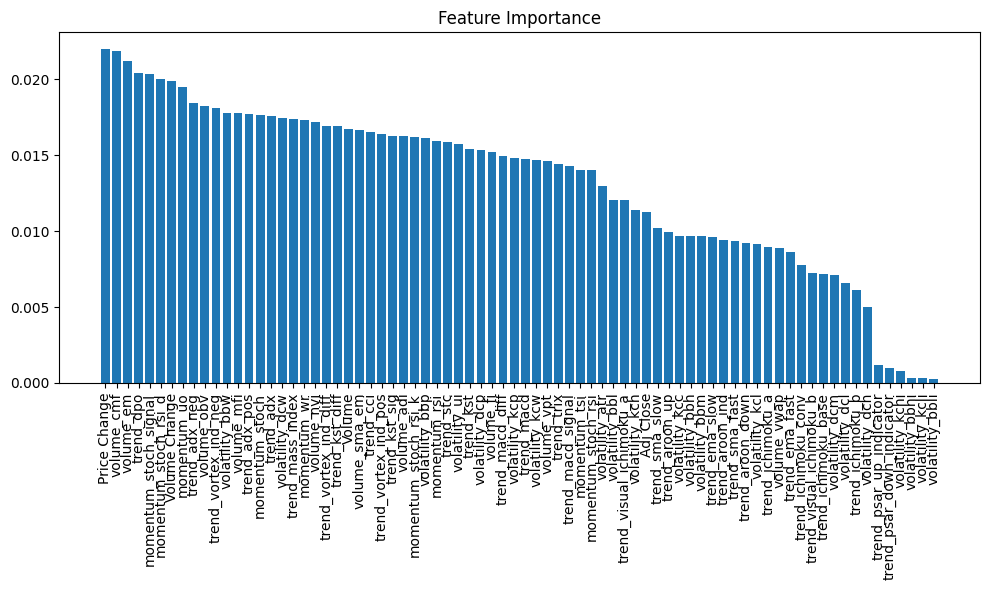

Top 76 features remaining
Score: 0.4652956298200514
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf', 'volume_fi', 'volume_em', 'volume_sma_em', 'volume_vpt', 'volume_vwap', 'volume_mfi', 'volume_nvi', 'volatility_bbm', 'volatility_bbh', 'volatility_bbl', 'volatility_bbw', 'volatility_bbp', 'volatility_bbhi', 'volatility_bbli', 'volatility_kcc', 'volatility_kch', 'volatility_kcl', 'volatility_kcw', 'volatility_kcp', 'volatility_kchi', 'volatility_kcli', 'volatility_dcl', 'volatility_dch', 'volatility_dcm', 'volatility_dcw', 'volatility_dcp', 'volatility_atr', 'volatility_ui', 'trend_macd', 'trend_macd_signal', 'trend_macd_diff', 'trend_sma_fast', 'trend_sma_slow', 'trend_ema_fast', 'trend_ema_slow', 'trend_vortex_ind_pos', 'trend_vortex_ind_neg', 'trend_vortex_ind_diff', 'trend_trix', 'trend_mass_index', 'trend_dpo', 'trend_kst', 'trend_kst_sig', 'trend_kst_diff', 'trend_ichimoku_conv', 'trend_ichimoku_base', 'trend_ichimoku_a'

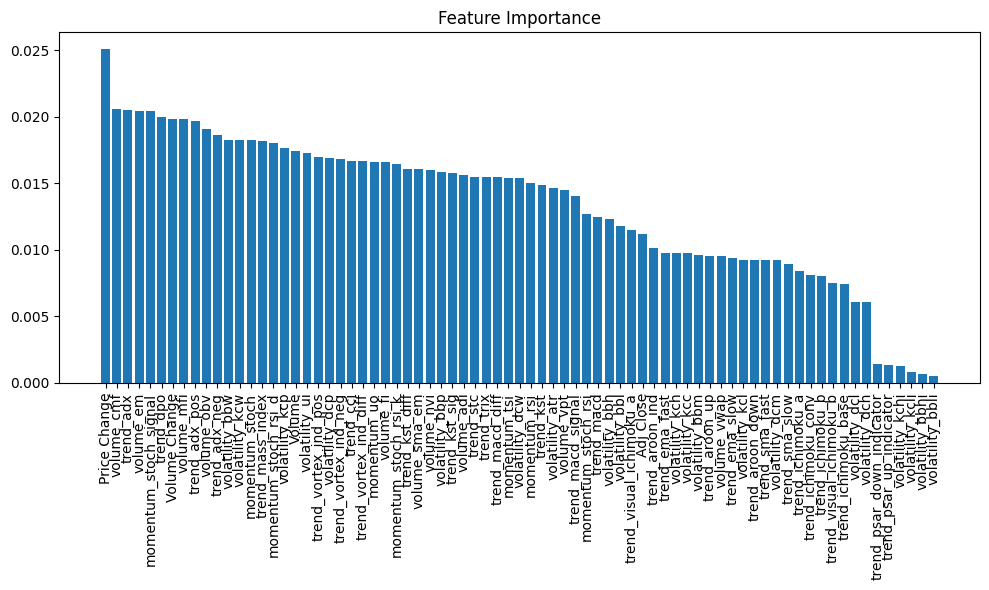

Top 75 features remaining
Score: 0.46272493573264784
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf', 'volume_fi', 'volume_em', 'volume_sma_em', 'volume_vpt', 'volume_vwap', 'volume_mfi', 'volume_nvi', 'volatility_bbm', 'volatility_bbh', 'volatility_bbl', 'volatility_bbw', 'volatility_bbp', 'volatility_bbhi', 'volatility_bbli', 'volatility_kcc', 'volatility_kch', 'volatility_kcl', 'volatility_kcw', 'volatility_kcp', 'volatility_kchi', 'volatility_kcli', 'volatility_dcl', 'volatility_dch', 'volatility_dcm', 'volatility_dcw', 'volatility_dcp', 'volatility_atr', 'volatility_ui', 'trend_macd', 'trend_macd_signal', 'trend_macd_diff', 'trend_sma_fast', 'trend_sma_slow', 'trend_ema_fast', 'trend_ema_slow', 'trend_vortex_ind_pos', 'trend_vortex_ind_neg', 'trend_vortex_ind_diff', 'trend_trix', 'trend_mass_index', 'trend_dpo', 'trend_kst', 'trend_kst_sig', 'trend_kst_diff', 'trend_ichimoku_conv', 'trend_ichimoku_base', 'trend_ichimoku_a

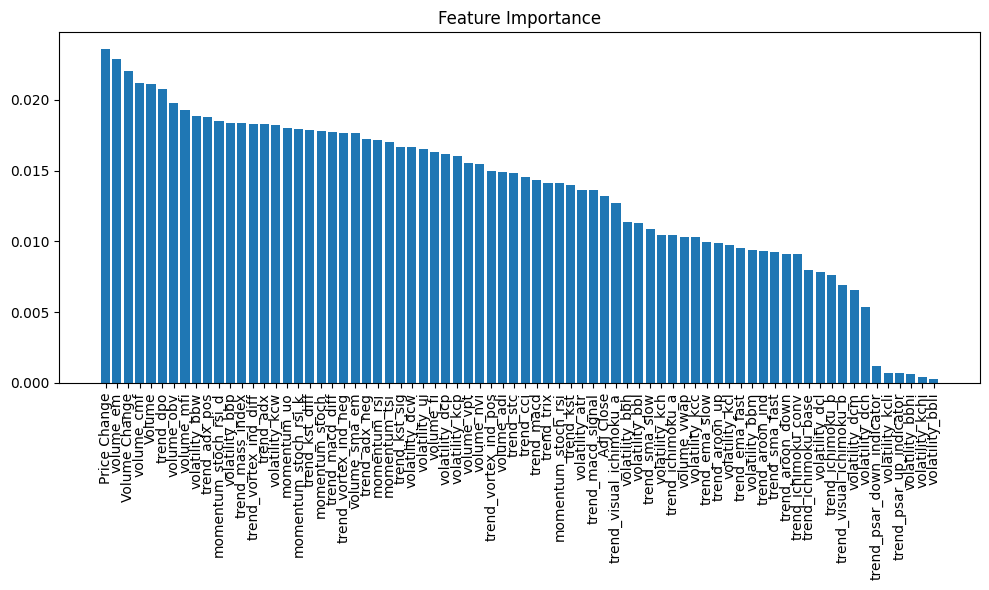

Top 74 features remaining
Score: 0.4524421593830334
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf', 'volume_fi', 'volume_em', 'volume_sma_em', 'volume_vpt', 'volume_vwap', 'volume_mfi', 'volume_nvi', 'volatility_bbm', 'volatility_bbh', 'volatility_bbl', 'volatility_bbw', 'volatility_bbp', 'volatility_bbhi', 'volatility_bbli', 'volatility_kcc', 'volatility_kch', 'volatility_kcl', 'volatility_kcw', 'volatility_kcp', 'volatility_kchi', 'volatility_kcli', 'volatility_dcl', 'volatility_dch', 'volatility_dcm', 'volatility_dcw', 'volatility_dcp', 'volatility_atr', 'volatility_ui', 'trend_macd', 'trend_macd_signal', 'trend_macd_diff', 'trend_sma_fast', 'trend_sma_slow', 'trend_ema_fast', 'trend_ema_slow', 'trend_vortex_ind_pos', 'trend_vortex_ind_neg', 'trend_vortex_ind_diff', 'trend_trix', 'trend_mass_index', 'trend_dpo', 'trend_kst', 'trend_kst_sig', 'trend_kst_diff', 'trend_ichimoku_conv', 'trend_ichimoku_base', 'trend_ichimoku_a'

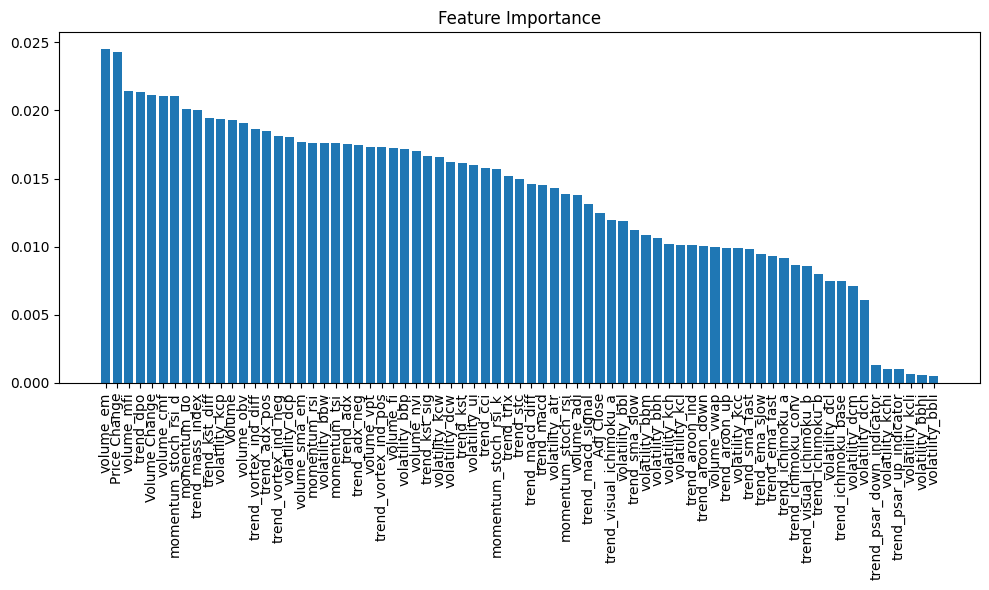

Top 73 features remaining
Score: 0.45758354755784064
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf', 'volume_fi', 'volume_em', 'volume_sma_em', 'volume_vpt', 'volume_vwap', 'volume_mfi', 'volume_nvi', 'volatility_bbm', 'volatility_bbh', 'volatility_bbl', 'volatility_bbw', 'volatility_bbp', 'volatility_bbhi', 'volatility_bbli', 'volatility_kcc', 'volatility_kch', 'volatility_kcl', 'volatility_kcw', 'volatility_kcp', 'volatility_kchi', 'volatility_kcli', 'volatility_dcl', 'volatility_dch', 'volatility_dcm', 'volatility_dcw', 'volatility_dcp', 'volatility_atr', 'volatility_ui', 'trend_macd', 'trend_macd_signal', 'trend_macd_diff', 'trend_sma_fast', 'trend_sma_slow', 'trend_ema_fast', 'trend_ema_slow', 'trend_vortex_ind_pos', 'trend_vortex_ind_neg', 'trend_vortex_ind_diff', 'trend_trix', 'trend_mass_index', 'trend_dpo', 'trend_kst', 'trend_kst_sig', 'trend_kst_diff', 'trend_ichimoku_conv', 'trend_ichimoku_base', 'trend_ichimoku_a

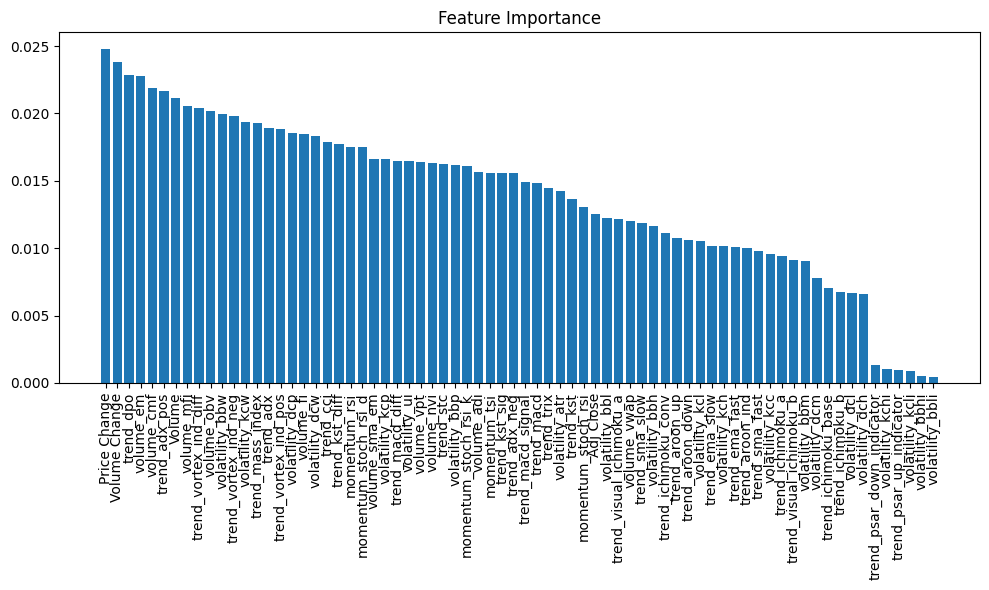

Top 72 features remaining
Score: 0.46272493573264784
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf', 'volume_fi', 'volume_em', 'volume_sma_em', 'volume_vpt', 'volume_vwap', 'volume_mfi', 'volume_nvi', 'volatility_bbm', 'volatility_bbh', 'volatility_bbl', 'volatility_bbw', 'volatility_bbp', 'volatility_bbhi', 'volatility_bbli', 'volatility_kcc', 'volatility_kch', 'volatility_kcl', 'volatility_kcw', 'volatility_kcp', 'volatility_kchi', 'volatility_kcli', 'volatility_dcl', 'volatility_dch', 'volatility_dcm', 'volatility_dcw', 'volatility_dcp', 'volatility_atr', 'volatility_ui', 'trend_macd', 'trend_macd_signal', 'trend_macd_diff', 'trend_sma_fast', 'trend_sma_slow', 'trend_ema_fast', 'trend_ema_slow', 'trend_vortex_ind_pos', 'trend_vortex_ind_neg', 'trend_vortex_ind_diff', 'trend_trix', 'trend_mass_index', 'trend_dpo', 'trend_kst', 'trend_kst_sig', 'trend_kst_diff', 'trend_ichimoku_conv', 'trend_ichimoku_base', 'trend_ichimoku_a

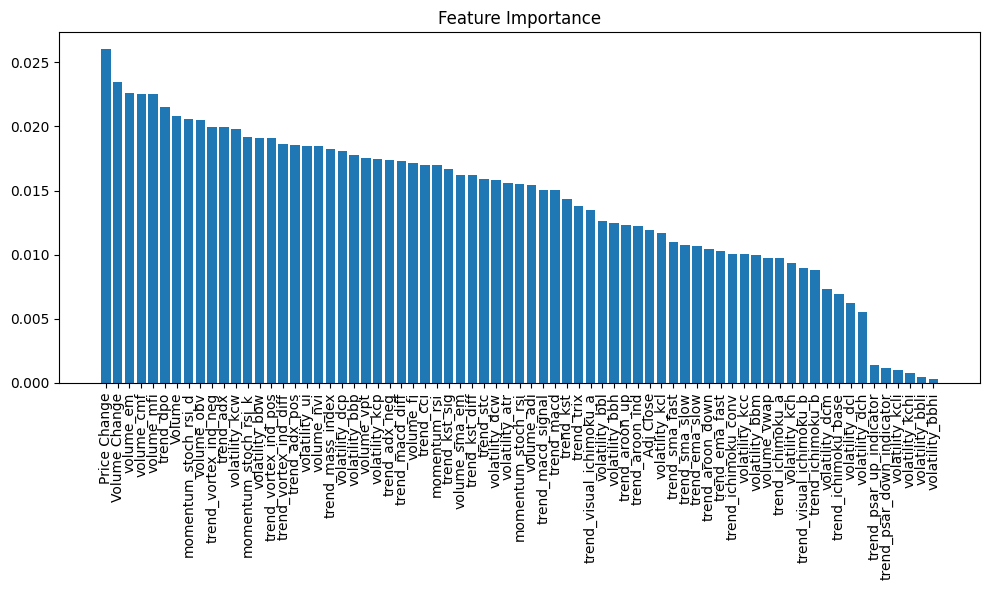

Top 71 features remaining
Score: 0.4884318766066838
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf', 'volume_fi', 'volume_em', 'volume_sma_em', 'volume_vpt', 'volume_vwap', 'volume_mfi', 'volume_nvi', 'volatility_bbm', 'volatility_bbh', 'volatility_bbl', 'volatility_bbw', 'volatility_bbp', 'volatility_bbhi', 'volatility_bbli', 'volatility_kcc', 'volatility_kch', 'volatility_kcl', 'volatility_kcw', 'volatility_kcp', 'volatility_kchi', 'volatility_kcli', 'volatility_dcl', 'volatility_dch', 'volatility_dcm', 'volatility_dcw', 'volatility_dcp', 'volatility_atr', 'volatility_ui', 'trend_macd', 'trend_macd_signal', 'trend_macd_diff', 'trend_sma_fast', 'trend_sma_slow', 'trend_ema_fast', 'trend_ema_slow', 'trend_vortex_ind_pos', 'trend_vortex_ind_neg', 'trend_vortex_ind_diff', 'trend_trix', 'trend_mass_index', 'trend_dpo', 'trend_kst', 'trend_kst_sig', 'trend_kst_diff', 'trend_ichimoku_conv', 'trend_ichimoku_base', 'trend_ichimoku_a'

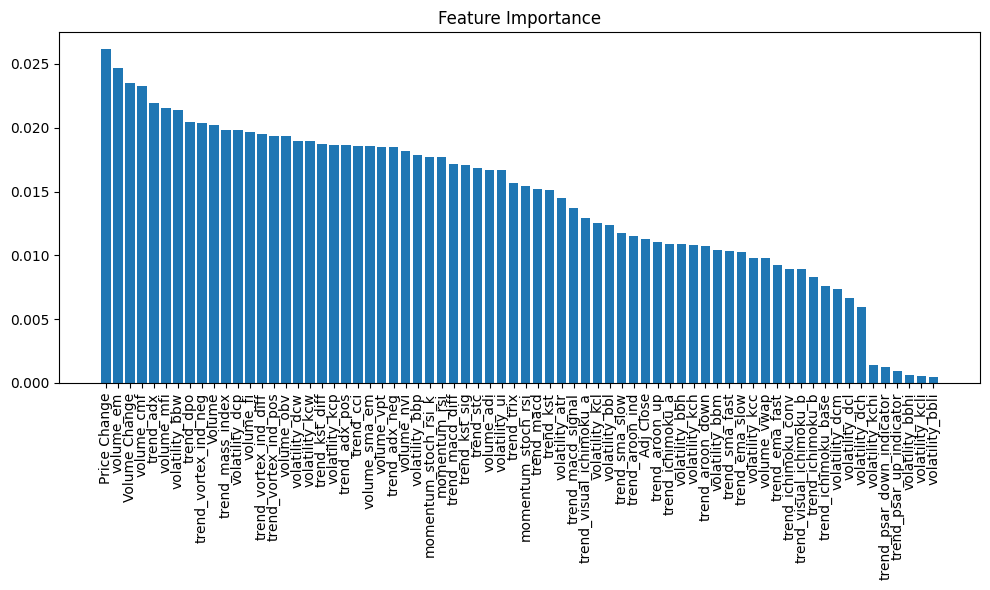

Top 70 features remaining
Score: 0.4473007712082262
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf', 'volume_fi', 'volume_em', 'volume_sma_em', 'volume_vpt', 'volume_vwap', 'volume_mfi', 'volume_nvi', 'volatility_bbm', 'volatility_bbh', 'volatility_bbl', 'volatility_bbw', 'volatility_bbp', 'volatility_bbhi', 'volatility_bbli', 'volatility_kcc', 'volatility_kch', 'volatility_kcl', 'volatility_kcw', 'volatility_kcp', 'volatility_kchi', 'volatility_kcli', 'volatility_dcl', 'volatility_dch', 'volatility_dcm', 'volatility_dcw', 'volatility_dcp', 'volatility_atr', 'volatility_ui', 'trend_macd', 'trend_macd_signal', 'trend_macd_diff', 'trend_sma_fast', 'trend_sma_slow', 'trend_ema_fast', 'trend_ema_slow', 'trend_vortex_ind_pos', 'trend_vortex_ind_neg', 'trend_vortex_ind_diff', 'trend_trix', 'trend_mass_index', 'trend_dpo', 'trend_kst', 'trend_kst_sig', 'trend_kst_diff', 'trend_ichimoku_conv', 'trend_ichimoku_base', 'trend_ichimoku_a'

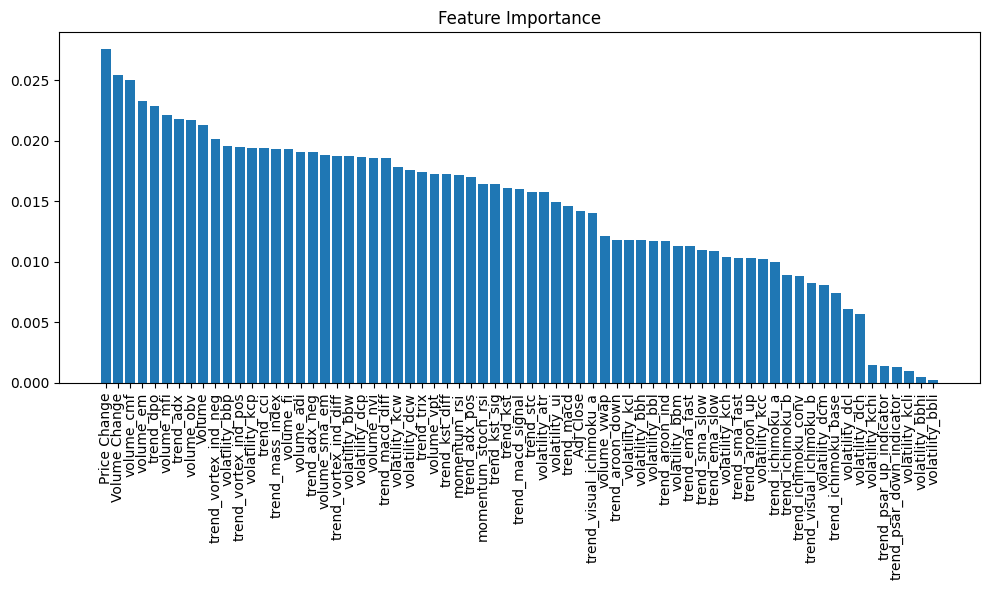

Top 69 features remaining
Score: 0.4652956298200514
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf', 'volume_fi', 'volume_em', 'volume_sma_em', 'volume_vpt', 'volume_vwap', 'volume_mfi', 'volume_nvi', 'volatility_bbm', 'volatility_bbh', 'volatility_bbl', 'volatility_bbw', 'volatility_bbp', 'volatility_bbhi', 'volatility_bbli', 'volatility_kcc', 'volatility_kch', 'volatility_kcl', 'volatility_kcw', 'volatility_kcp', 'volatility_kchi', 'volatility_kcli', 'volatility_dcl', 'volatility_dch', 'volatility_dcm', 'volatility_dcw', 'volatility_dcp', 'volatility_atr', 'volatility_ui', 'trend_macd', 'trend_macd_signal', 'trend_macd_diff', 'trend_sma_fast', 'trend_sma_slow', 'trend_ema_fast', 'trend_ema_slow', 'trend_vortex_ind_pos', 'trend_vortex_ind_neg', 'trend_vortex_ind_diff', 'trend_trix', 'trend_mass_index', 'trend_dpo', 'trend_kst', 'trend_kst_sig', 'trend_kst_diff', 'trend_ichimoku_conv', 'trend_ichimoku_base', 'trend_ichimoku_a'

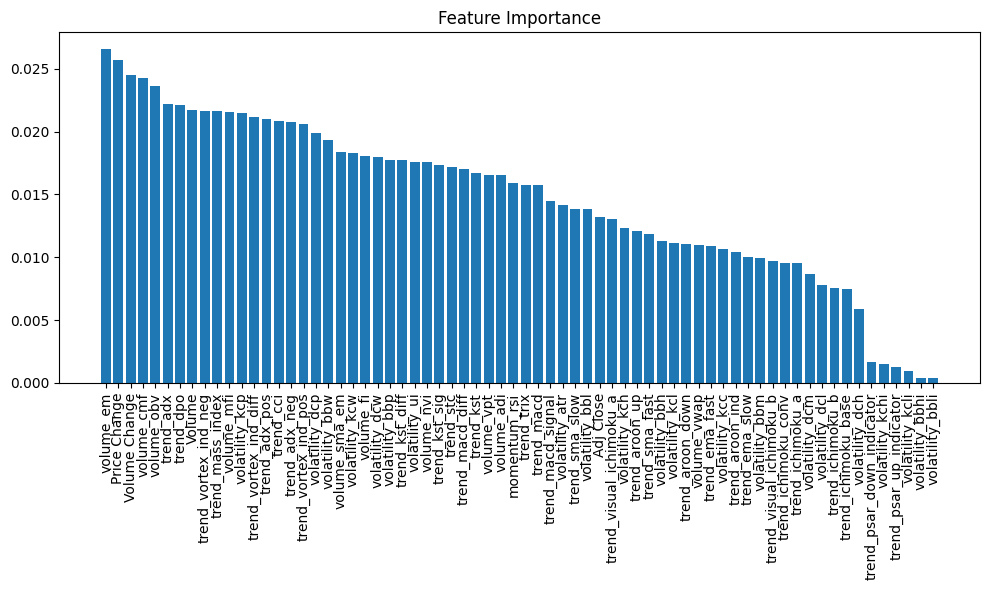

Top 68 features remaining
Score: 0.4473007712082262
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf', 'volume_fi', 'volume_em', 'volume_sma_em', 'volume_vpt', 'volume_vwap', 'volume_mfi', 'volume_nvi', 'volatility_bbm', 'volatility_bbh', 'volatility_bbl', 'volatility_bbw', 'volatility_bbp', 'volatility_bbhi', 'volatility_bbli', 'volatility_kcc', 'volatility_kch', 'volatility_kcl', 'volatility_kcw', 'volatility_kcp', 'volatility_kchi', 'volatility_kcli', 'volatility_dcl', 'volatility_dch', 'volatility_dcm', 'volatility_dcw', 'volatility_dcp', 'volatility_atr', 'volatility_ui', 'trend_macd', 'trend_macd_signal', 'trend_macd_diff', 'trend_sma_fast', 'trend_sma_slow', 'trend_ema_fast', 'trend_ema_slow', 'trend_vortex_ind_pos', 'trend_vortex_ind_neg', 'trend_vortex_ind_diff', 'trend_trix', 'trend_mass_index', 'trend_dpo', 'trend_kst', 'trend_kst_sig', 'trend_kst_diff', 'trend_ichimoku_conv', 'trend_ichimoku_base', 'trend_ichimoku_a'

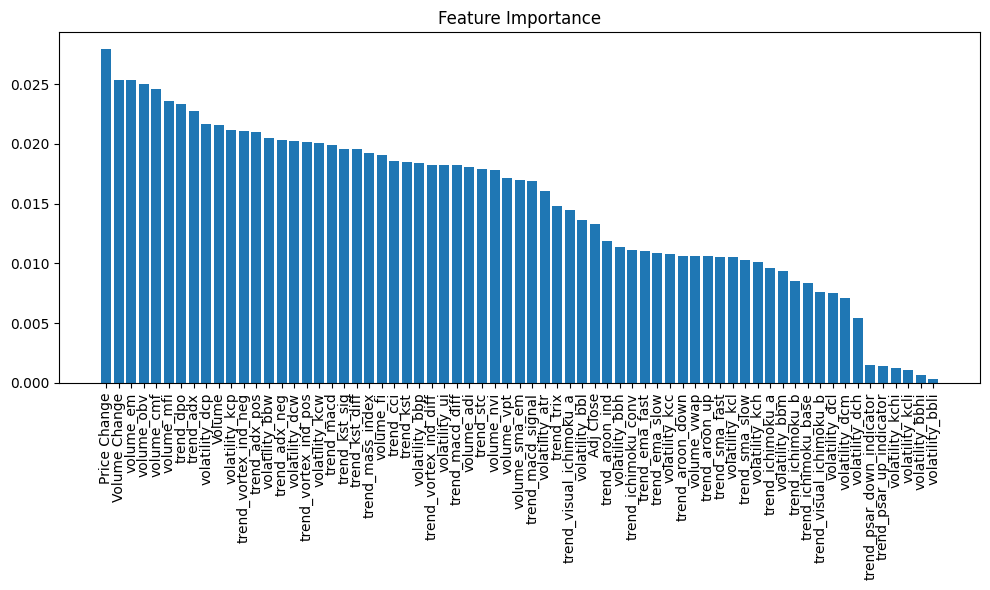

Top 67 features remaining
Score: 0.45758354755784064
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf', 'volume_fi', 'volume_em', 'volume_sma_em', 'volume_vpt', 'volume_vwap', 'volume_mfi', 'volume_nvi', 'volatility_bbm', 'volatility_bbh', 'volatility_bbl', 'volatility_bbw', 'volatility_bbp', 'volatility_bbhi', 'volatility_bbli', 'volatility_kcc', 'volatility_kch', 'volatility_kcl', 'volatility_kcw', 'volatility_kcp', 'volatility_kchi', 'volatility_kcli', 'volatility_dcl', 'volatility_dch', 'volatility_dcm', 'volatility_dcw', 'volatility_dcp', 'volatility_atr', 'volatility_ui', 'trend_macd', 'trend_macd_signal', 'trend_macd_diff', 'trend_sma_fast', 'trend_sma_slow', 'trend_ema_fast', 'trend_ema_slow', 'trend_vortex_ind_pos', 'trend_vortex_ind_neg', 'trend_vortex_ind_diff', 'trend_trix', 'trend_mass_index', 'trend_dpo', 'trend_kst', 'trend_kst_sig', 'trend_kst_diff', 'trend_ichimoku_conv', 'trend_ichimoku_base', 'trend_ichimoku_a

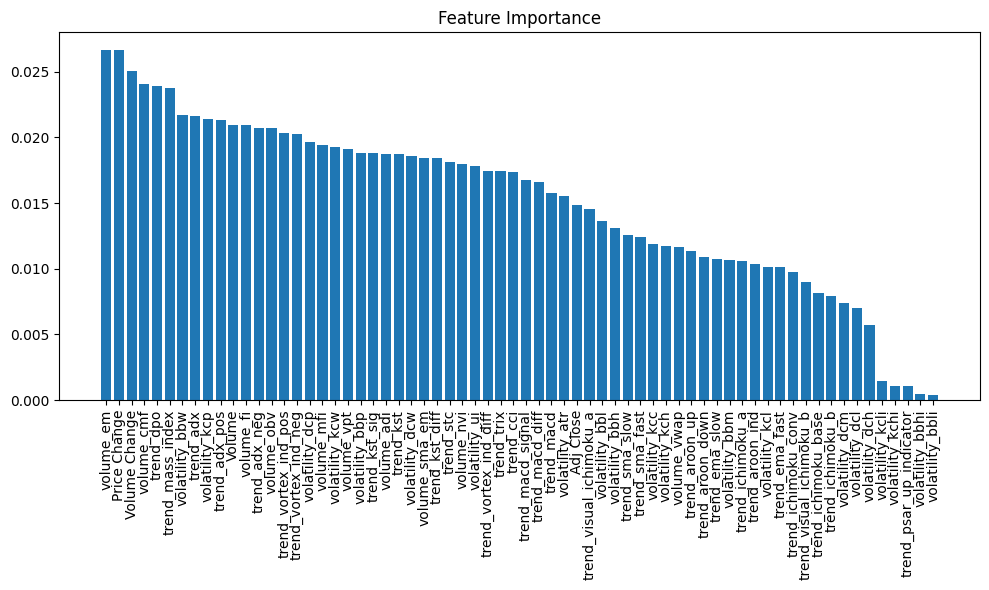

Top 66 features remaining
Score: 0.4781491002570694
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf', 'volume_fi', 'volume_em', 'volume_sma_em', 'volume_vpt', 'volume_vwap', 'volume_mfi', 'volume_nvi', 'volatility_bbm', 'volatility_bbh', 'volatility_bbl', 'volatility_bbw', 'volatility_bbp', 'volatility_bbhi', 'volatility_bbli', 'volatility_kcc', 'volatility_kch', 'volatility_kcl', 'volatility_kcw', 'volatility_kcp', 'volatility_kchi', 'volatility_kcli', 'volatility_dcl', 'volatility_dch', 'volatility_dcm', 'volatility_dcw', 'volatility_dcp', 'volatility_atr', 'volatility_ui', 'trend_macd', 'trend_macd_signal', 'trend_macd_diff', 'trend_sma_fast', 'trend_sma_slow', 'trend_ema_fast', 'trend_ema_slow', 'trend_vortex_ind_pos', 'trend_vortex_ind_neg', 'trend_vortex_ind_diff', 'trend_trix', 'trend_mass_index', 'trend_dpo', 'trend_kst', 'trend_kst_sig', 'trend_kst_diff', 'trend_ichimoku_conv', 'trend_ichimoku_base', 'trend_ichimoku_a'

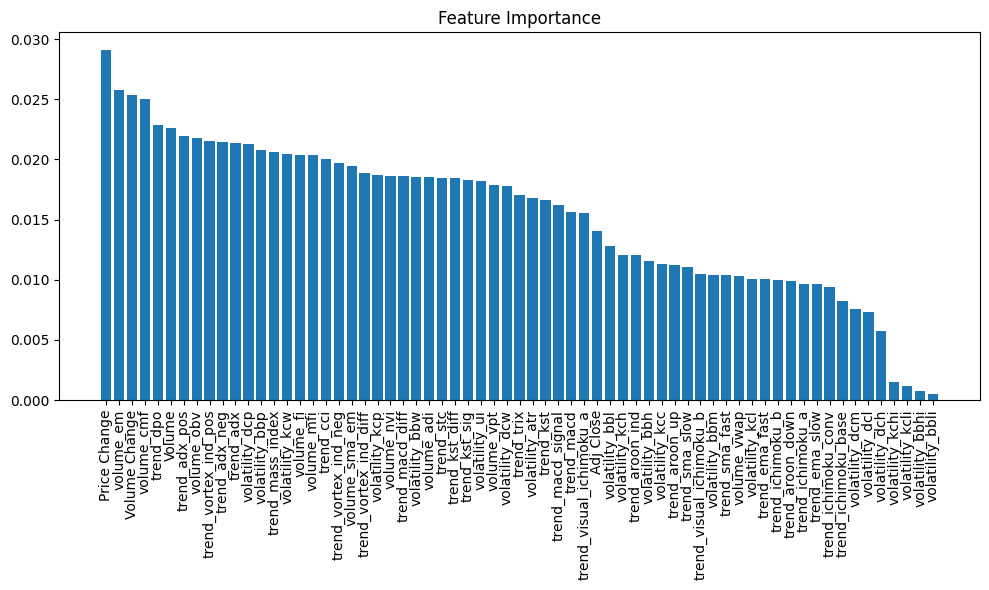

Top 65 features remaining
Score: 0.4730077120822622
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf', 'volume_fi', 'volume_em', 'volume_sma_em', 'volume_vpt', 'volume_vwap', 'volume_mfi', 'volume_nvi', 'volatility_bbm', 'volatility_bbh', 'volatility_bbl', 'volatility_bbw', 'volatility_bbp', 'volatility_bbhi', 'volatility_bbli', 'volatility_kcc', 'volatility_kch', 'volatility_kcl', 'volatility_kcw', 'volatility_kcp', 'volatility_kchi', 'volatility_kcli', 'volatility_dcl', 'volatility_dch', 'volatility_dcm', 'volatility_dcw', 'volatility_dcp', 'volatility_atr', 'volatility_ui', 'trend_macd', 'trend_macd_signal', 'trend_macd_diff', 'trend_sma_fast', 'trend_sma_slow', 'trend_ema_fast', 'trend_ema_slow', 'trend_vortex_ind_pos', 'trend_vortex_ind_neg', 'trend_vortex_ind_diff', 'trend_trix', 'trend_mass_index', 'trend_dpo', 'trend_kst', 'trend_kst_sig', 'trend_kst_diff', 'trend_ichimoku_conv', 'trend_ichimoku_base', 'trend_ichimoku_a'

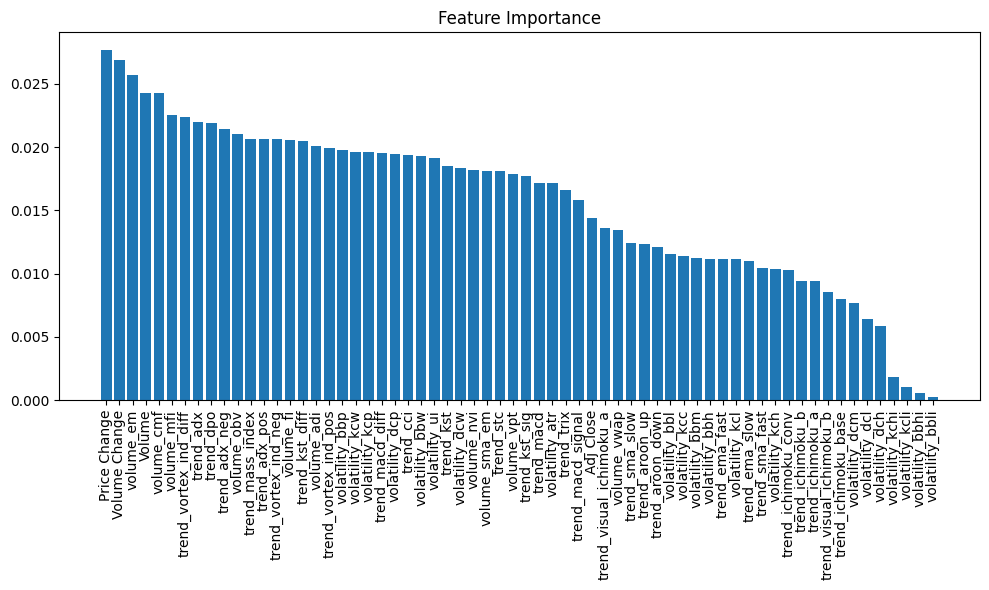

Top 64 features remaining
Score: 0.4473007712082262
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf', 'volume_fi', 'volume_em', 'volume_sma_em', 'volume_vpt', 'volume_vwap', 'volume_mfi', 'volume_nvi', 'volatility_bbm', 'volatility_bbh', 'volatility_bbl', 'volatility_bbw', 'volatility_bbp', 'volatility_bbhi', 'volatility_bbli', 'volatility_kcc', 'volatility_kch', 'volatility_kcl', 'volatility_kcw', 'volatility_kcp', 'volatility_kchi', 'volatility_kcli', 'volatility_dcl', 'volatility_dch', 'volatility_dcm', 'volatility_dcw', 'volatility_dcp', 'volatility_atr', 'volatility_ui', 'trend_macd', 'trend_macd_signal', 'trend_macd_diff', 'trend_sma_fast', 'trend_sma_slow', 'trend_ema_fast', 'trend_ema_slow', 'trend_vortex_ind_pos', 'trend_vortex_ind_neg', 'trend_vortex_ind_diff', 'trend_trix', 'trend_mass_index', 'trend_dpo', 'trend_kst', 'trend_kst_sig', 'trend_kst_diff', 'trend_ichimoku_conv', 'trend_ichimoku_base', 'trend_ichimoku_a'

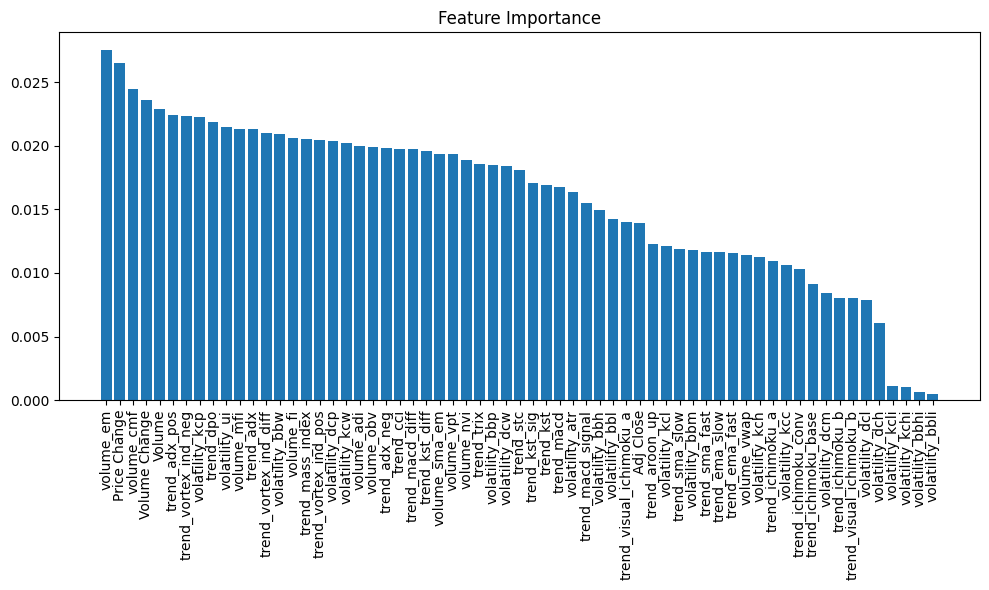

Top 63 features remaining
Score: 0.45758354755784064
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf', 'volume_fi', 'volume_em', 'volume_sma_em', 'volume_vpt', 'volume_vwap', 'volume_mfi', 'volume_nvi', 'volatility_bbm', 'volatility_bbh', 'volatility_bbl', 'volatility_bbw', 'volatility_bbp', 'volatility_bbhi', 'volatility_bbli', 'volatility_kcc', 'volatility_kch', 'volatility_kcl', 'volatility_kcw', 'volatility_kcp', 'volatility_kchi', 'volatility_kcli', 'volatility_dcl', 'volatility_dch', 'volatility_dcm', 'volatility_dcw', 'volatility_dcp', 'volatility_atr', 'volatility_ui', 'trend_macd', 'trend_macd_signal', 'trend_macd_diff', 'trend_sma_fast', 'trend_sma_slow', 'trend_ema_fast', 'trend_ema_slow', 'trend_vortex_ind_pos', 'trend_vortex_ind_neg', 'trend_vortex_ind_diff', 'trend_trix', 'trend_mass_index', 'trend_dpo', 'trend_kst', 'trend_kst_sig', 'trend_kst_diff', 'trend_ichimoku_conv', 'trend_ichimoku_base', 'trend_ichimoku_a

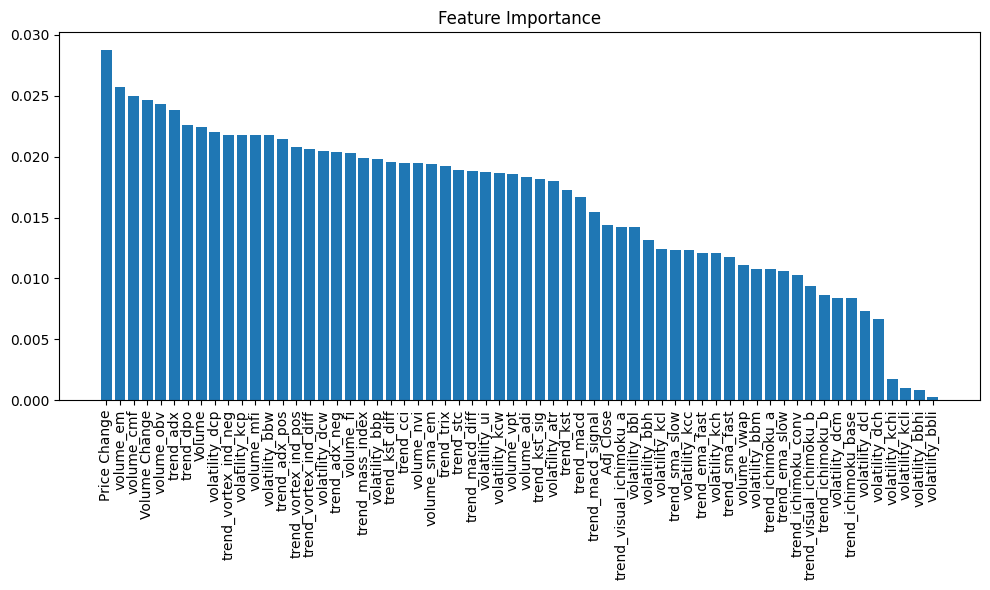

Top 62 features remaining
Score: 0.4704370179948586
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf', 'volume_fi', 'volume_em', 'volume_sma_em', 'volume_vpt', 'volume_vwap', 'volume_mfi', 'volume_nvi', 'volatility_bbm', 'volatility_bbh', 'volatility_bbl', 'volatility_bbw', 'volatility_bbp', 'volatility_bbhi', 'volatility_bbli', 'volatility_kcc', 'volatility_kch', 'volatility_kcl', 'volatility_kcw', 'volatility_kcp', 'volatility_kchi', 'volatility_kcli', 'volatility_dcl', 'volatility_dch', 'volatility_dcm', 'volatility_dcw', 'volatility_dcp', 'volatility_atr', 'volatility_ui', 'trend_macd', 'trend_macd_signal', 'trend_macd_diff', 'trend_sma_fast', 'trend_sma_slow', 'trend_ema_fast', 'trend_ema_slow', 'trend_vortex_ind_pos', 'trend_vortex_ind_neg', 'trend_vortex_ind_diff', 'trend_trix', 'trend_mass_index', 'trend_dpo', 'trend_kst', 'trend_kst_sig', 'trend_kst_diff', 'trend_ichimoku_conv', 'trend_ichimoku_base', 'trend_ichimoku_a'

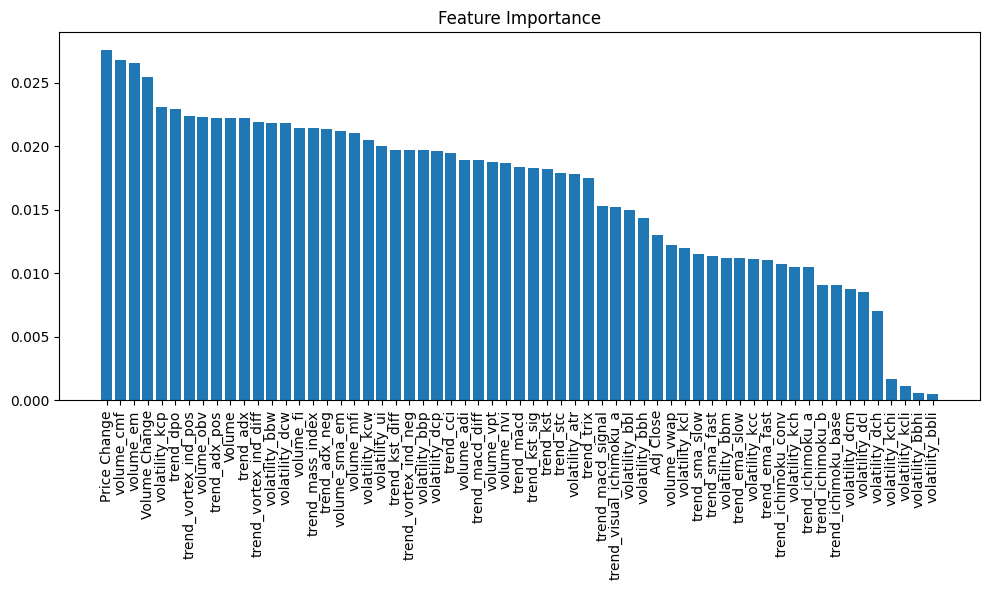

Top 61 features remaining
Score: 0.46272493573264784
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf', 'volume_fi', 'volume_em', 'volume_sma_em', 'volume_vpt', 'volume_vwap', 'volume_mfi', 'volume_nvi', 'volatility_bbm', 'volatility_bbh', 'volatility_bbl', 'volatility_bbw', 'volatility_bbp', 'volatility_bbhi', 'volatility_bbli', 'volatility_kcc', 'volatility_kch', 'volatility_kcl', 'volatility_kcw', 'volatility_kcp', 'volatility_kchi', 'volatility_kcli', 'volatility_dcl', 'volatility_dch', 'volatility_dcm', 'volatility_dcw', 'volatility_dcp', 'volatility_atr', 'volatility_ui', 'trend_macd', 'trend_macd_signal', 'trend_macd_diff', 'trend_sma_fast', 'trend_sma_slow', 'trend_ema_fast', 'trend_ema_slow', 'trend_vortex_ind_pos', 'trend_vortex_ind_neg', 'trend_vortex_ind_diff', 'trend_trix', 'trend_mass_index', 'trend_dpo', 'trend_kst', 'trend_kst_sig', 'trend_kst_diff', 'trend_ichimoku_conv', 'trend_ichimoku_base', 'trend_ichimoku_a

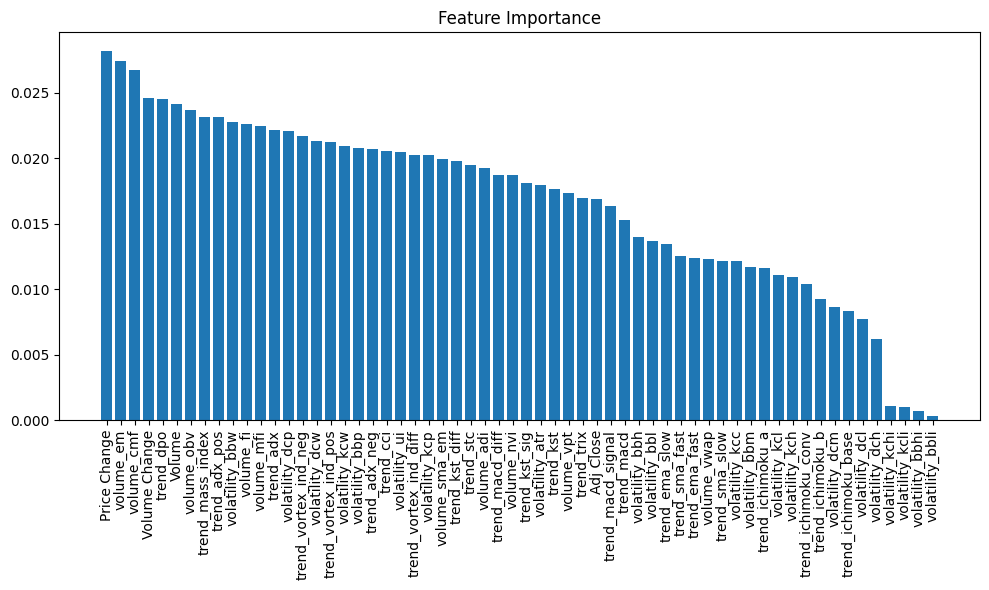

Top 60 features remaining
Score: 0.4601542416452442
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf', 'volume_fi', 'volume_em', 'volume_sma_em', 'volume_vpt', 'volume_vwap', 'volume_mfi', 'volume_nvi', 'volatility_bbm', 'volatility_bbh', 'volatility_bbl', 'volatility_bbw', 'volatility_bbp', 'volatility_bbhi', 'volatility_bbli', 'volatility_kcc', 'volatility_kch', 'volatility_kcl', 'volatility_kcw', 'volatility_kcp', 'volatility_kchi', 'volatility_kcli', 'volatility_dcl', 'volatility_dch', 'volatility_dcm', 'volatility_dcw', 'volatility_dcp', 'volatility_atr', 'volatility_ui', 'trend_macd', 'trend_macd_signal', 'trend_macd_diff', 'trend_sma_fast', 'trend_sma_slow', 'trend_ema_fast', 'trend_ema_slow', 'trend_vortex_ind_pos', 'trend_vortex_ind_neg', 'trend_vortex_ind_diff', 'trend_trix', 'trend_mass_index', 'trend_dpo', 'trend_kst', 'trend_kst_sig', 'trend_kst_diff', 'trend_ichimoku_conv', 'trend_ichimoku_base', 'trend_ichimoku_a'

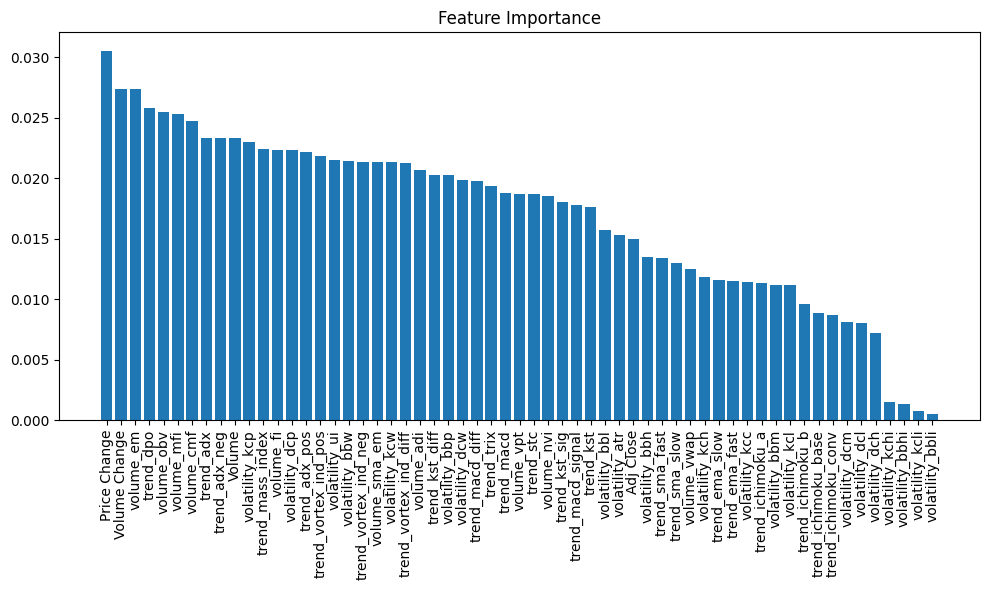

Top 59 features remaining
Score: 0.455012853470437
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf', 'volume_fi', 'volume_em', 'volume_sma_em', 'volume_vpt', 'volume_vwap', 'volume_mfi', 'volume_nvi', 'volatility_bbm', 'volatility_bbh', 'volatility_bbl', 'volatility_bbw', 'volatility_bbp', 'volatility_bbhi', 'volatility_bbli', 'volatility_kcc', 'volatility_kch', 'volatility_kcl', 'volatility_kcw', 'volatility_kcp', 'volatility_kchi', 'volatility_kcli', 'volatility_dcl', 'volatility_dch', 'volatility_dcm', 'volatility_dcw', 'volatility_dcp', 'volatility_atr', 'volatility_ui', 'trend_macd', 'trend_macd_signal', 'trend_macd_diff', 'trend_sma_fast', 'trend_sma_slow', 'trend_ema_fast', 'trend_ema_slow', 'trend_vortex_ind_pos', 'trend_vortex_ind_neg', 'trend_vortex_ind_diff', 'trend_trix', 'trend_mass_index', 'trend_dpo', 'trend_kst', 'trend_kst_sig', 'trend_kst_diff', 'trend_ichimoku_conv', 'trend_ichimoku_base', 'trend_ichimoku_a',

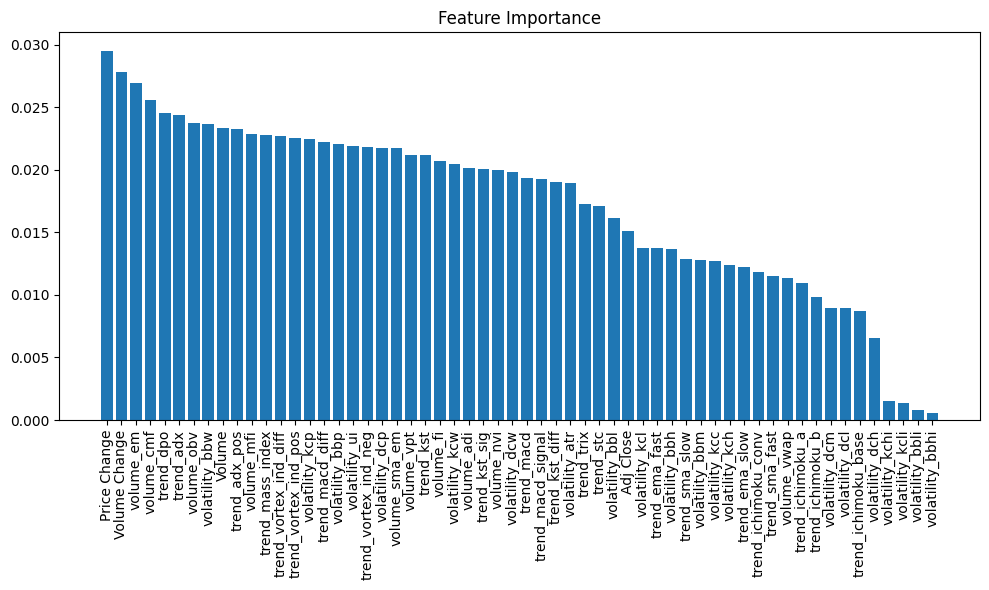

Top 58 features remaining
Score: 0.4652956298200514
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf', 'volume_fi', 'volume_em', 'volume_sma_em', 'volume_vpt', 'volume_vwap', 'volume_mfi', 'volume_nvi', 'volatility_bbm', 'volatility_bbh', 'volatility_bbl', 'volatility_bbw', 'volatility_bbp', 'volatility_bbhi', 'volatility_bbli', 'volatility_kcc', 'volatility_kch', 'volatility_kcl', 'volatility_kcw', 'volatility_kcp', 'volatility_kchi', 'volatility_kcli', 'volatility_dcl', 'volatility_dch', 'volatility_dcm', 'volatility_dcw', 'volatility_dcp', 'volatility_atr', 'volatility_ui', 'trend_macd', 'trend_macd_signal', 'trend_macd_diff', 'trend_sma_fast', 'trend_sma_slow', 'trend_ema_fast', 'trend_ema_slow', 'trend_vortex_ind_pos', 'trend_vortex_ind_neg', 'trend_vortex_ind_diff', 'trend_trix', 'trend_mass_index', 'trend_dpo', 'trend_kst', 'trend_kst_sig', 'trend_kst_diff', 'trend_ichimoku_conv', 'trend_ichimoku_base', 'trend_ichimoku_a'

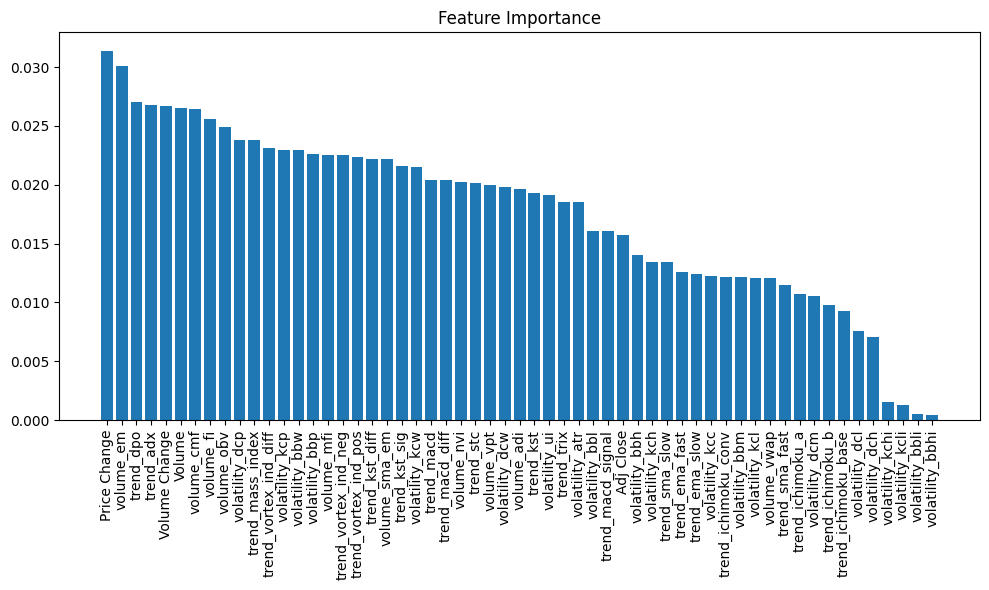

Top 57 features remaining
Score: 0.4524421593830334
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf', 'volume_fi', 'volume_em', 'volume_sma_em', 'volume_vpt', 'volume_vwap', 'volume_mfi', 'volume_nvi', 'volatility_bbm', 'volatility_bbh', 'volatility_bbl', 'volatility_bbw', 'volatility_bbp', 'volatility_bbhi', 'volatility_bbli', 'volatility_kcc', 'volatility_kch', 'volatility_kcl', 'volatility_kcw', 'volatility_kcp', 'volatility_kchi', 'volatility_kcli', 'volatility_dcl', 'volatility_dch', 'volatility_dcm', 'volatility_dcw', 'volatility_dcp', 'volatility_atr', 'volatility_ui', 'trend_macd', 'trend_macd_signal', 'trend_macd_diff', 'trend_sma_fast', 'trend_sma_slow', 'trend_ema_fast', 'trend_ema_slow', 'trend_vortex_ind_pos', 'trend_vortex_ind_neg', 'trend_vortex_ind_diff', 'trend_trix', 'trend_mass_index', 'trend_dpo', 'trend_kst', 'trend_kst_sig', 'trend_kst_diff', 'trend_ichimoku_conv', 'trend_ichimoku_base', 'trend_ichimoku_a'

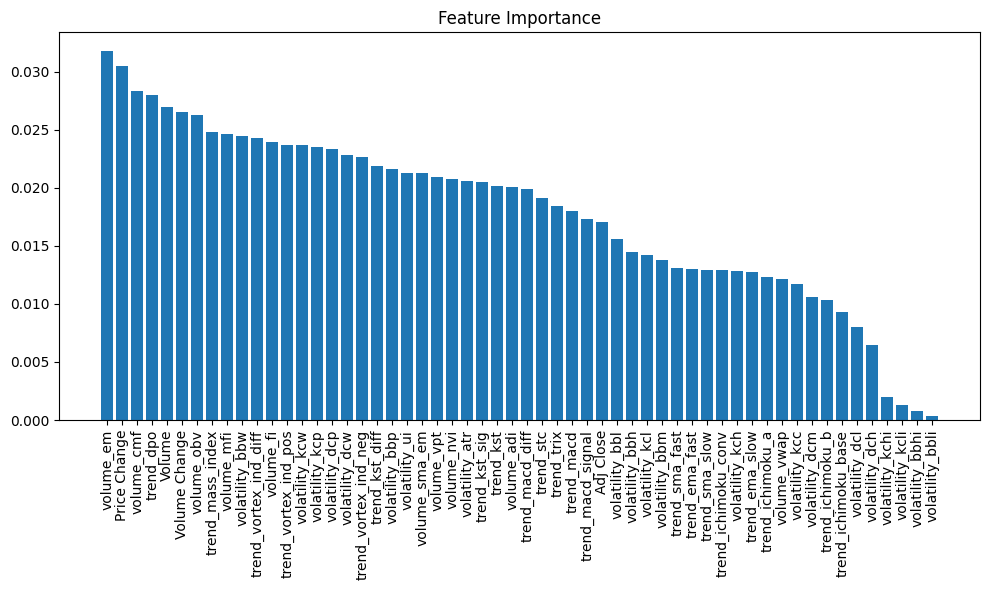

Top 56 features remaining
Score: 0.4704370179948586
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf', 'volume_fi', 'volume_em', 'volume_sma_em', 'volume_vpt', 'volume_vwap', 'volume_mfi', 'volume_nvi', 'volatility_bbm', 'volatility_bbh', 'volatility_bbl', 'volatility_bbw', 'volatility_bbp', 'volatility_bbhi', 'volatility_bbli', 'volatility_kcc', 'volatility_kch', 'volatility_kcl', 'volatility_kcw', 'volatility_kcp', 'volatility_kchi', 'volatility_kcli', 'volatility_dcl', 'volatility_dch', 'volatility_dcm', 'volatility_dcw', 'volatility_dcp', 'volatility_atr', 'volatility_ui', 'trend_macd', 'trend_macd_signal', 'trend_macd_diff', 'trend_sma_fast', 'trend_sma_slow', 'trend_ema_fast', 'trend_ema_slow', 'trend_vortex_ind_pos', 'trend_vortex_ind_neg', 'trend_vortex_ind_diff', 'trend_trix', 'trend_mass_index', 'trend_dpo', 'trend_kst', 'trend_kst_sig', 'trend_kst_diff', 'trend_ichimoku_conv', 'trend_ichimoku_base', 'trend_ichimoku_a'

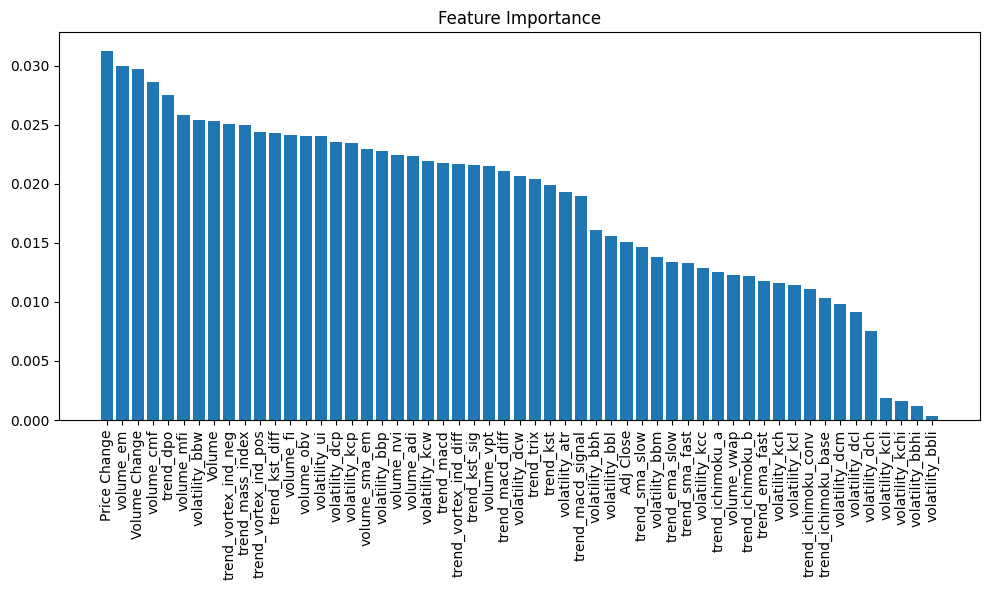

Top 55 features remaining
Score: 0.4498714652956298
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf', 'volume_fi', 'volume_em', 'volume_sma_em', 'volume_vpt', 'volume_vwap', 'volume_mfi', 'volume_nvi', 'volatility_bbm', 'volatility_bbh', 'volatility_bbl', 'volatility_bbw', 'volatility_bbp', 'volatility_bbhi', 'volatility_bbli', 'volatility_kcc', 'volatility_kch', 'volatility_kcl', 'volatility_kcw', 'volatility_kcp', 'volatility_kchi', 'volatility_kcli', 'volatility_dcl', 'volatility_dch', 'volatility_dcm', 'volatility_dcw', 'volatility_dcp', 'volatility_atr', 'volatility_ui', 'trend_macd', 'trend_macd_signal', 'trend_macd_diff', 'trend_sma_fast', 'trend_sma_slow', 'trend_ema_fast', 'trend_ema_slow', 'trend_vortex_ind_pos', 'trend_vortex_ind_neg', 'trend_vortex_ind_diff', 'trend_trix', 'trend_mass_index', 'trend_dpo', 'trend_kst', 'trend_kst_sig', 'trend_kst_diff', 'trend_ichimoku_conv', 'trend_ichimoku_base', 'trend_ichimoku_a'

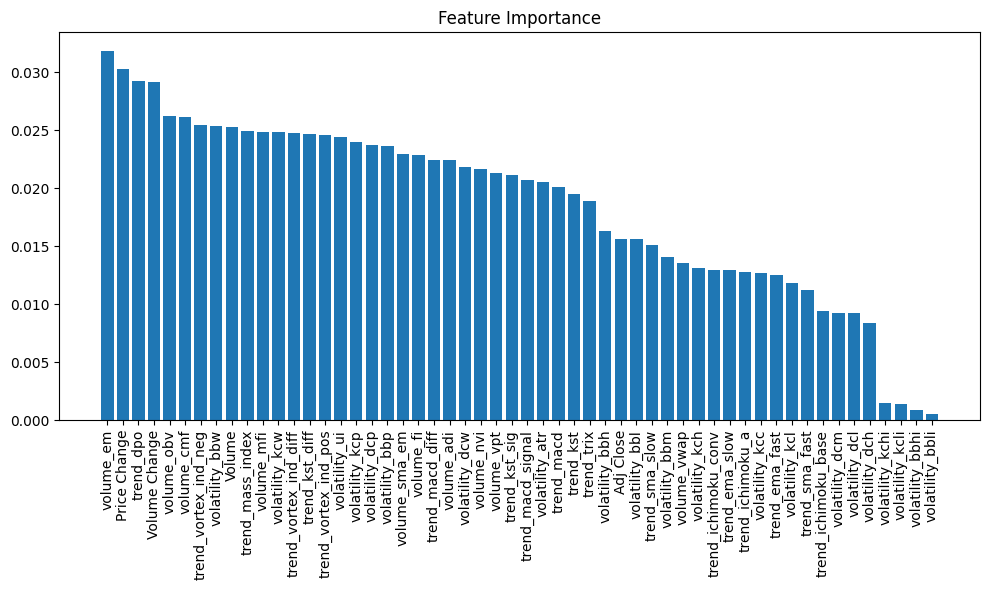

Top 54 features remaining
Score: 0.4370179948586118
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf', 'volume_fi', 'volume_em', 'volume_sma_em', 'volume_vpt', 'volume_vwap', 'volume_mfi', 'volume_nvi', 'volatility_bbm', 'volatility_bbh', 'volatility_bbl', 'volatility_bbw', 'volatility_bbp', 'volatility_bbhi', 'volatility_bbli', 'volatility_kcc', 'volatility_kch', 'volatility_kcl', 'volatility_kcw', 'volatility_kcp', 'volatility_kchi', 'volatility_kcli', 'volatility_dcl', 'volatility_dch', 'volatility_dcm', 'volatility_dcw', 'volatility_dcp', 'volatility_atr', 'volatility_ui', 'trend_macd', 'trend_macd_signal', 'trend_macd_diff', 'trend_sma_fast', 'trend_sma_slow', 'trend_ema_fast', 'trend_ema_slow', 'trend_vortex_ind_pos', 'trend_vortex_ind_neg', 'trend_vortex_ind_diff', 'trend_trix', 'trend_mass_index', 'trend_dpo', 'trend_kst', 'trend_kst_sig', 'trend_kst_diff', 'trend_ichimoku_conv', 'trend_ichimoku_base', 'trend_ichimoku_a'

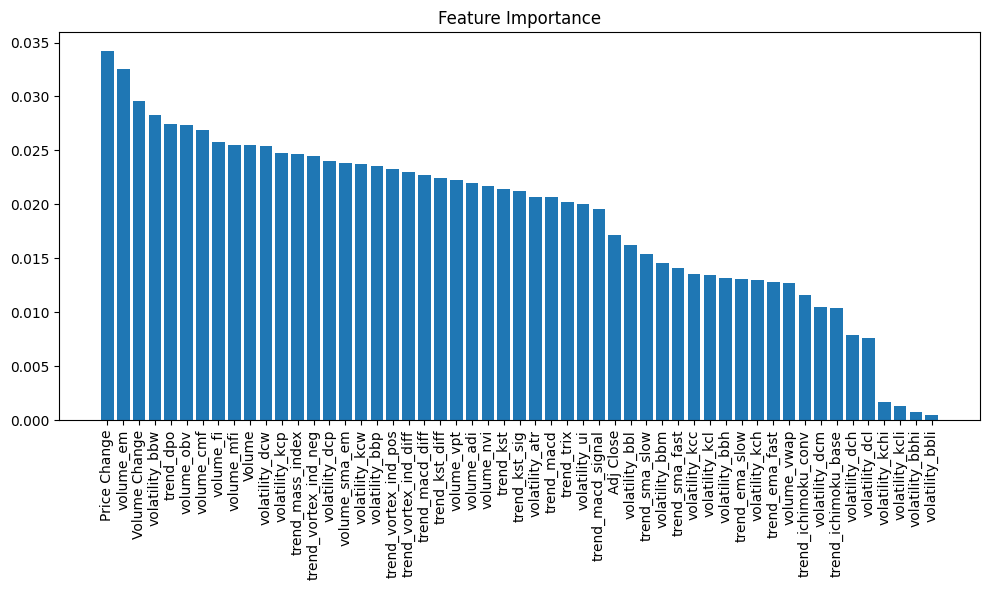

Top 53 features remaining
Score: 0.4601542416452442
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf', 'volume_fi', 'volume_em', 'volume_sma_em', 'volume_vpt', 'volume_vwap', 'volume_mfi', 'volume_nvi', 'volatility_bbm', 'volatility_bbh', 'volatility_bbl', 'volatility_bbw', 'volatility_bbp', 'volatility_bbhi', 'volatility_bbli', 'volatility_kcc', 'volatility_kch', 'volatility_kcl', 'volatility_kcw', 'volatility_kcp', 'volatility_kchi', 'volatility_kcli', 'volatility_dcl', 'volatility_dch', 'volatility_dcm', 'volatility_dcw', 'volatility_dcp', 'volatility_atr', 'volatility_ui', 'trend_macd', 'trend_macd_signal', 'trend_macd_diff', 'trend_sma_fast', 'trend_sma_slow', 'trend_ema_fast', 'trend_ema_slow', 'trend_vortex_ind_pos', 'trend_vortex_ind_neg', 'trend_vortex_ind_diff', 'trend_trix', 'trend_mass_index', 'trend_dpo', 'trend_kst', 'trend_kst_sig', 'trend_kst_diff', 'trend_ichimoku_conv', 'trend_ichimoku_base']
importances: [0.01

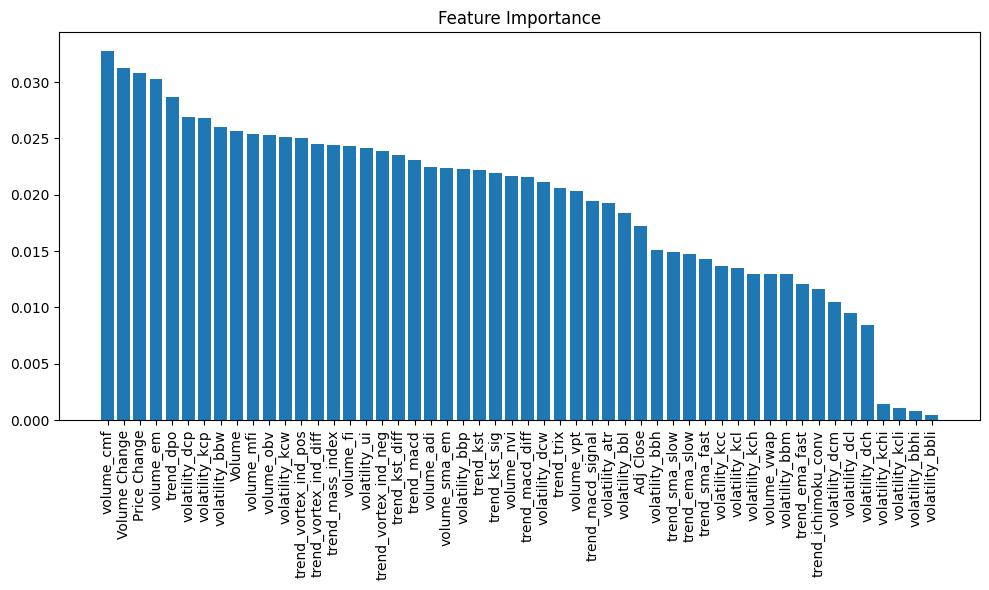

Top 52 features remaining
Score: 0.46272493573264784
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf', 'volume_fi', 'volume_em', 'volume_sma_em', 'volume_vpt', 'volume_vwap', 'volume_mfi', 'volume_nvi', 'volatility_bbm', 'volatility_bbh', 'volatility_bbl', 'volatility_bbw', 'volatility_bbp', 'volatility_bbhi', 'volatility_bbli', 'volatility_kcc', 'volatility_kch', 'volatility_kcl', 'volatility_kcw', 'volatility_kcp', 'volatility_kchi', 'volatility_kcli', 'volatility_dcl', 'volatility_dch', 'volatility_dcm', 'volatility_dcw', 'volatility_dcp', 'volatility_atr', 'volatility_ui', 'trend_macd', 'trend_macd_signal', 'trend_macd_diff', 'trend_sma_fast', 'trend_sma_slow', 'trend_ema_fast', 'trend_ema_slow', 'trend_vortex_ind_pos', 'trend_vortex_ind_neg', 'trend_vortex_ind_diff', 'trend_trix', 'trend_mass_index', 'trend_dpo', 'trend_kst', 'trend_kst_sig', 'trend_kst_diff', 'trend_ichimoku_conv']
importances: [0.01720604 0.0256871  0.03

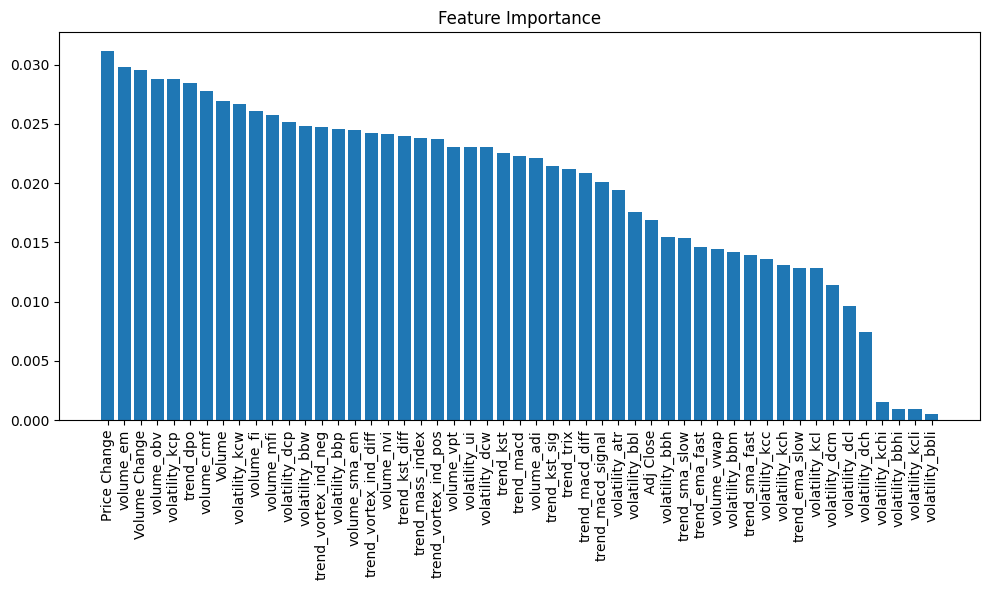

Top 51 features remaining
Score: 0.4601542416452442
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf', 'volume_fi', 'volume_em', 'volume_sma_em', 'volume_vpt', 'volume_vwap', 'volume_mfi', 'volume_nvi', 'volatility_bbm', 'volatility_bbh', 'volatility_bbl', 'volatility_bbw', 'volatility_bbp', 'volatility_bbhi', 'volatility_bbli', 'volatility_kcc', 'volatility_kch', 'volatility_kcl', 'volatility_kcw', 'volatility_kcp', 'volatility_kchi', 'volatility_kcli', 'volatility_dcl', 'volatility_dch', 'volatility_dcm', 'volatility_dcw', 'volatility_dcp', 'volatility_atr', 'volatility_ui', 'trend_macd', 'trend_macd_signal', 'trend_macd_diff', 'trend_sma_fast', 'trend_sma_slow', 'trend_ema_fast', 'trend_ema_slow', 'trend_vortex_ind_pos', 'trend_vortex_ind_neg', 'trend_vortex_ind_diff', 'trend_trix', 'trend_mass_index', 'trend_dpo', 'trend_kst', 'trend_kst_sig', 'trend_kst_diff']
importances: [0.01686283 0.02693946 0.03117894 0.02958292 0.0221

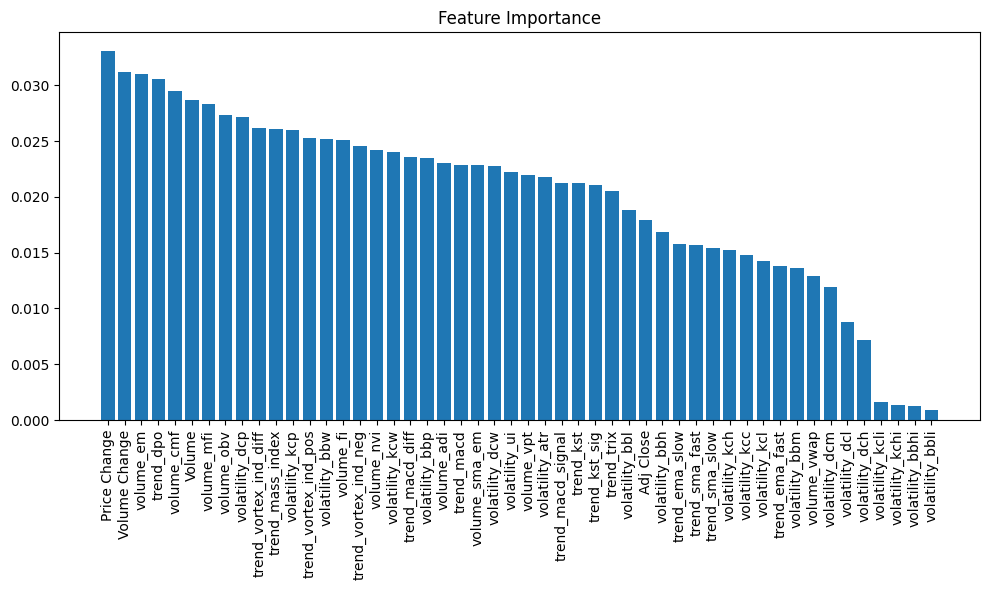

Top 50 features remaining
Score: 0.46786632390745503
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf', 'volume_fi', 'volume_em', 'volume_sma_em', 'volume_vpt', 'volume_vwap', 'volume_mfi', 'volume_nvi', 'volatility_bbm', 'volatility_bbh', 'volatility_bbl', 'volatility_bbw', 'volatility_bbp', 'volatility_bbhi', 'volatility_bbli', 'volatility_kcc', 'volatility_kch', 'volatility_kcl', 'volatility_kcw', 'volatility_kcp', 'volatility_kchi', 'volatility_kcli', 'volatility_dcl', 'volatility_dch', 'volatility_dcm', 'volatility_dcw', 'volatility_dcp', 'volatility_atr', 'volatility_ui', 'trend_macd', 'trend_macd_signal', 'trend_macd_diff', 'trend_sma_fast', 'trend_sma_slow', 'trend_ema_fast', 'trend_ema_slow', 'trend_vortex_ind_pos', 'trend_vortex_ind_neg', 'trend_vortex_ind_diff', 'trend_trix', 'trend_mass_index', 'trend_dpo', 'trend_kst', 'trend_kst_sig']
importances: [0.0179349  0.02867425 0.03309192 0.0311971  0.02300159 0.02738123
 

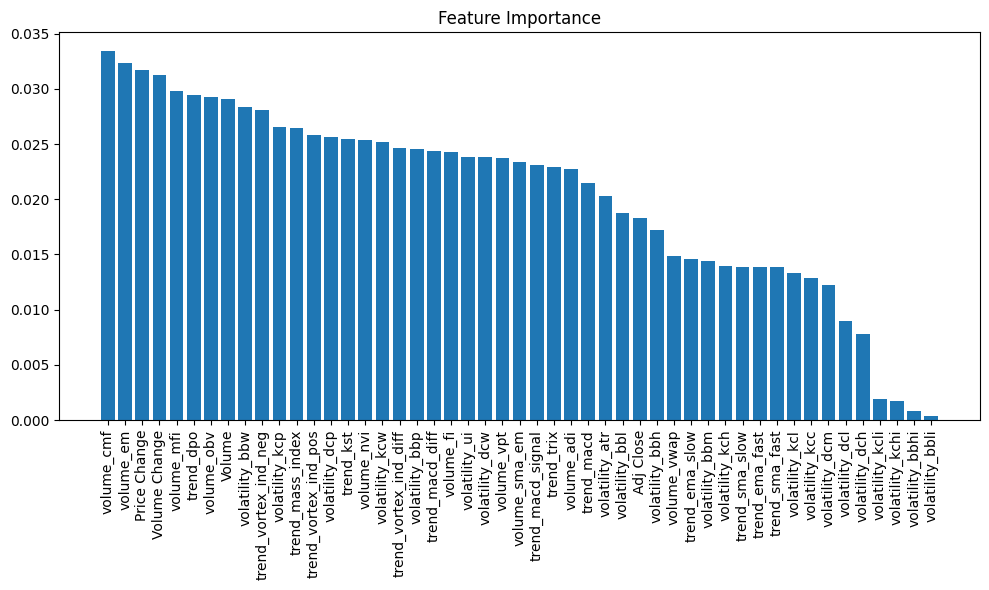

Top 49 features remaining
Score: 0.48586118251928023
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf', 'volume_fi', 'volume_em', 'volume_sma_em', 'volume_vpt', 'volume_vwap', 'volume_mfi', 'volume_nvi', 'volatility_bbm', 'volatility_bbh', 'volatility_bbl', 'volatility_bbw', 'volatility_bbp', 'volatility_bbhi', 'volatility_bbli', 'volatility_kcc', 'volatility_kch', 'volatility_kcl', 'volatility_kcw', 'volatility_kcp', 'volatility_kchi', 'volatility_kcli', 'volatility_dcl', 'volatility_dch', 'volatility_dcm', 'volatility_dcw', 'volatility_dcp', 'volatility_atr', 'volatility_ui', 'trend_macd', 'trend_macd_signal', 'trend_macd_diff', 'trend_sma_fast', 'trend_sma_slow', 'trend_ema_fast', 'trend_ema_slow', 'trend_vortex_ind_pos', 'trend_vortex_ind_neg', 'trend_vortex_ind_diff', 'trend_trix', 'trend_mass_index', 'trend_dpo', 'trend_kst']
importances: [0.01827751 0.02911989 0.03174107 0.03127976 0.02273423 0.02927667
 0.0334499  0.0242

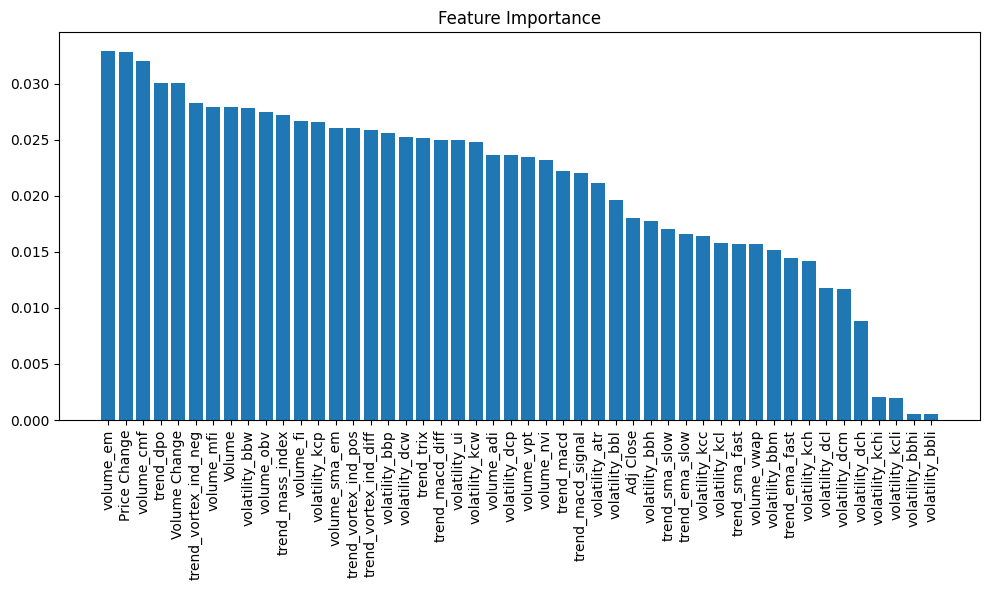

Top 48 features remaining
Score: 0.46786632390745503
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf', 'volume_fi', 'volume_em', 'volume_sma_em', 'volume_vpt', 'volume_vwap', 'volume_mfi', 'volume_nvi', 'volatility_bbm', 'volatility_bbh', 'volatility_bbl', 'volatility_bbw', 'volatility_bbp', 'volatility_bbhi', 'volatility_bbli', 'volatility_kcc', 'volatility_kch', 'volatility_kcl', 'volatility_kcw', 'volatility_kcp', 'volatility_kchi', 'volatility_kcli', 'volatility_dcl', 'volatility_dch', 'volatility_dcm', 'volatility_dcw', 'volatility_dcp', 'volatility_atr', 'volatility_ui', 'trend_macd', 'trend_macd_signal', 'trend_macd_diff', 'trend_sma_fast', 'trend_sma_slow', 'trend_ema_fast', 'trend_ema_slow', 'trend_vortex_ind_pos', 'trend_vortex_ind_neg', 'trend_vortex_ind_diff', 'trend_trix', 'trend_mass_index', 'trend_dpo']
importances: [0.01799384 0.02795991 0.03280001 0.030054   0.02366171 0.02745341
 0.03200899 0.02670538 0.032946

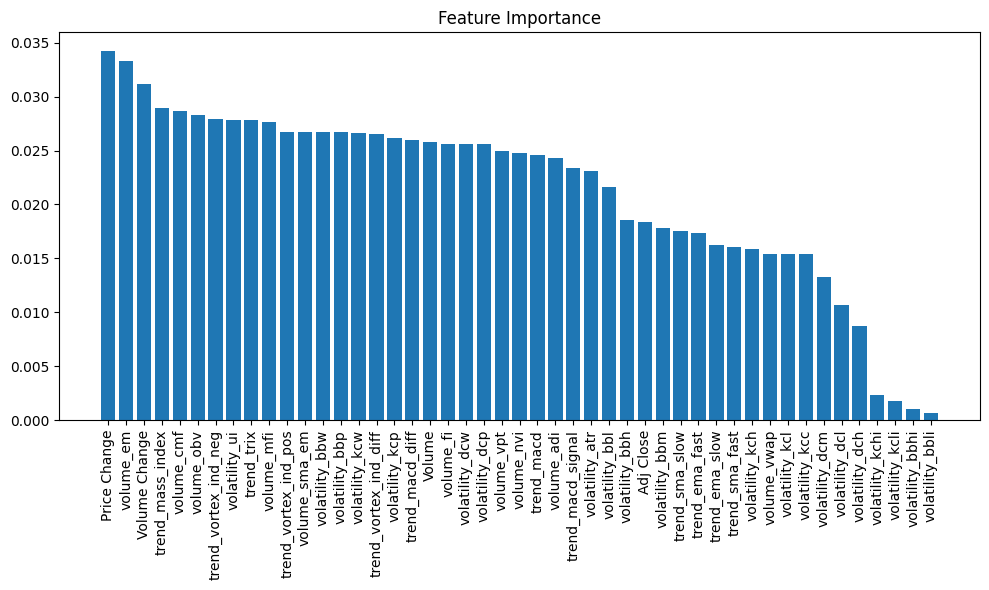

Top 47 features remaining
Score: 0.4498714652956298
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf', 'volume_fi', 'volume_em', 'volume_sma_em', 'volume_vpt', 'volume_vwap', 'volume_mfi', 'volume_nvi', 'volatility_bbm', 'volatility_bbh', 'volatility_bbl', 'volatility_bbw', 'volatility_bbp', 'volatility_bbhi', 'volatility_bbli', 'volatility_kcc', 'volatility_kch', 'volatility_kcl', 'volatility_kcw', 'volatility_kcp', 'volatility_kchi', 'volatility_kcli', 'volatility_dcl', 'volatility_dch', 'volatility_dcm', 'volatility_dcw', 'volatility_dcp', 'volatility_atr', 'volatility_ui', 'trend_macd', 'trend_macd_signal', 'trend_macd_diff', 'trend_sma_fast', 'trend_sma_slow', 'trend_ema_fast', 'trend_ema_slow', 'trend_vortex_ind_pos', 'trend_vortex_ind_neg', 'trend_vortex_ind_diff', 'trend_trix', 'trend_mass_index']
importances: [0.01834958 0.02580449 0.03426047 0.03115654 0.02430746 0.02831308
 0.02869467 0.02563141 0.03333492 0.02674383 

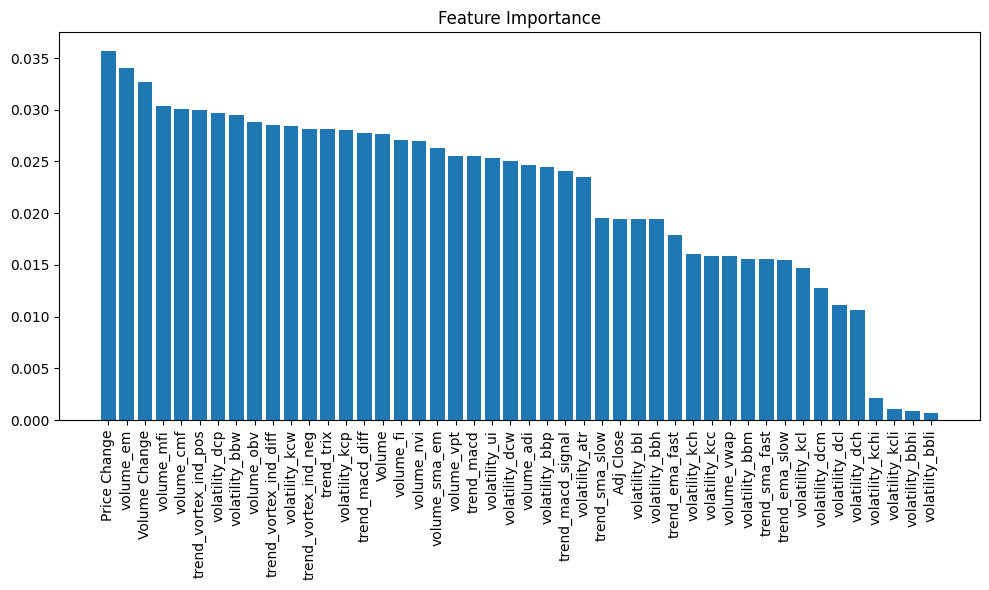

Top 46 features remaining
Score: 0.4832904884318766
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf', 'volume_fi', 'volume_em', 'volume_sma_em', 'volume_vpt', 'volume_vwap', 'volume_mfi', 'volume_nvi', 'volatility_bbm', 'volatility_bbh', 'volatility_bbl', 'volatility_bbw', 'volatility_bbp', 'volatility_bbhi', 'volatility_bbli', 'volatility_kcc', 'volatility_kch', 'volatility_kcl', 'volatility_kcw', 'volatility_kcp', 'volatility_kchi', 'volatility_kcli', 'volatility_dcl', 'volatility_dch', 'volatility_dcm', 'volatility_dcw', 'volatility_dcp', 'volatility_atr', 'volatility_ui', 'trend_macd', 'trend_macd_signal', 'trend_macd_diff', 'trend_sma_fast', 'trend_sma_slow', 'trend_ema_fast', 'trend_ema_slow', 'trend_vortex_ind_pos', 'trend_vortex_ind_neg', 'trend_vortex_ind_diff', 'trend_trix']
importances: [0.01945761 0.02767897 0.03569972 0.03265811 0.02465929 0.02883062
 0.03010893 0.02702893 0.03399892 0.02629434 0.02554048 0.0158515

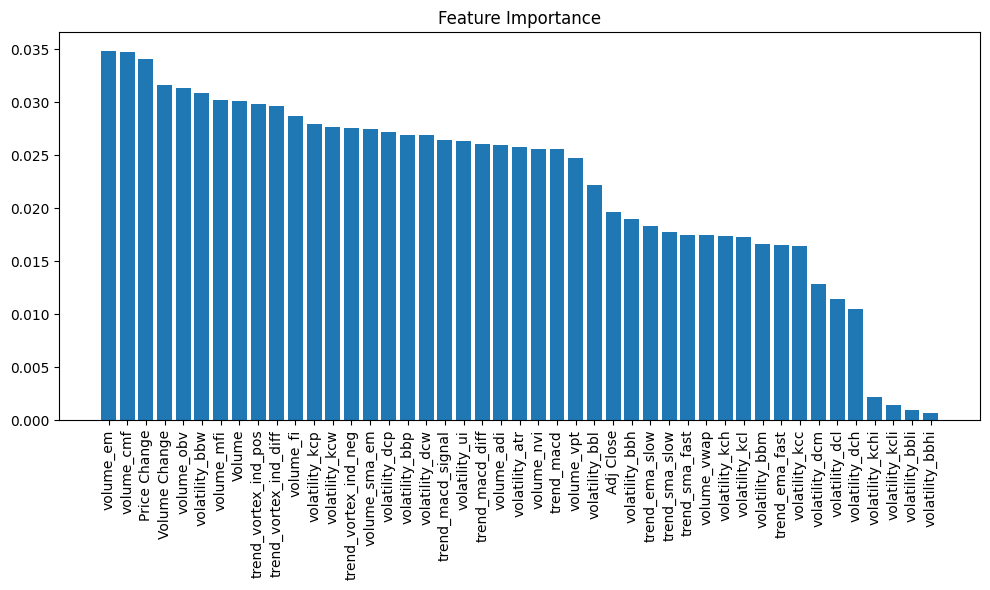

Top 45 features remaining
Score: 0.4704370179948586
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf', 'volume_fi', 'volume_em', 'volume_sma_em', 'volume_vpt', 'volume_vwap', 'volume_mfi', 'volume_nvi', 'volatility_bbm', 'volatility_bbh', 'volatility_bbl', 'volatility_bbw', 'volatility_bbp', 'volatility_bbhi', 'volatility_bbli', 'volatility_kcc', 'volatility_kch', 'volatility_kcl', 'volatility_kcw', 'volatility_kcp', 'volatility_kchi', 'volatility_kcli', 'volatility_dcl', 'volatility_dch', 'volatility_dcm', 'volatility_dcw', 'volatility_dcp', 'volatility_atr', 'volatility_ui', 'trend_macd', 'trend_macd_signal', 'trend_macd_diff', 'trend_sma_fast', 'trend_sma_slow', 'trend_ema_fast', 'trend_ema_slow', 'trend_vortex_ind_pos', 'trend_vortex_ind_neg', 'trend_vortex_ind_diff']
importances: [0.01966813 0.03013842 0.03403005 0.03159926 0.02595207 0.0312908
 0.03468951 0.02868299 0.034844   0.02748929 0.02476495 0.01747044
 0.03016733 0

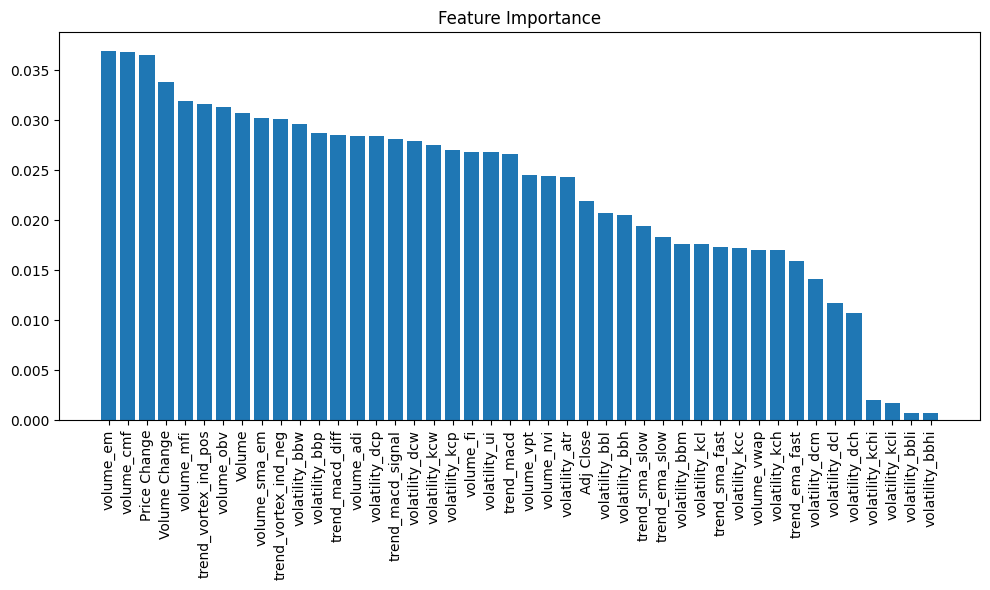

Top 44 features remaining
Score: 0.4704370179948586
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf', 'volume_fi', 'volume_em', 'volume_sma_em', 'volume_vpt', 'volume_vwap', 'volume_mfi', 'volume_nvi', 'volatility_bbm', 'volatility_bbh', 'volatility_bbl', 'volatility_bbw', 'volatility_bbp', 'volatility_bbhi', 'volatility_bbli', 'volatility_kcc', 'volatility_kch', 'volatility_kcl', 'volatility_kcw', 'volatility_kcp', 'volatility_kchi', 'volatility_kcli', 'volatility_dcl', 'volatility_dch', 'volatility_dcm', 'volatility_dcw', 'volatility_dcp', 'volatility_atr', 'volatility_ui', 'trend_macd', 'trend_macd_signal', 'trend_macd_diff', 'trend_sma_fast', 'trend_sma_slow', 'trend_ema_fast', 'trend_ema_slow', 'trend_vortex_ind_pos', 'trend_vortex_ind_neg']
importances: [0.02191848 0.03068919 0.03655904 0.03387757 0.02846871 0.03130249
 0.03682491 0.02682004 0.03695717 0.03020865 0.02447811 0.01697923
 0.03191153 0.02444843 0.01764651 0.0

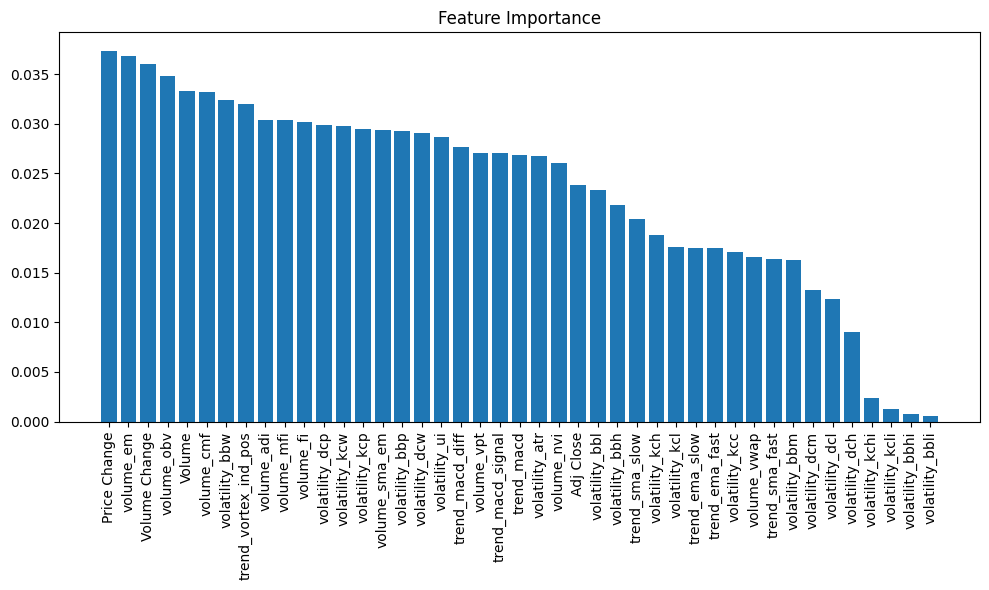

Top 43 features remaining
Score: 0.46272493573264784
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf', 'volume_fi', 'volume_em', 'volume_sma_em', 'volume_vpt', 'volume_vwap', 'volume_mfi', 'volume_nvi', 'volatility_bbm', 'volatility_bbh', 'volatility_bbl', 'volatility_bbw', 'volatility_bbp', 'volatility_bbhi', 'volatility_bbli', 'volatility_kcc', 'volatility_kch', 'volatility_kcl', 'volatility_kcw', 'volatility_kcp', 'volatility_kchi', 'volatility_kcli', 'volatility_dcl', 'volatility_dch', 'volatility_dcm', 'volatility_dcw', 'volatility_dcp', 'volatility_atr', 'volatility_ui', 'trend_macd', 'trend_macd_signal', 'trend_macd_diff', 'trend_sma_fast', 'trend_sma_slow', 'trend_ema_fast', 'trend_ema_slow', 'trend_vortex_ind_pos']
importances: [0.02383046 0.03324667 0.03733059 0.03598091 0.03039044 0.03481449
 0.03317531 0.03012331 0.03682562 0.02938764 0.02708675 0.01658627
 0.03032722 0.02600292 0.01631082 0.02182584 0.02328119 0.03

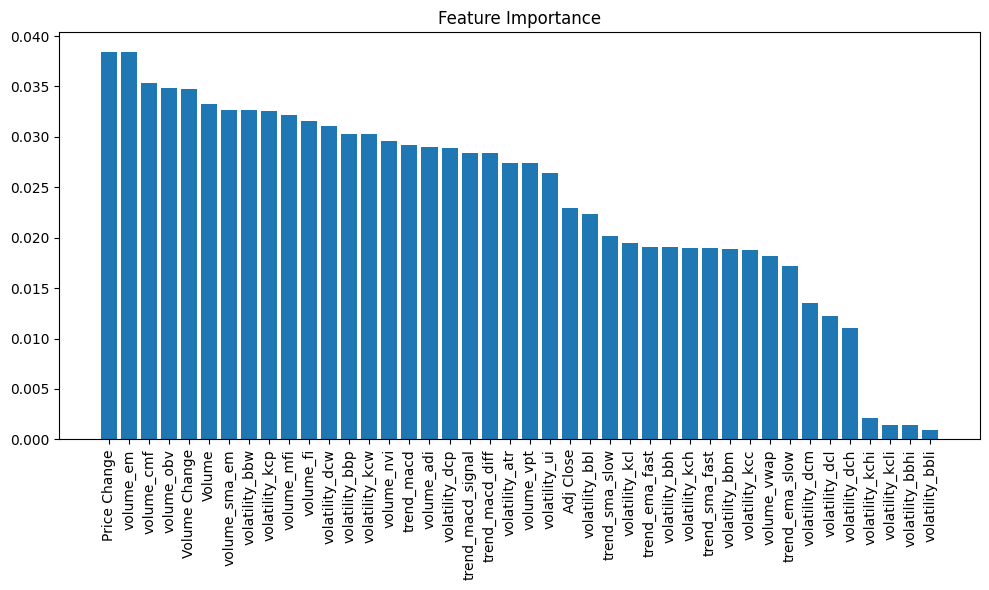

Top 42 features remaining
Score: 0.4704370179948586
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf', 'volume_fi', 'volume_em', 'volume_sma_em', 'volume_vpt', 'volume_vwap', 'volume_mfi', 'volume_nvi', 'volatility_bbm', 'volatility_bbh', 'volatility_bbl', 'volatility_bbw', 'volatility_bbp', 'volatility_bbhi', 'volatility_bbli', 'volatility_kcc', 'volatility_kch', 'volatility_kcl', 'volatility_kcw', 'volatility_kcp', 'volatility_kchi', 'volatility_kcli', 'volatility_dcl', 'volatility_dch', 'volatility_dcm', 'volatility_dcw', 'volatility_dcp', 'volatility_atr', 'volatility_ui', 'trend_macd', 'trend_macd_signal', 'trend_macd_diff', 'trend_sma_fast', 'trend_sma_slow', 'trend_ema_fast', 'trend_ema_slow']
importances: [0.02291095 0.03330748 0.03844424 0.03476529 0.02897013 0.03486418
 0.03535907 0.03156187 0.03840349 0.03266096 0.02737589 0.01820708
 0.0321268  0.02963485 0.01890014 0.019087   0.0223085  0.03262712
 0.03032157 0.0014

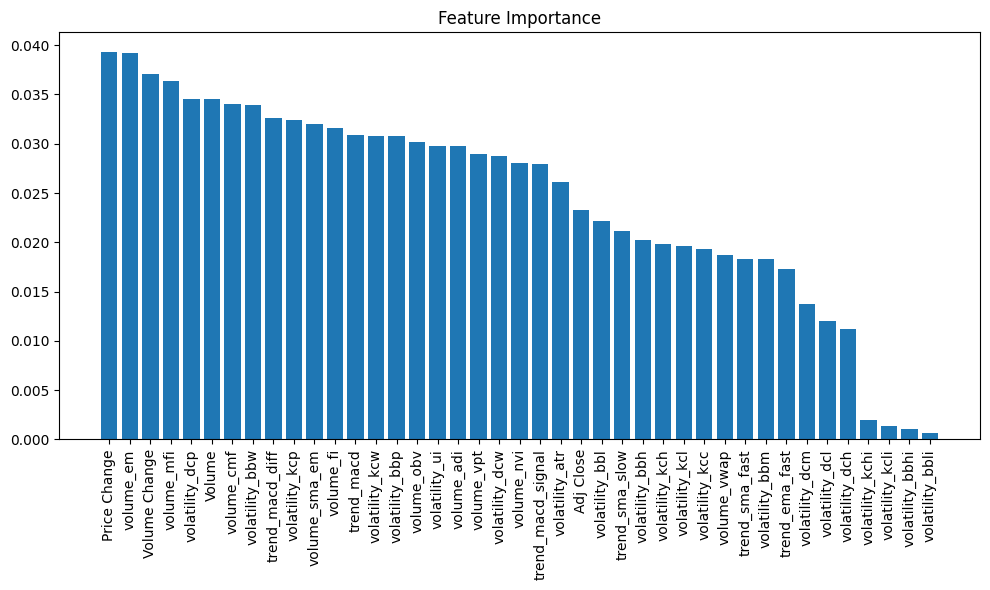

Top 41 features remaining
Score: 0.46786632390745503
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf', 'volume_fi', 'volume_em', 'volume_sma_em', 'volume_vpt', 'volume_vwap', 'volume_mfi', 'volume_nvi', 'volatility_bbm', 'volatility_bbh', 'volatility_bbl', 'volatility_bbw', 'volatility_bbp', 'volatility_bbhi', 'volatility_bbli', 'volatility_kcc', 'volatility_kch', 'volatility_kcl', 'volatility_kcw', 'volatility_kcp', 'volatility_kchi', 'volatility_kcli', 'volatility_dcl', 'volatility_dch', 'volatility_dcm', 'volatility_dcw', 'volatility_dcp', 'volatility_atr', 'volatility_ui', 'trend_macd', 'trend_macd_signal', 'trend_macd_diff', 'trend_sma_fast', 'trend_sma_slow', 'trend_ema_fast']
importances: [0.0232638  0.03452208 0.03933912 0.03706247 0.02973585 0.03013058
 0.03405509 0.03158689 0.0392363  0.03200767 0.02900286 0.01871535
 0.03637433 0.02802913 0.01827243 0.02027653 0.02220878 0.03392609
 0.03078389 0.00104438 0.0006635  0

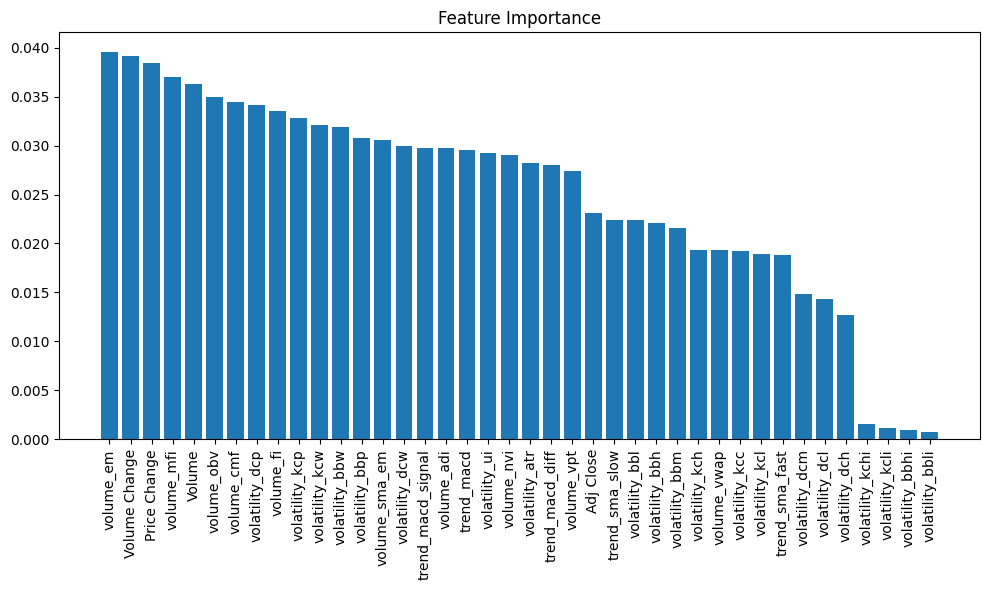

Top 40 features remaining
Score: 0.4652956298200514
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf', 'volume_fi', 'volume_em', 'volume_sma_em', 'volume_vpt', 'volume_vwap', 'volume_mfi', 'volume_nvi', 'volatility_bbm', 'volatility_bbh', 'volatility_bbl', 'volatility_bbw', 'volatility_bbp', 'volatility_bbhi', 'volatility_bbli', 'volatility_kcc', 'volatility_kch', 'volatility_kcl', 'volatility_kcw', 'volatility_kcp', 'volatility_kchi', 'volatility_kcli', 'volatility_dcl', 'volatility_dch', 'volatility_dcm', 'volatility_dcw', 'volatility_dcp', 'volatility_atr', 'volatility_ui', 'trend_macd', 'trend_macd_signal', 'trend_macd_diff', 'trend_sma_fast', 'trend_sma_slow']
importances: [0.023086   0.0363098  0.0383896  0.03915883 0.02971569 0.03490753
 0.03446567 0.03351337 0.03957901 0.03055098 0.02743767 0.01929131
 0.03698435 0.0290624  0.02159667 0.02209786 0.02238718 0.03186545
 0.0307981  0.00095416 0.00076068 0.01919436 0.0193295

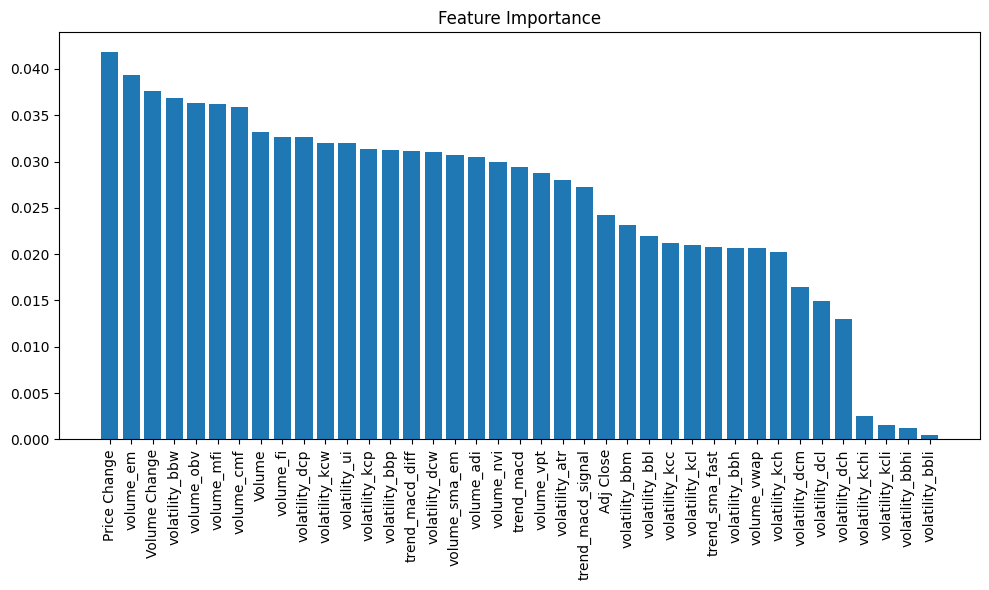

Top 39 features remaining
Score: 0.4704370179948586
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf', 'volume_fi', 'volume_em', 'volume_sma_em', 'volume_vpt', 'volume_vwap', 'volume_mfi', 'volume_nvi', 'volatility_bbm', 'volatility_bbh', 'volatility_bbl', 'volatility_bbw', 'volatility_bbp', 'volatility_bbhi', 'volatility_bbli', 'volatility_kcc', 'volatility_kch', 'volatility_kcl', 'volatility_kcw', 'volatility_kcp', 'volatility_kchi', 'volatility_kcli', 'volatility_dcl', 'volatility_dch', 'volatility_dcm', 'volatility_dcw', 'volatility_dcp', 'volatility_atr', 'volatility_ui', 'trend_macd', 'trend_macd_signal', 'trend_macd_diff', 'trend_sma_fast']
importances: [0.02423707 0.03322751 0.04185668 0.03756669 0.03048447 0.03631921
 0.0359337  0.03267169 0.03932028 0.03070822 0.0287697  0.02063278
 0.03622137 0.02991035 0.02312912 0.0206356  0.02196213 0.03685395
 0.03128144 0.00125065 0.00042626 0.02122722 0.02022857 0.02101296
 0.03

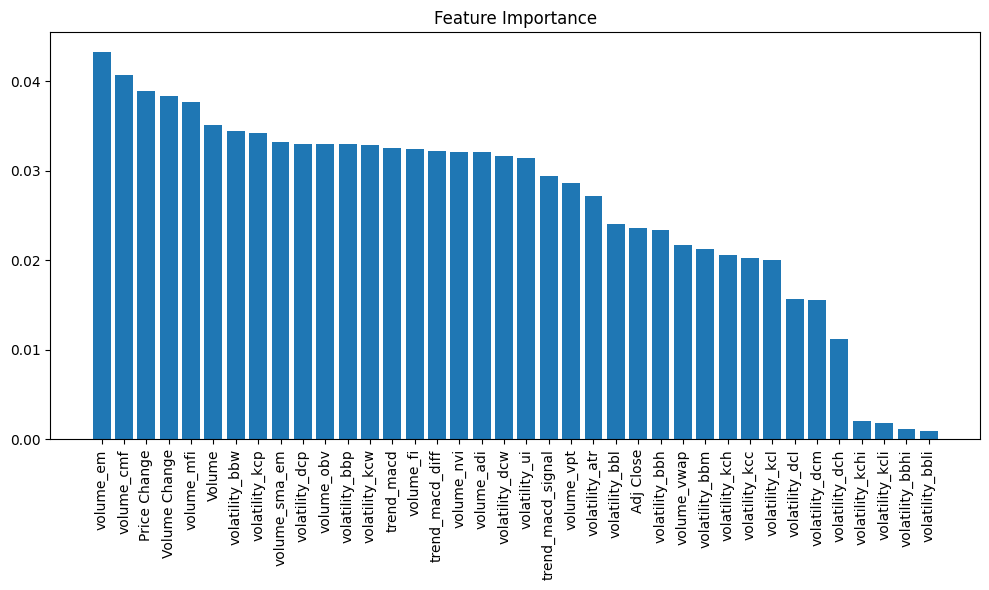

Top 38 features remaining
Score: 0.4832904884318766
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf', 'volume_fi', 'volume_em', 'volume_sma_em', 'volume_vpt', 'volume_vwap', 'volume_mfi', 'volume_nvi', 'volatility_bbm', 'volatility_bbh', 'volatility_bbl', 'volatility_bbw', 'volatility_bbp', 'volatility_bbhi', 'volatility_bbli', 'volatility_kcc', 'volatility_kch', 'volatility_kcl', 'volatility_kcw', 'volatility_kcp', 'volatility_kchi', 'volatility_kcli', 'volatility_dcl', 'volatility_dch', 'volatility_dcm', 'volatility_dcw', 'volatility_dcp', 'volatility_atr', 'volatility_ui', 'trend_macd', 'trend_macd_signal', 'trend_macd_diff']
importances: [0.02357612 0.03510324 0.03887571 0.0383661  0.03206678 0.03292738
 0.0406402  0.03236468 0.04327572 0.03323757 0.02865415 0.02175579
 0.03762324 0.03211209 0.02129106 0.02337733 0.0240705  0.03438385
 0.03292675 0.00112096 0.00093494 0.02021597 0.0205572  0.0200258
 0.03288112 0.03418207 0

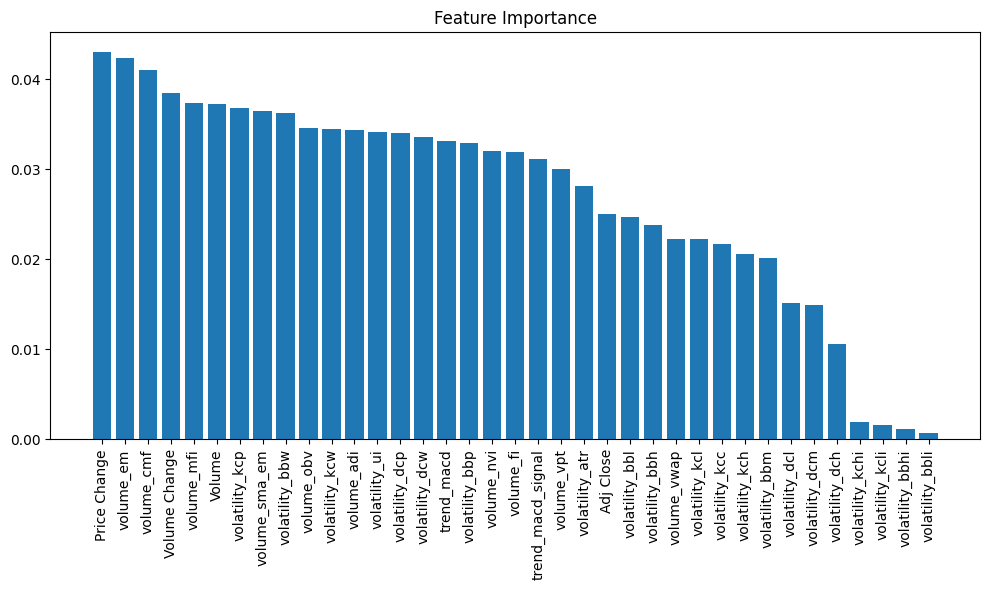

Top 37 features remaining
Score: 0.4730077120822622
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf', 'volume_fi', 'volume_em', 'volume_sma_em', 'volume_vpt', 'volume_vwap', 'volume_mfi', 'volume_nvi', 'volatility_bbm', 'volatility_bbh', 'volatility_bbl', 'volatility_bbw', 'volatility_bbp', 'volatility_bbhi', 'volatility_bbli', 'volatility_kcc', 'volatility_kch', 'volatility_kcl', 'volatility_kcw', 'volatility_kcp', 'volatility_kchi', 'volatility_kcli', 'volatility_dcl', 'volatility_dch', 'volatility_dcm', 'volatility_dcw', 'volatility_dcp', 'volatility_atr', 'volatility_ui', 'trend_macd', 'trend_macd_signal']
importances: [0.02507795 0.03720276 0.04304626 0.0384843  0.03430027 0.03454059
 0.04097049 0.03187004 0.04238906 0.03650813 0.03006779 0.02227912
 0.0373552  0.03196782 0.02018938 0.02379184 0.0246602  0.03619265
 0.03295355 0.00114183 0.00068228 0.02167028 0.02063935 0.0222733
 0.0344203  0.03678725 0.0019508  0.0016498

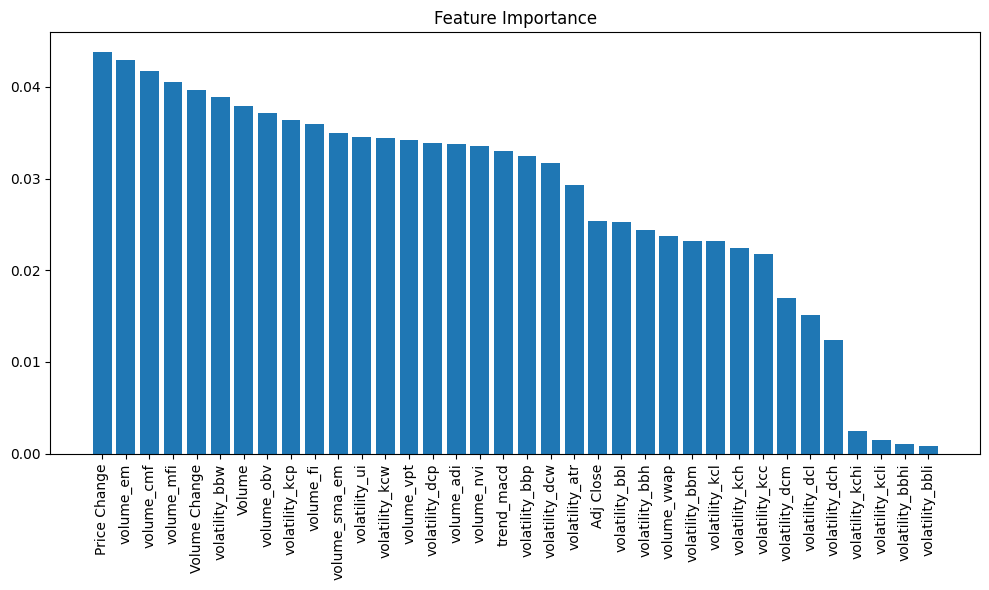

Top 36 features remaining
Score: 0.4730077120822622
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf', 'volume_fi', 'volume_em', 'volume_sma_em', 'volume_vpt', 'volume_vwap', 'volume_mfi', 'volume_nvi', 'volatility_bbm', 'volatility_bbh', 'volatility_bbl', 'volatility_bbw', 'volatility_bbp', 'volatility_bbhi', 'volatility_bbli', 'volatility_kcc', 'volatility_kch', 'volatility_kcl', 'volatility_kcw', 'volatility_kcp', 'volatility_kchi', 'volatility_kcli', 'volatility_dcl', 'volatility_dch', 'volatility_dcm', 'volatility_dcw', 'volatility_dcp', 'volatility_atr', 'volatility_ui', 'trend_macd']
importances: [0.02536402 0.03795164 0.04375106 0.03965227 0.03378141 0.03711769
 0.04171012 0.03592169 0.04295325 0.03494737 0.03415032 0.0237146
 0.04048887 0.03349964 0.02323311 0.02440633 0.02527897 0.03889947
 0.03242174 0.00103439 0.00086709 0.02178574 0.02239038 0.02320454
 0.03439581 0.03634223 0.00242558 0.00144097 0.01515181 0.012431

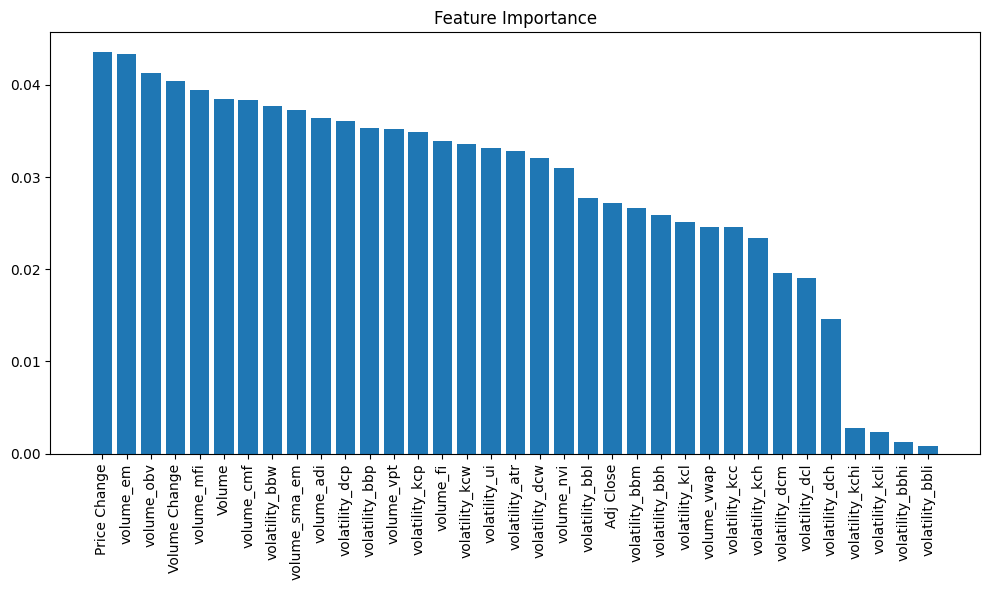

Top 35 features remaining
Score: 0.46272493573264784
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf', 'volume_fi', 'volume_em', 'volume_sma_em', 'volume_vpt', 'volume_vwap', 'volume_mfi', 'volume_nvi', 'volatility_bbm', 'volatility_bbh', 'volatility_bbl', 'volatility_bbw', 'volatility_bbp', 'volatility_bbhi', 'volatility_bbli', 'volatility_kcc', 'volatility_kch', 'volatility_kcl', 'volatility_kcw', 'volatility_kcp', 'volatility_kchi', 'volatility_kcli', 'volatility_dcl', 'volatility_dch', 'volatility_dcm', 'volatility_dcw', 'volatility_dcp', 'volatility_atr', 'volatility_ui']
importances: [0.0271639  0.03849366 0.04353486 0.04040825 0.03638406 0.04126025
 0.03841134 0.03387162 0.04340531 0.03730491 0.0352663  0.02455044
 0.03947167 0.03097363 0.02660715 0.0259224  0.02776673 0.03770768
 0.03536677 0.00126848 0.00085596 0.02454155 0.02343491 0.02509374
 0.03364999 0.03485114 0.00274265 0.00229938 0.01908742 0.01458698
 0.019613

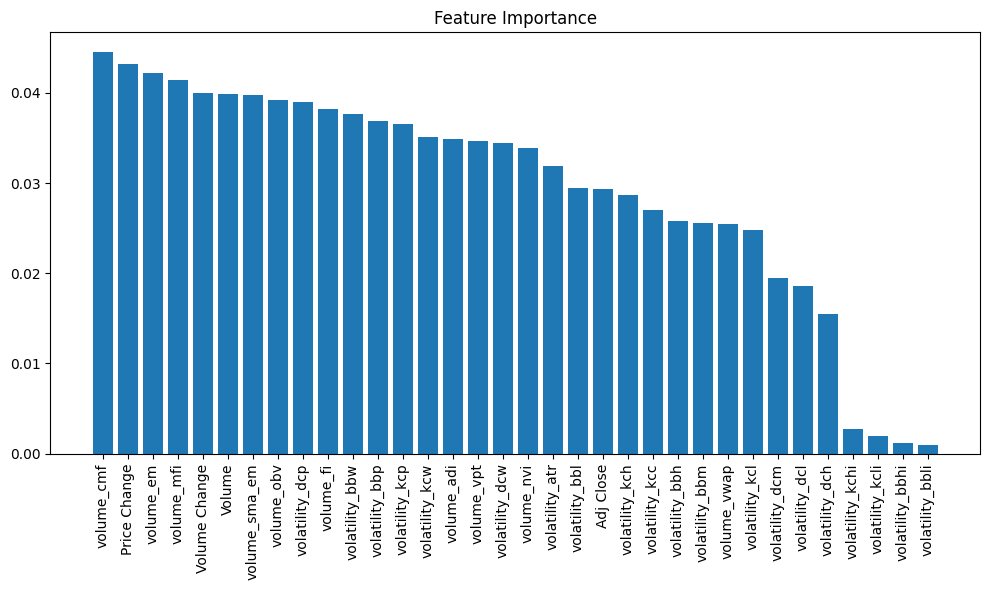

Top 34 features remaining
Score: 0.48586118251928023
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf', 'volume_fi', 'volume_em', 'volume_sma_em', 'volume_vpt', 'volume_vwap', 'volume_mfi', 'volume_nvi', 'volatility_bbm', 'volatility_bbh', 'volatility_bbl', 'volatility_bbw', 'volatility_bbp', 'volatility_bbhi', 'volatility_bbli', 'volatility_kcc', 'volatility_kch', 'volatility_kcl', 'volatility_kcw', 'volatility_kcp', 'volatility_kchi', 'volatility_kcli', 'volatility_dcl', 'volatility_dch', 'volatility_dcm', 'volatility_dcw', 'volatility_dcp', 'volatility_atr']
importances: [0.02939289 0.03991941 0.04322093 0.04001566 0.03489743 0.03920246
 0.04449747 0.03824886 0.04218709 0.03979712 0.03462762 0.02543714
 0.04146305 0.03394022 0.0256187  0.02579522 0.02940737 0.03765736
 0.0368433  0.00120636 0.0009724  0.02703497 0.02865545 0.02477905
 0.03508131 0.03651659 0.00276687 0.00198173 0.0186213  0.01551888
 0.01944176 0.03441884 0.0

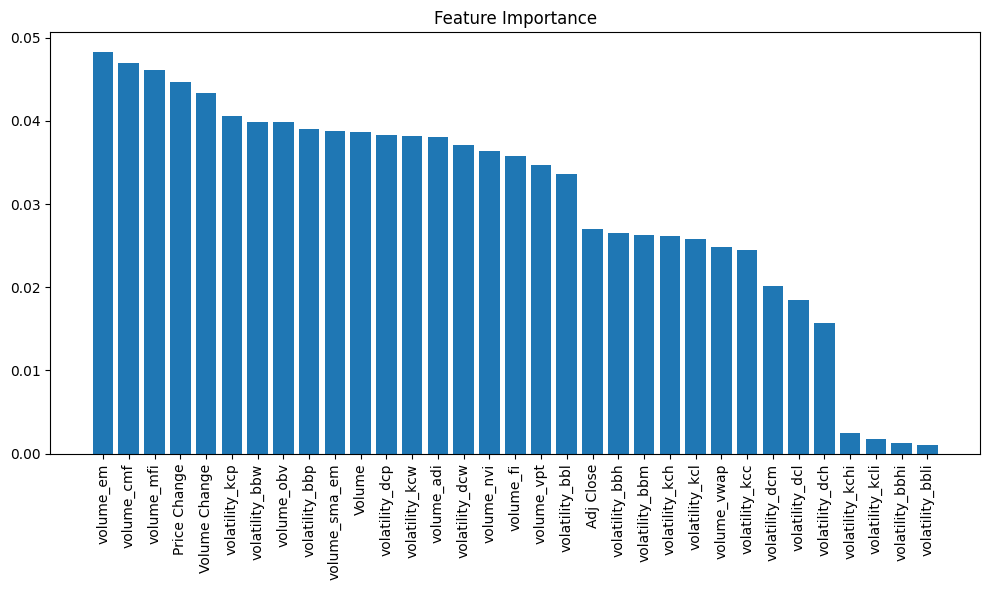

Top 33 features remaining
Score: 0.4730077120822622
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf', 'volume_fi', 'volume_em', 'volume_sma_em', 'volume_vpt', 'volume_vwap', 'volume_mfi', 'volume_nvi', 'volatility_bbm', 'volatility_bbh', 'volatility_bbl', 'volatility_bbw', 'volatility_bbp', 'volatility_bbhi', 'volatility_bbli', 'volatility_kcc', 'volatility_kch', 'volatility_kcl', 'volatility_kcw', 'volatility_kcp', 'volatility_kchi', 'volatility_kcli', 'volatility_dcl', 'volatility_dch', 'volatility_dcm', 'volatility_dcw', 'volatility_dcp']
importances: [0.02702371 0.03864957 0.0446183  0.043356   0.03802885 0.03986192
 0.04700966 0.03581487 0.04823363 0.03875394 0.03474485 0.02482126
 0.04612448 0.03634186 0.02627281 0.02651268 0.03355993 0.03987664
 0.03897811 0.00132293 0.0010067  0.02448336 0.02610667 0.02583318
 0.03816777 0.0406479  0.00244344 0.00171686 0.01848933 0.01573683
 0.02010492 0.03705681 0.03830022]
features: 

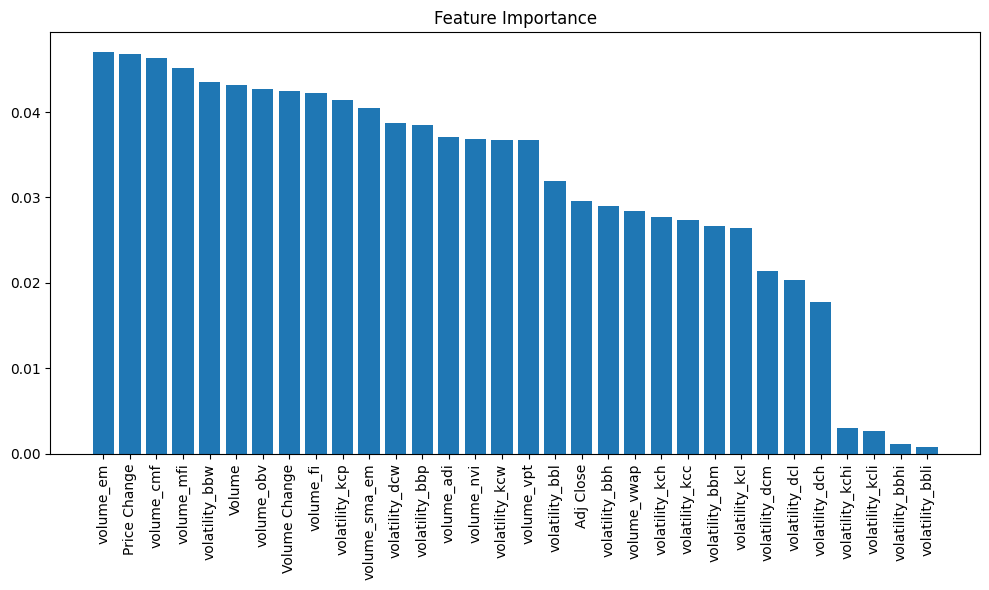

Top 32 features remaining
Score: 0.480719794344473
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf', 'volume_fi', 'volume_em', 'volume_sma_em', 'volume_vpt', 'volume_vwap', 'volume_mfi', 'volume_nvi', 'volatility_bbm', 'volatility_bbh', 'volatility_bbl', 'volatility_bbw', 'volatility_bbp', 'volatility_bbhi', 'volatility_bbli', 'volatility_kcc', 'volatility_kch', 'volatility_kcl', 'volatility_kcw', 'volatility_kcp', 'volatility_kchi', 'volatility_kcli', 'volatility_dcl', 'volatility_dch', 'volatility_dcm', 'volatility_dcw']
importances: [0.0296268  0.04314385 0.04685479 0.04241656 0.03710055 0.04265734
 0.04634657 0.04226467 0.04699073 0.04045304 0.03672021 0.02838979
 0.04521293 0.03688912 0.02666799 0.02896967 0.03195097 0.04348148
 0.0384879  0.00113916 0.00072286 0.02740791 0.02770514 0.02640877
 0.03675385 0.04138036 0.00299777 0.00261388 0.02032102 0.01776982
 0.02142162 0.03873288]
features: ['Adj Close', 'Volume', 'Price

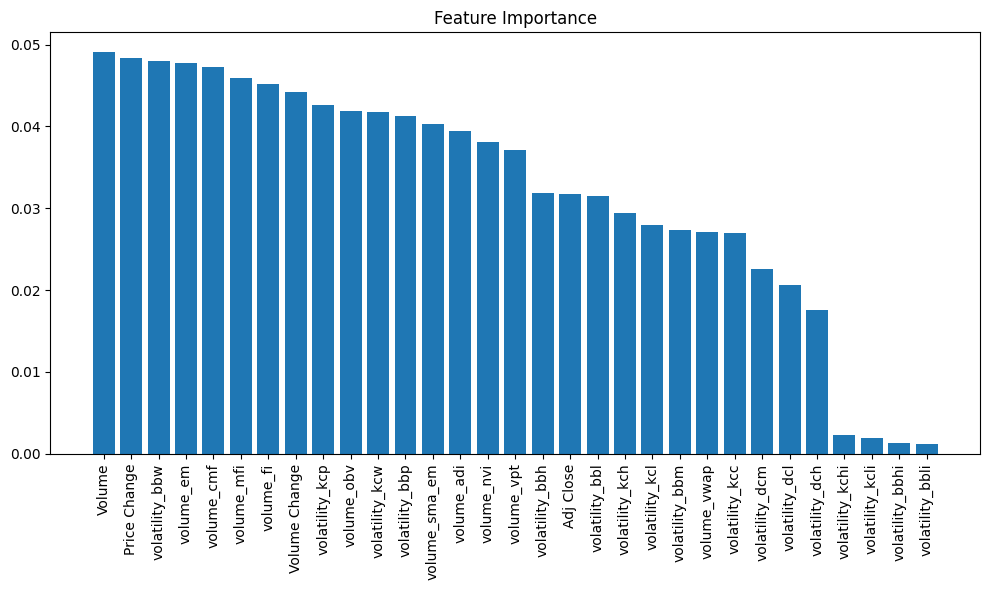

Top 31 features remaining
Score: 0.4832904884318766
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf', 'volume_fi', 'volume_em', 'volume_sma_em', 'volume_vpt', 'volume_vwap', 'volume_mfi', 'volume_nvi', 'volatility_bbm', 'volatility_bbh', 'volatility_bbl', 'volatility_bbw', 'volatility_bbp', 'volatility_bbhi', 'volatility_bbli', 'volatility_kcc', 'volatility_kch', 'volatility_kcl', 'volatility_kcw', 'volatility_kcp', 'volatility_kchi', 'volatility_kcli', 'volatility_dcl', 'volatility_dch', 'volatility_dcm']
importances: [0.03177417 0.04905775 0.04841519 0.04426246 0.03950495 0.04190979
 0.04729316 0.0452201  0.04777149 0.04024293 0.03716301 0.02716025
 0.04596061 0.03813873 0.02735808 0.0318843  0.03147284 0.04796065
 0.04132888 0.00133038 0.00114642 0.02694937 0.02937115 0.0280059
 0.04174439 0.04261373 0.00222906 0.00188835 0.02064382 0.01758563
 0.02261248]
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'v

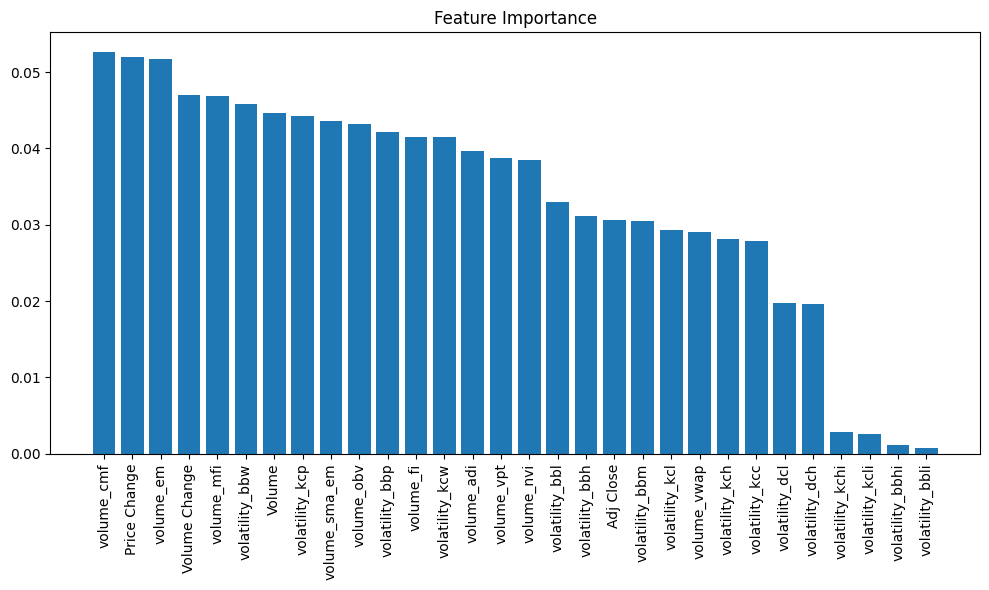

Top 30 features remaining
Score: 0.4730077120822622
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf', 'volume_fi', 'volume_em', 'volume_sma_em', 'volume_vpt', 'volume_vwap', 'volume_mfi', 'volume_nvi', 'volatility_bbm', 'volatility_bbh', 'volatility_bbl', 'volatility_bbw', 'volatility_bbp', 'volatility_bbhi', 'volatility_bbli', 'volatility_kcc', 'volatility_kch', 'volatility_kcl', 'volatility_kcw', 'volatility_kcp', 'volatility_kchi', 'volatility_kcli', 'volatility_dcl', 'volatility_dch']
importances: [0.03067871 0.04461055 0.05197381 0.04701036 0.03964274 0.04315711
 0.05258594 0.04154814 0.05167531 0.04364876 0.03869432 0.02904078
 0.04683761 0.03851098 0.03051873 0.03108333 0.03301471 0.04583535
 0.04218407 0.00114093 0.00074447 0.02787592 0.0281559  0.02927863
 0.04153173 0.04424026 0.00277692 0.00257399 0.01976347 0.01966647]
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'vo

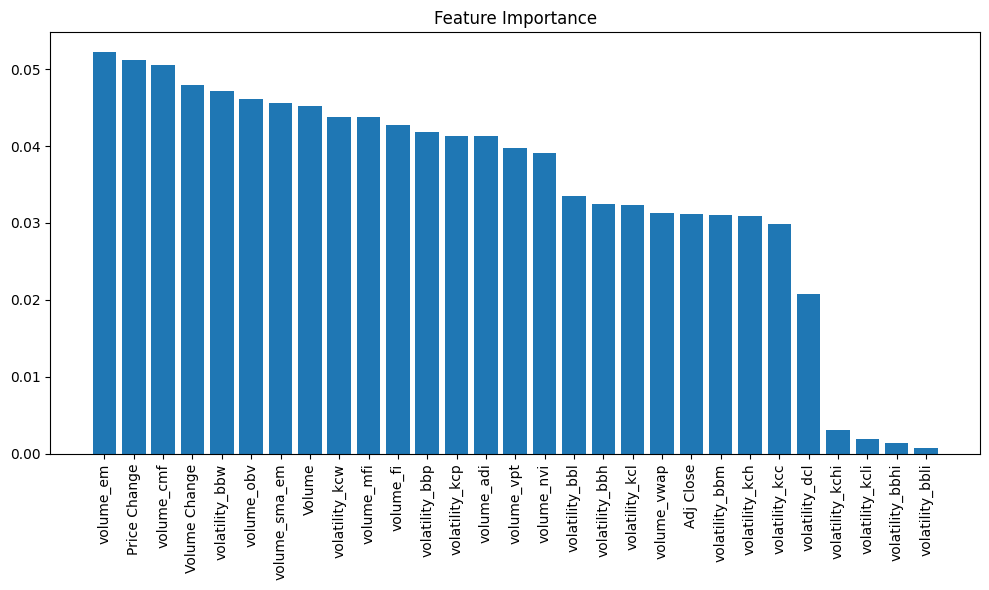

Top 29 features remaining
Score: 0.4652956298200514
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf', 'volume_fi', 'volume_em', 'volume_sma_em', 'volume_vpt', 'volume_vwap', 'volume_mfi', 'volume_nvi', 'volatility_bbm', 'volatility_bbh', 'volatility_bbl', 'volatility_bbw', 'volatility_bbp', 'volatility_bbhi', 'volatility_bbli', 'volatility_kcc', 'volatility_kch', 'volatility_kcl', 'volatility_kcw', 'volatility_kcp', 'volatility_kchi', 'volatility_kcli', 'volatility_dcl']
importances: [0.03112094 0.04517977 0.0511382  0.04798977 0.04125589 0.04611228
 0.05048779 0.04276604 0.05218505 0.04556256 0.03972515 0.03130367
 0.04377761 0.03914534 0.03102578 0.03241881 0.03346285 0.0471995
 0.04184759 0.00141844 0.00068686 0.0298916  0.03095673 0.0323787
 0.04384609 0.04133205 0.00306577 0.00196527 0.0207539 ]
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf', 'volume_fi', 'volume

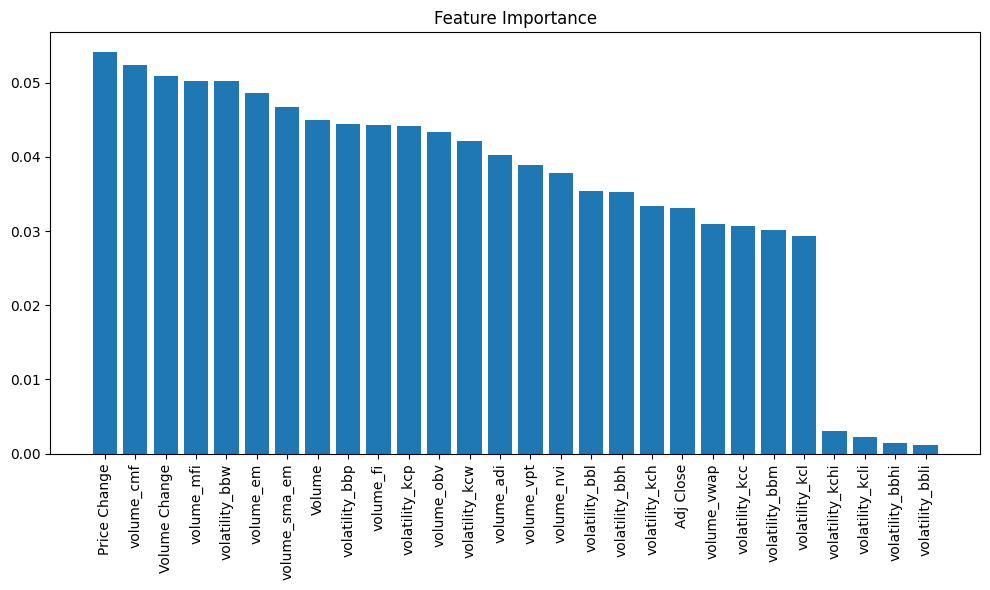

Top 28 features remaining
Score: 0.4601542416452442
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf', 'volume_fi', 'volume_em', 'volume_sma_em', 'volume_vpt', 'volume_vwap', 'volume_mfi', 'volume_nvi', 'volatility_bbm', 'volatility_bbh', 'volatility_bbl', 'volatility_bbw', 'volatility_bbp', 'volatility_bbhi', 'volatility_bbli', 'volatility_kcc', 'volatility_kch', 'volatility_kcl', 'volatility_kcw', 'volatility_kcp', 'volatility_kchi', 'volatility_kcli']
importances: [0.03315766 0.04491324 0.05409319 0.05097333 0.04026793 0.04338792
 0.05242158 0.04436852 0.04862067 0.04674548 0.03890522 0.03096026
 0.05026408 0.03785839 0.03017055 0.03523652 0.03546311 0.05024216
 0.04446778 0.00140496 0.00112103 0.03075427 0.03332679 0.02928558
 0.04221398 0.04416087 0.00303239 0.00218252]
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf', 'volume_fi', 'volume_em', 'volume_sma_em', 'vol

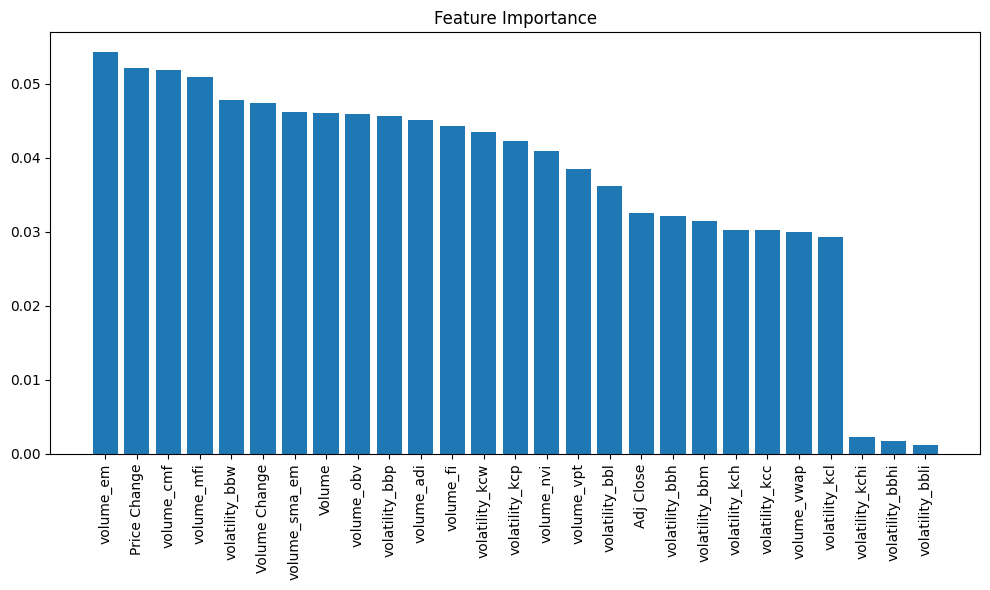

Top 27 features remaining
Score: 0.4730077120822622
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf', 'volume_fi', 'volume_em', 'volume_sma_em', 'volume_vpt', 'volume_vwap', 'volume_mfi', 'volume_nvi', 'volatility_bbm', 'volatility_bbh', 'volatility_bbl', 'volatility_bbw', 'volatility_bbp', 'volatility_bbhi', 'volatility_bbli', 'volatility_kcc', 'volatility_kch', 'volatility_kcl', 'volatility_kcw', 'volatility_kcp', 'volatility_kchi']
importances: [0.03252098 0.0460828  0.05216422 0.04739068 0.04513753 0.04587579
 0.05190502 0.04427859 0.05424837 0.04618949 0.03853224 0.02994368
 0.05094311 0.0409064  0.03144744 0.03207367 0.03624501 0.04779626
 0.04565398 0.00176424 0.00114546 0.03017337 0.03025063 0.02922419
 0.04354329 0.04228849 0.00227508]
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf', 'volume_fi', 'volume_em', 'volume_sma_em', 'volume_vpt', 'volume_vwap', 'volu

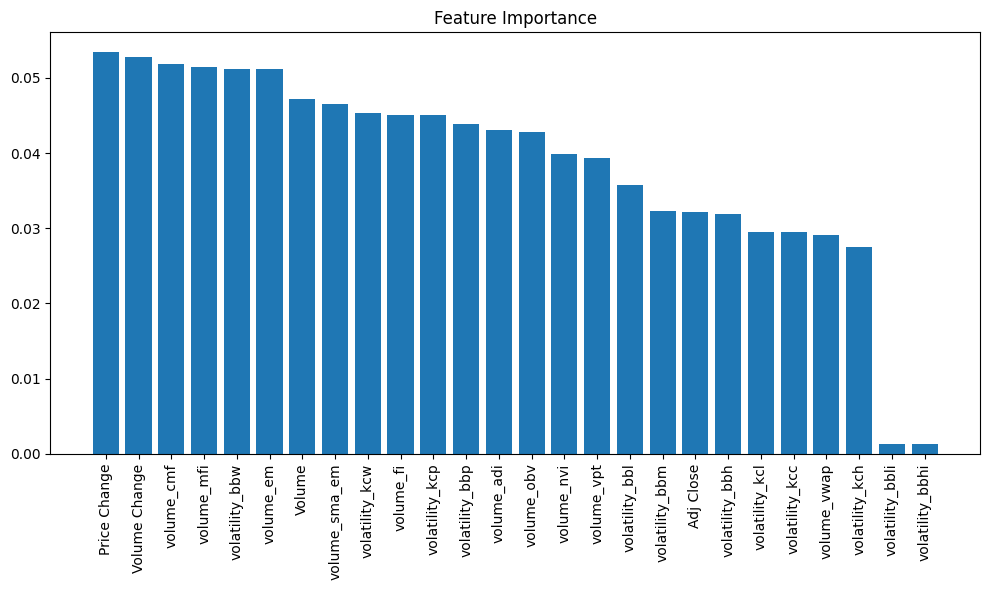

Top 26 features remaining
Score: 0.46786632390745503
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf', 'volume_fi', 'volume_em', 'volume_sma_em', 'volume_vpt', 'volume_vwap', 'volume_mfi', 'volume_nvi', 'volatility_bbm', 'volatility_bbh', 'volatility_bbl', 'volatility_bbw', 'volatility_bbp', 'volatility_bbhi', 'volatility_bbli', 'volatility_kcc', 'volatility_kch', 'volatility_kcl', 'volatility_kcw', 'volatility_kcp']
importances: [0.03216642 0.04719404 0.05339245 0.05276424 0.04311524 0.04279853
 0.05179471 0.04511295 0.05114509 0.04646355 0.03932465 0.0291313
 0.05149303 0.03987403 0.0322759  0.03188403 0.03576482 0.05115964
 0.04379989 0.00121856 0.00130849 0.0294367  0.02753527 0.02953857
 0.04529048 0.0450174 ]
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf', 'volume_fi', 'volume_em', 'volume_sma_em', 'volume_vpt', 'volume_vwap', 'volume_mfi', 'volume_nvi', 'volati

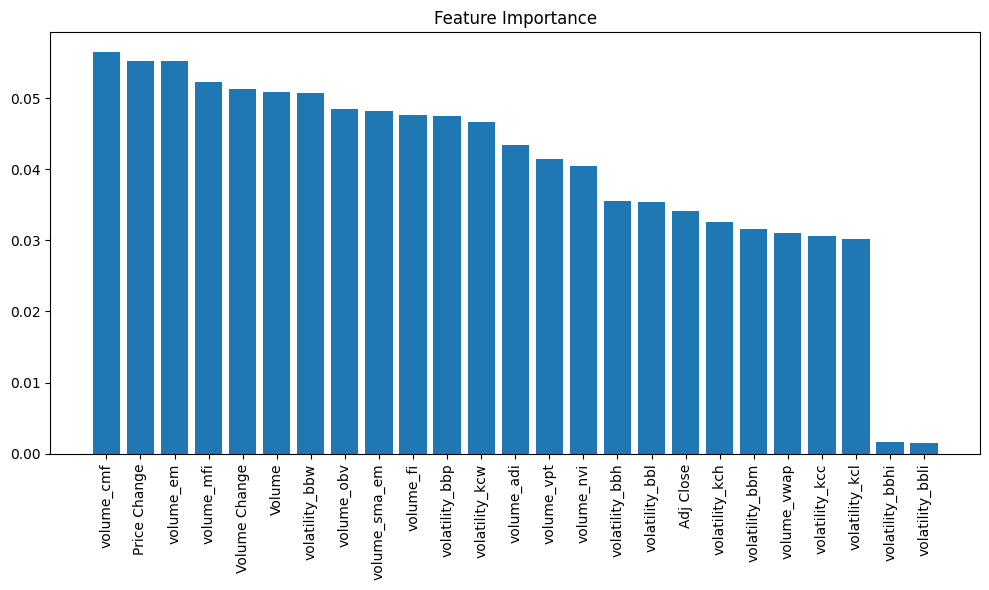

Top 25 features remaining
Score: 0.4910025706940874
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf', 'volume_fi', 'volume_em', 'volume_sma_em', 'volume_vpt', 'volume_vwap', 'volume_mfi', 'volume_nvi', 'volatility_bbm', 'volatility_bbh', 'volatility_bbl', 'volatility_bbw', 'volatility_bbp', 'volatility_bbhi', 'volatility_bbli', 'volatility_kcc', 'volatility_kch', 'volatility_kcl', 'volatility_kcw']
importances: [0.03414954 0.05085303 0.05525494 0.05123216 0.04333559 0.0485265
 0.05642871 0.04760358 0.05524281 0.04823147 0.04137039 0.03099053
 0.05221369 0.0404838  0.03154545 0.03551378 0.03544215 0.05069198
 0.04753036 0.00169652 0.00156819 0.03065753 0.03262565 0.03015563
 0.04665602]
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf', 'volume_fi', 'volume_em', 'volume_sma_em', 'volume_vpt', 'volume_vwap', 'volume_mfi', 'volume_nvi', 'volatility_bbm', 'volatility_bbh', '

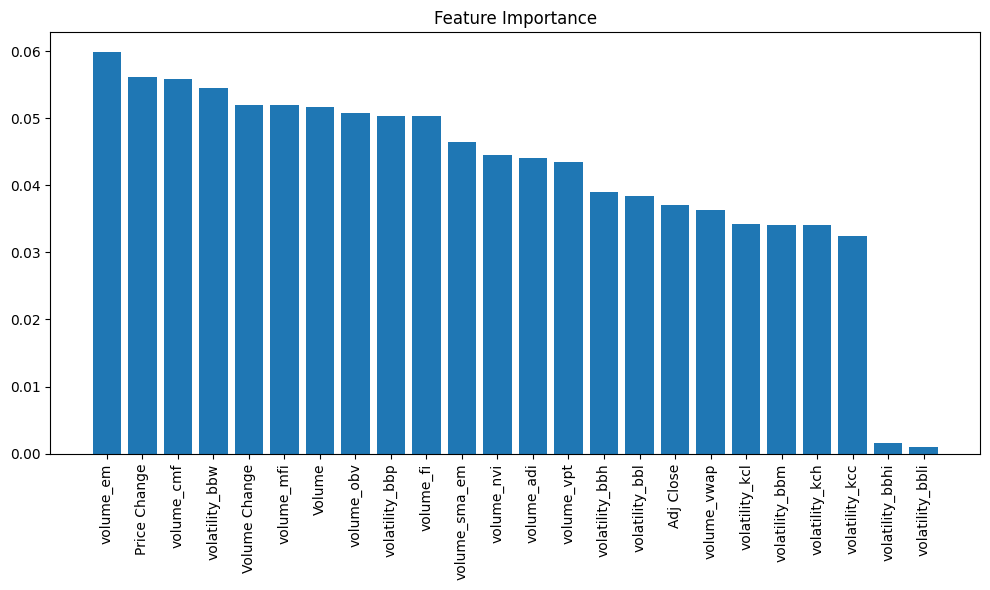

Top 24 features remaining
Score: 0.480719794344473
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf', 'volume_fi', 'volume_em', 'volume_sma_em', 'volume_vpt', 'volume_vwap', 'volume_mfi', 'volume_nvi', 'volatility_bbm', 'volatility_bbh', 'volatility_bbl', 'volatility_bbw', 'volatility_bbp', 'volatility_bbhi', 'volatility_bbli', 'volatility_kcc', 'volatility_kch', 'volatility_kcl']
importances: [0.03699287 0.05164188 0.05613551 0.05203472 0.04412231 0.05074291
 0.05584394 0.0503352  0.05979994 0.04647895 0.04347993 0.03624462
 0.0519351  0.04448315 0.03414977 0.03899573 0.03832956 0.0545626
 0.05036597 0.001611   0.00095995 0.0324697  0.03408886 0.03419585]
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf', 'volume_fi', 'volume_em', 'volume_sma_em', 'volume_vpt', 'volume_vwap', 'volume_mfi', 'volume_nvi', 'volatility_bbm', 'volatility_bbh', 'volatility_bbl', 'volatility_bb

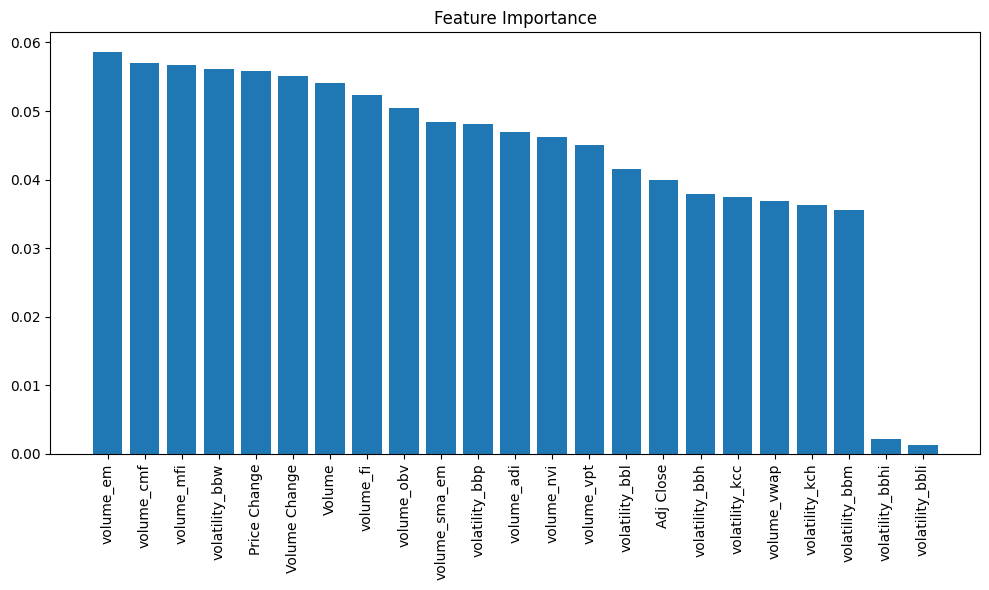

Top 23 features remaining
Score: 0.4910025706940874
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf', 'volume_fi', 'volume_em', 'volume_sma_em', 'volume_vpt', 'volume_vwap', 'volume_mfi', 'volume_nvi', 'volatility_bbm', 'volatility_bbh', 'volatility_bbl', 'volatility_bbw', 'volatility_bbp', 'volatility_bbhi', 'volatility_bbli', 'volatility_kcc', 'volatility_kch']
importances: [0.0400025  0.05409163 0.05583197 0.05511361 0.04696828 0.05039668
 0.05706689 0.05234753 0.05855297 0.04842247 0.04503468 0.03688005
 0.05666013 0.04620558 0.03562028 0.037896   0.04159693 0.05613683
 0.0481069  0.00210327 0.00133336 0.03739134 0.03624012]
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf', 'volume_fi', 'volume_em', 'volume_sma_em', 'volume_vpt', 'volume_vwap', 'volume_mfi', 'volume_nvi', 'volatility_bbm', 'volatility_bbh', 'volatility_bbl', 'volatility_bbw', 'volatility_bbp', 'vola

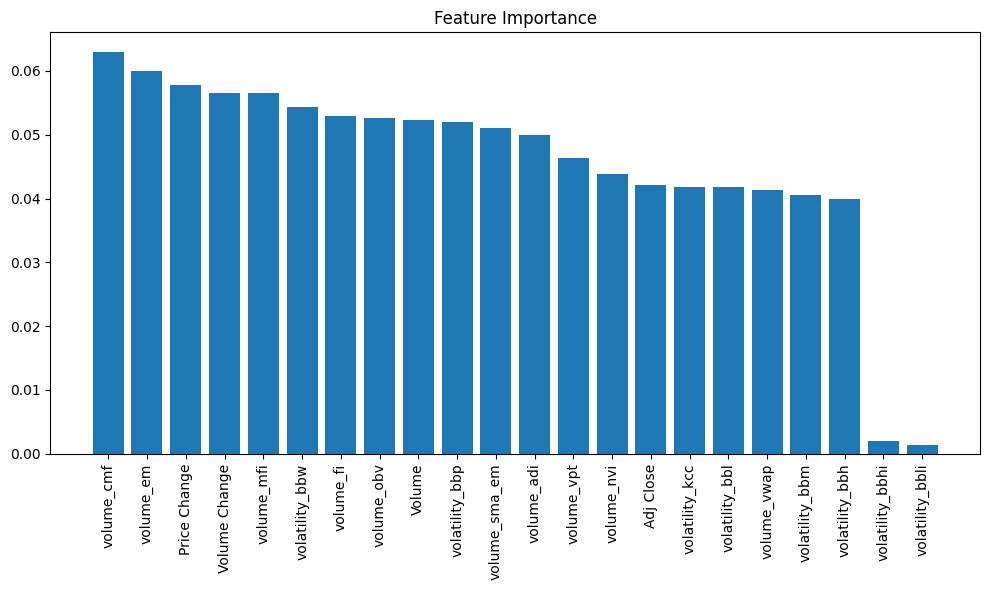

Top 22 features remaining
Score: 0.4755784061696658
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf', 'volume_fi', 'volume_em', 'volume_sma_em', 'volume_vpt', 'volume_vwap', 'volume_mfi', 'volume_nvi', 'volatility_bbm', 'volatility_bbh', 'volatility_bbl', 'volatility_bbw', 'volatility_bbp', 'volatility_bbhi', 'volatility_bbli', 'volatility_kcc']
importances: [0.04207469 0.05229603 0.05784292 0.05654529 0.0499685  0.0525809
 0.06290708 0.05295125 0.05996575 0.05099928 0.04629797 0.04131336
 0.05649345 0.04390909 0.04059666 0.03995707 0.04174572 0.05427287
 0.05206281 0.00196639 0.00142431 0.04182863]
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf', 'volume_fi', 'volume_em', 'volume_sma_em', 'volume_vpt', 'volume_vwap', 'volume_mfi', 'volume_nvi', 'volatility_bbm', 'volatility_bbh', 'volatility_bbl', 'volatility_bbw', 'volatility_bbp', 'volatility_bbhi', 'volatility_bbli

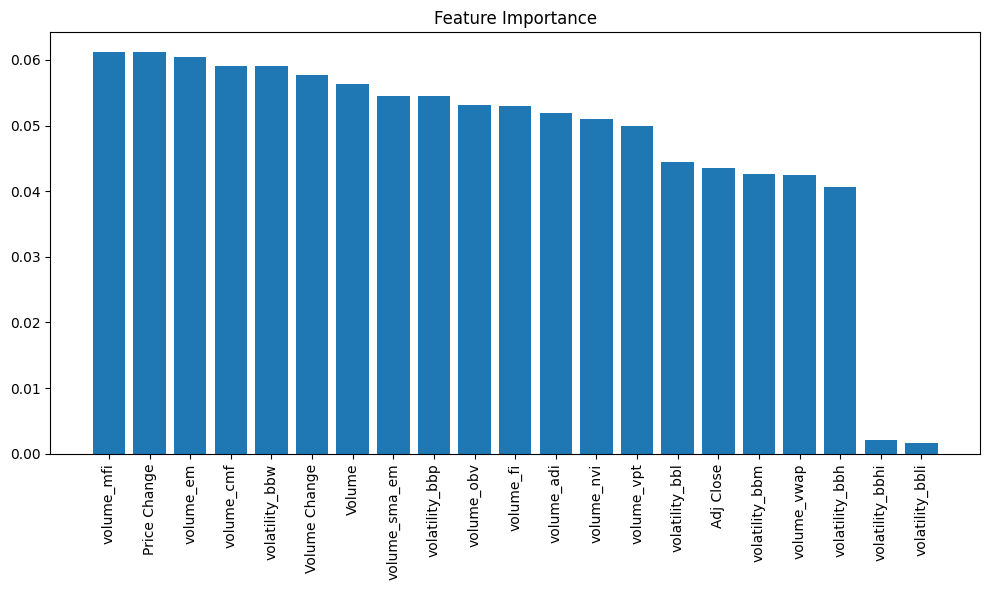

Top 21 features remaining
Score: 0.4884318766066838
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf', 'volume_fi', 'volume_em', 'volume_sma_em', 'volume_vpt', 'volume_vwap', 'volume_mfi', 'volume_nvi', 'volatility_bbm', 'volatility_bbh', 'volatility_bbl', 'volatility_bbw', 'volatility_bbp', 'volatility_bbhi', 'volatility_bbli']
importances: [0.04345678 0.0563882  0.06112914 0.05762042 0.05185505 0.05306881
 0.0590388  0.05293724 0.06041872 0.05455401 0.04988361 0.04250296
 0.06113931 0.05103373 0.04257998 0.04059995 0.04451398 0.05903119
 0.05454528 0.00204085 0.00166201]
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf', 'volume_fi', 'volume_em', 'volume_sma_em', 'volume_vpt', 'volume_vwap', 'volume_mfi', 'volume_nvi', 'volatility_bbm', 'volatility_bbh', 'volatility_bbl', 'volatility_bbw', 'volatility_bbp', 'volatility_bbhi']


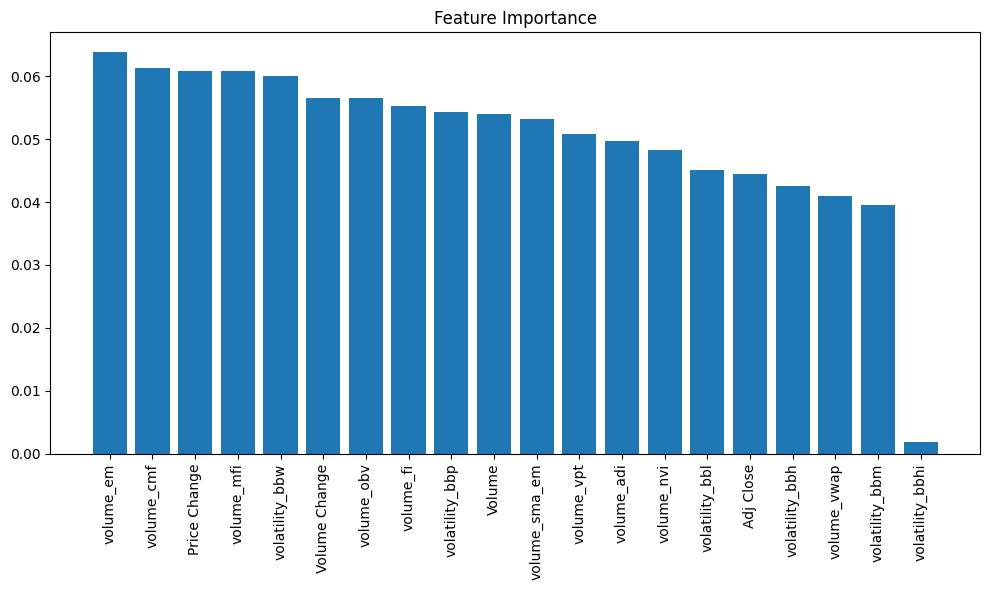

Top 20 features remaining
Score: 0.4781491002570694
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf', 'volume_fi', 'volume_em', 'volume_sma_em', 'volume_vpt', 'volume_vwap', 'volume_mfi', 'volume_nvi', 'volatility_bbm', 'volatility_bbh', 'volatility_bbl', 'volatility_bbw', 'volatility_bbp', 'volatility_bbhi']
importances: [0.04441907 0.05395466 0.06083056 0.05658203 0.04971043 0.05653378
 0.0613644  0.05525716 0.06380381 0.05316949 0.05077676 0.04103444
 0.0607853  0.04824346 0.03956494 0.04262892 0.04506758 0.06012801
 0.05425952 0.00188568]
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf', 'volume_fi', 'volume_em', 'volume_sma_em', 'volume_vpt', 'volume_vwap', 'volume_mfi', 'volume_nvi', 'volatility_bbm', 'volatility_bbh', 'volatility_bbl', 'volatility_bbw', 'volatility_bbp']


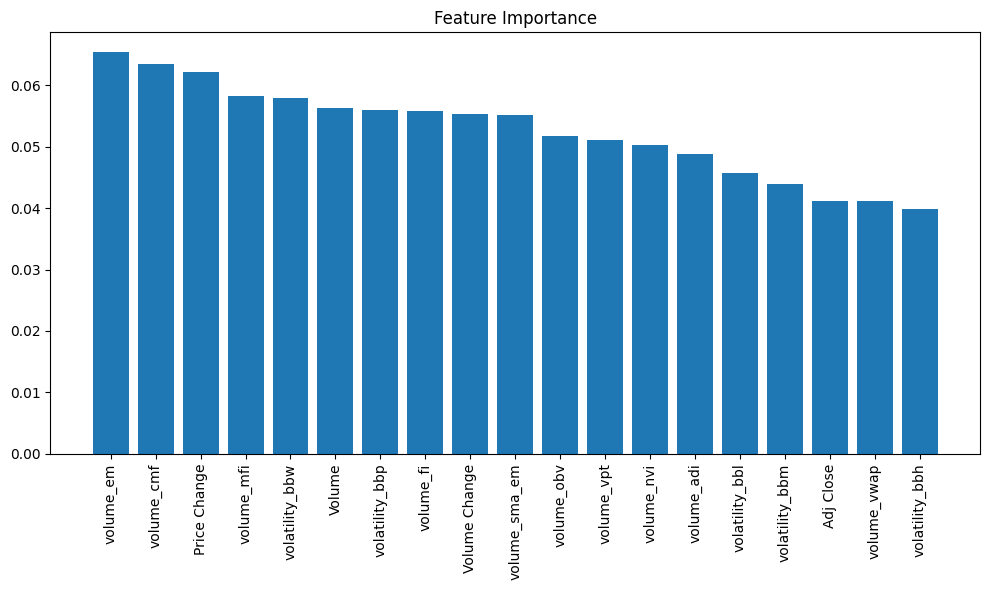

Top 19 features remaining
Score: 0.46786632390745503
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf', 'volume_fi', 'volume_em', 'volume_sma_em', 'volume_vpt', 'volume_vwap', 'volume_mfi', 'volume_nvi', 'volatility_bbm', 'volatility_bbh', 'volatility_bbl', 'volatility_bbw', 'volatility_bbp']
importances: [0.04118046 0.05633267 0.06216125 0.05533229 0.0488472  0.05178001
 0.06349411 0.05581121 0.06539183 0.05521421 0.05114148 0.04112395
 0.05834853 0.05034486 0.04396565 0.03984109 0.04571481 0.05793087
 0.05604351]
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf', 'volume_fi', 'volume_em', 'volume_sma_em', 'volume_vpt', 'volume_vwap', 'volume_mfi', 'volume_nvi', 'volatility_bbm', 'volatility_bbh', 'volatility_bbl', 'volatility_bbw']


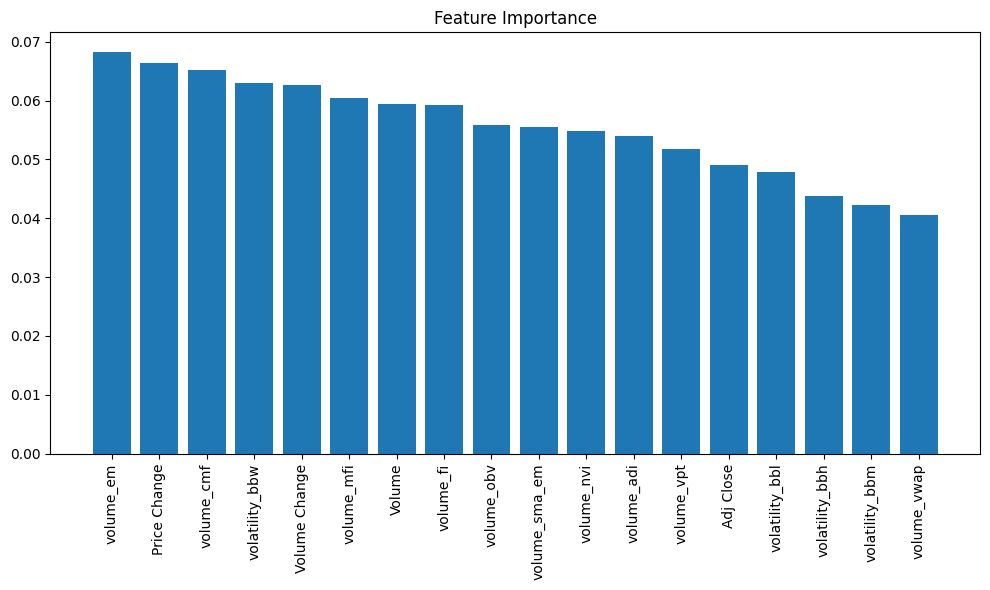

Top 18 features remaining
Score: 0.4781491002570694
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf', 'volume_fi', 'volume_em', 'volume_sma_em', 'volume_vpt', 'volume_vwap', 'volume_mfi', 'volume_nvi', 'volatility_bbm', 'volatility_bbh', 'volatility_bbl', 'volatility_bbw']
importances: [0.04903365 0.05944381 0.06640157 0.06259501 0.05395501 0.0559268
 0.06526367 0.05920962 0.06818202 0.05554634 0.0518052  0.04047276
 0.06043406 0.05487636 0.04231683 0.04377143 0.04779642 0.06296943]
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf', 'volume_fi', 'volume_em', 'volume_sma_em', 'volume_vpt', 'volume_vwap', 'volume_mfi', 'volume_nvi', 'volatility_bbm', 'volatility_bbh', 'volatility_bbl']


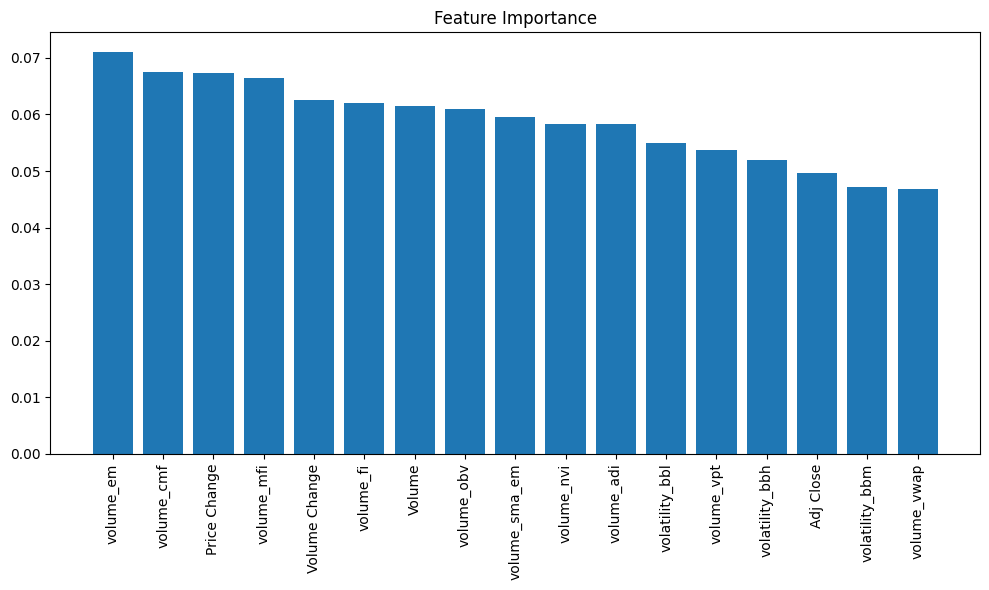

Top 17 features remaining
Score: 0.480719794344473
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf', 'volume_fi', 'volume_em', 'volume_sma_em', 'volume_vpt', 'volume_vwap', 'volume_mfi', 'volume_nvi', 'volatility_bbm', 'volatility_bbh', 'volatility_bbl']
importances: [0.0496017  0.06156535 0.06727423 0.06258536 0.05839683 0.06103153
 0.06744223 0.06194795 0.07098506 0.05958482 0.05380406 0.04681391
 0.06651854 0.05840033 0.04713084 0.0518733  0.05504396]
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf', 'volume_fi', 'volume_em', 'volume_sma_em', 'volume_vpt', 'volume_vwap', 'volume_mfi', 'volume_nvi', 'volatility_bbm', 'volatility_bbh']


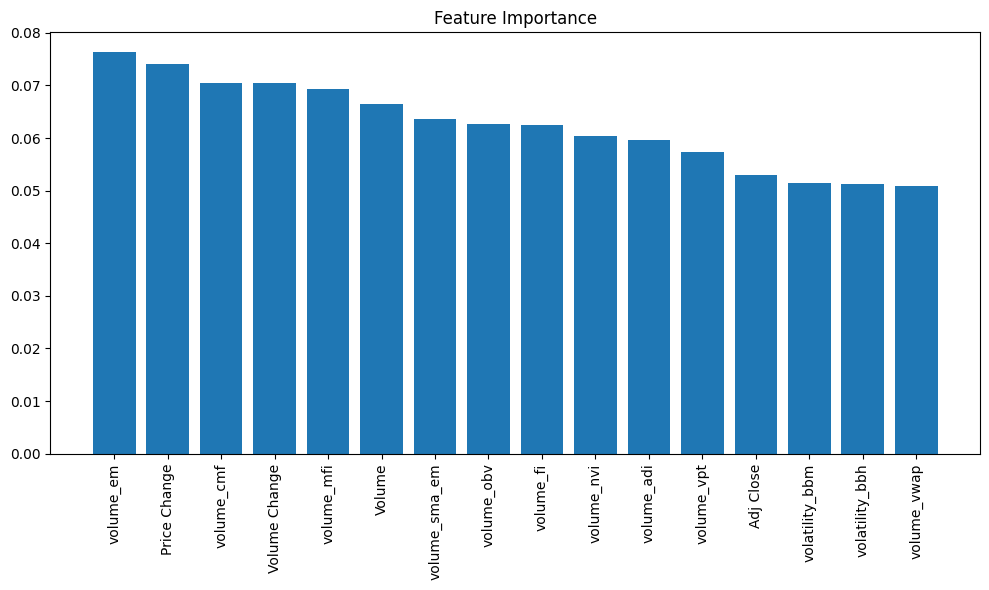

Top 16 features remaining
Score: 0.4704370179948586
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf', 'volume_fi', 'volume_em', 'volume_sma_em', 'volume_vpt', 'volume_vwap', 'volume_mfi', 'volume_nvi', 'volatility_bbm', 'volatility_bbh']
importances: [0.05294338 0.06654554 0.07399818 0.07049863 0.05960462 0.06258772
 0.07055808 0.06255897 0.07629024 0.06364487 0.05733637 0.05088092
 0.06940243 0.06041689 0.05149269 0.05124047]
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf', 'volume_fi', 'volume_em', 'volume_sma_em', 'volume_vpt', 'volume_vwap', 'volume_mfi', 'volume_nvi', 'volatility_bbm']


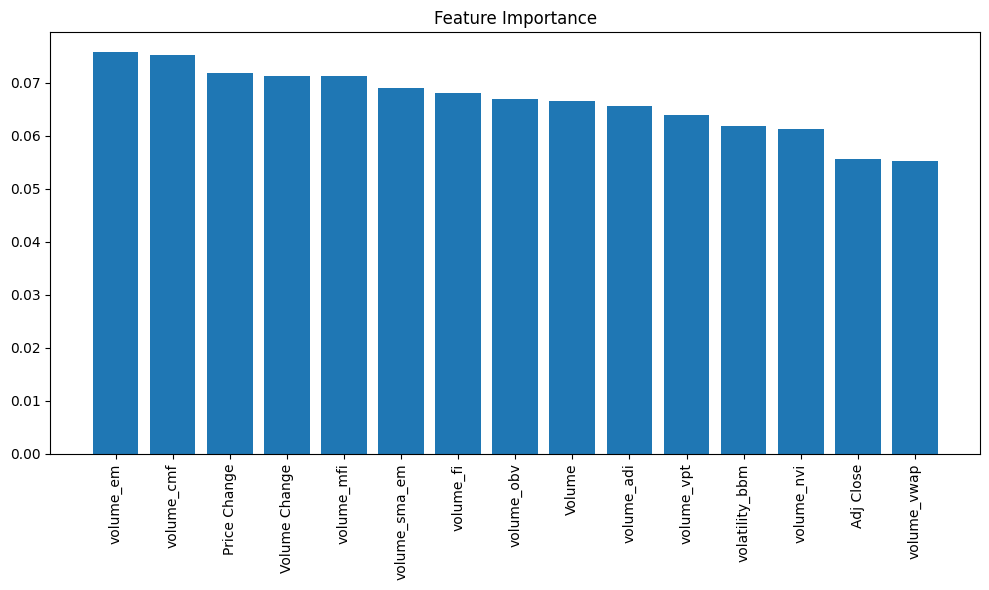

Top 15 features remaining
Score: 0.4652956298200514
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf', 'volume_fi', 'volume_em', 'volume_sma_em', 'volume_vpt', 'volume_vwap', 'volume_mfi', 'volume_nvi', 'volatility_bbm']
importances: [0.05567152 0.06653602 0.07188704 0.0713859  0.06564401 0.06706856
 0.07532122 0.06803968 0.07577842 0.06904122 0.06400261 0.05521456
 0.07129886 0.06123219 0.0618782 ]
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf', 'volume_fi', 'volume_em', 'volume_sma_em', 'volume_vpt', 'volume_vwap', 'volume_mfi', 'volume_nvi']


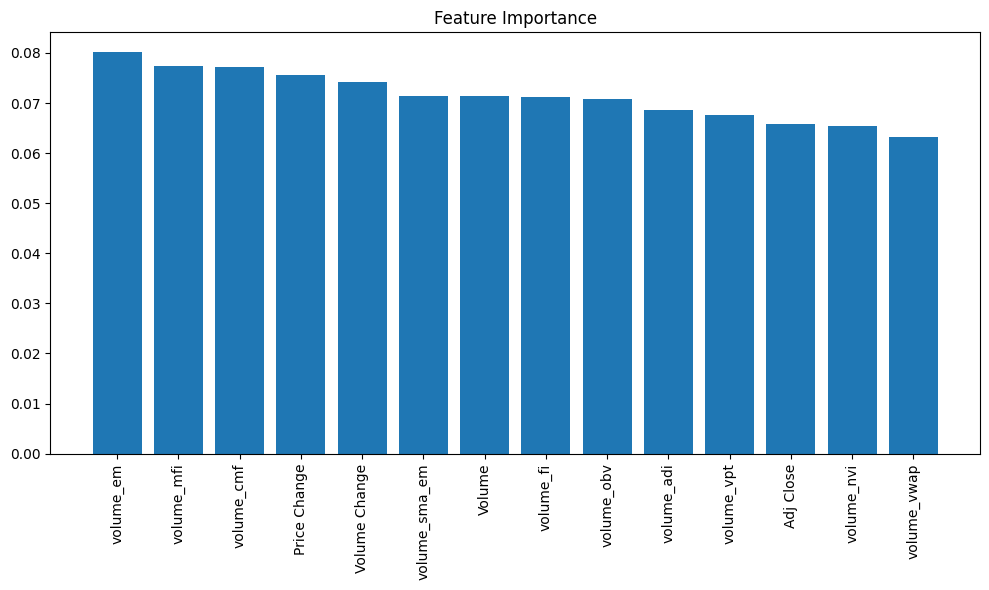

Top 14 features remaining
Score: 0.4730077120822622
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf', 'volume_fi', 'volume_em', 'volume_sma_em', 'volume_vpt', 'volume_vwap', 'volume_mfi', 'volume_nvi']
importances: [0.06584021 0.07131877 0.07552427 0.07411908 0.06852997 0.07086935
 0.07729063 0.07123365 0.08011637 0.0713366  0.06764313 0.06329295
 0.07743116 0.06545387]
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf', 'volume_fi', 'volume_em', 'volume_sma_em', 'volume_vpt', 'volume_vwap', 'volume_mfi']


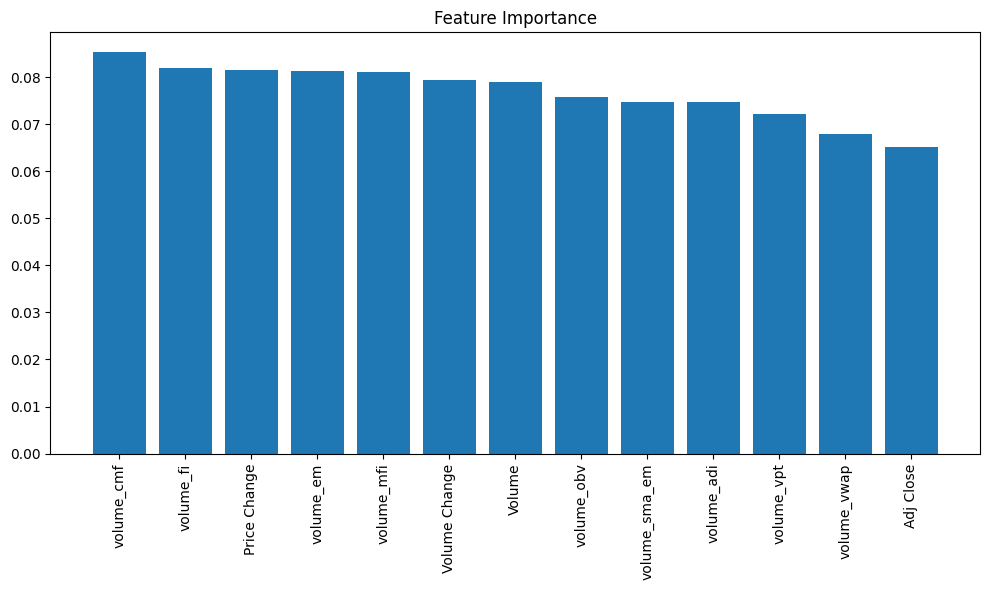

Top 13 features remaining
Score: 0.4832904884318766
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf', 'volume_fi', 'volume_em', 'volume_sma_em', 'volume_vpt', 'volume_vwap', 'volume_mfi']
importances: [0.06523145 0.07891385 0.08152366 0.07940937 0.07468754 0.07580859
 0.08523472 0.0818697  0.08123387 0.07479472 0.07223642 0.06799061
 0.08106551]
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf', 'volume_fi', 'volume_em', 'volume_sma_em', 'volume_vpt', 'volume_vwap']


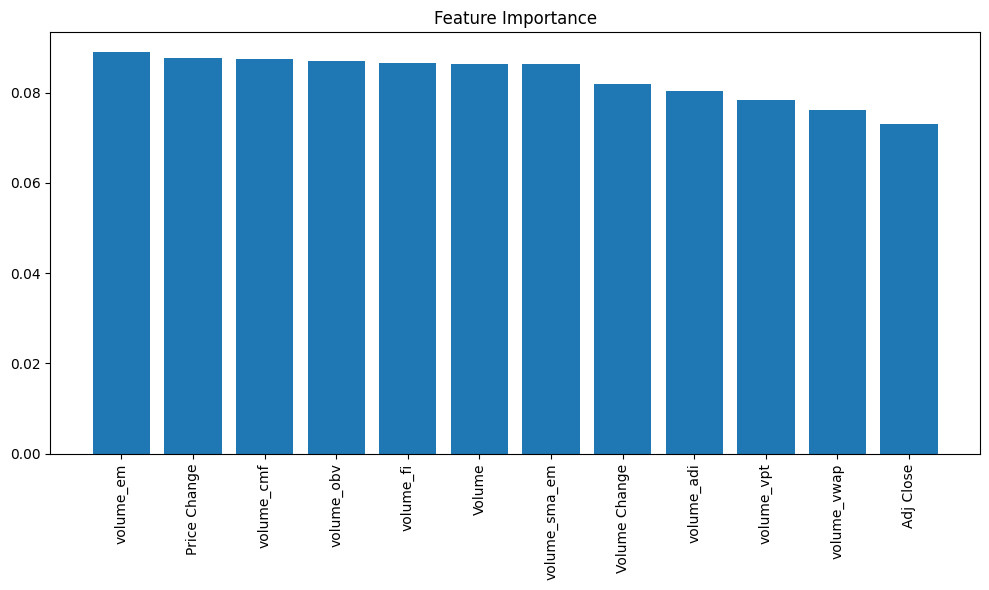

Top 12 features remaining
Score: 0.4961439588688946
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf', 'volume_fi', 'volume_em', 'volume_sma_em', 'volume_vpt', 'volume_vwap']
importances: [0.07312817 0.08631922 0.08762406 0.08197347 0.08038689 0.08690536
 0.0874661  0.08661625 0.08889216 0.08625937 0.07839618 0.07603276]
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf', 'volume_fi', 'volume_em', 'volume_sma_em', 'volume_vpt']


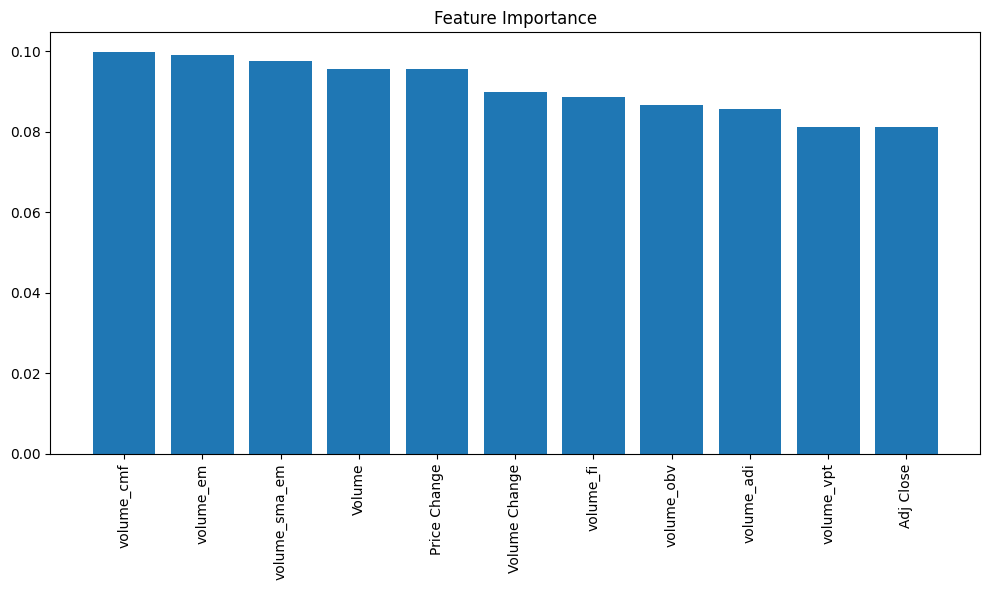

Top 11 features remaining
Score: 0.4884318766066838
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf', 'volume_fi', 'volume_em', 'volume_sma_em', 'volume_vpt']
importances: [0.08105208 0.09562477 0.09545603 0.08977936 0.08551028 0.08652767
 0.09966434 0.0886801  0.09890547 0.09764095 0.08115894]
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf', 'volume_fi', 'volume_em', 'volume_sma_em']


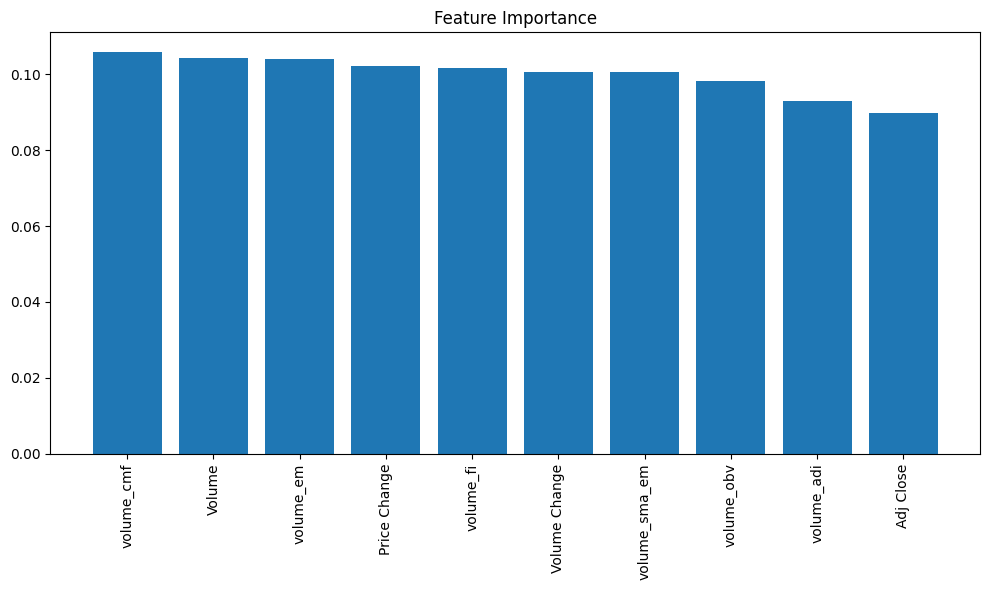

Top 10 features remaining
Score: 0.5038560411311054
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf', 'volume_fi', 'volume_em', 'volume_sma_em']
importances: [0.08970409 0.10419065 0.10213423 0.10061085 0.09304636 0.09833384
 0.10579228 0.10158145 0.10405184 0.1005544 ]
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf', 'volume_fi', 'volume_em']


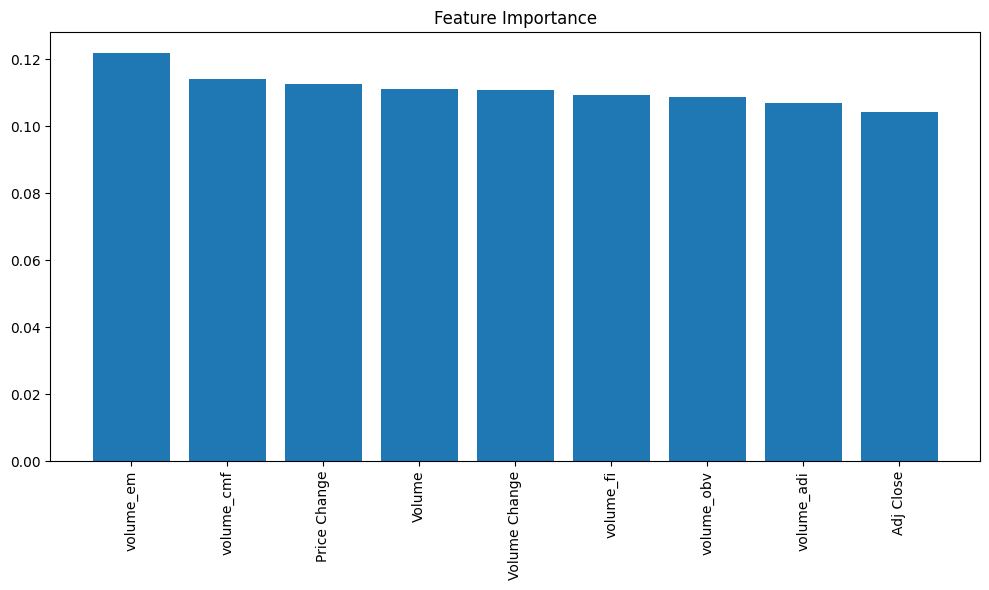

Top 9 features remaining
Score: 0.4961439588688946
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf', 'volume_fi', 'volume_em']
importances: [0.10433669 0.1111206  0.11265815 0.11081974 0.10681805 0.10878679
 0.11416343 0.10938337 0.12191317]
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf', 'volume_fi']


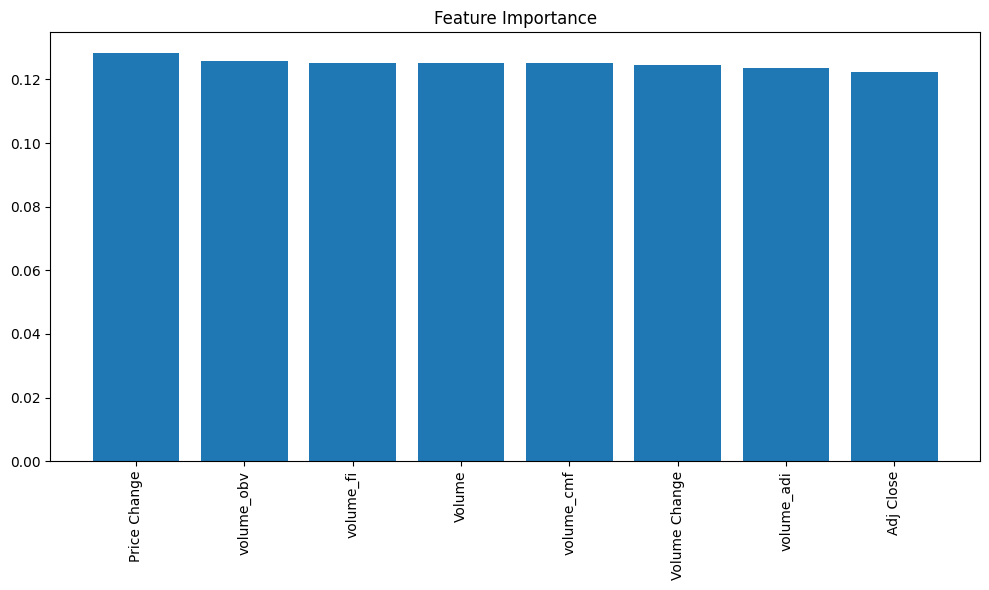

Top 8 features remaining
Score: 0.493573264781491
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf', 'volume_fi']
importances: [0.12233856 0.12515103 0.12837991 0.12442472 0.12367014 0.12570965
 0.12508701 0.12523898]
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf']


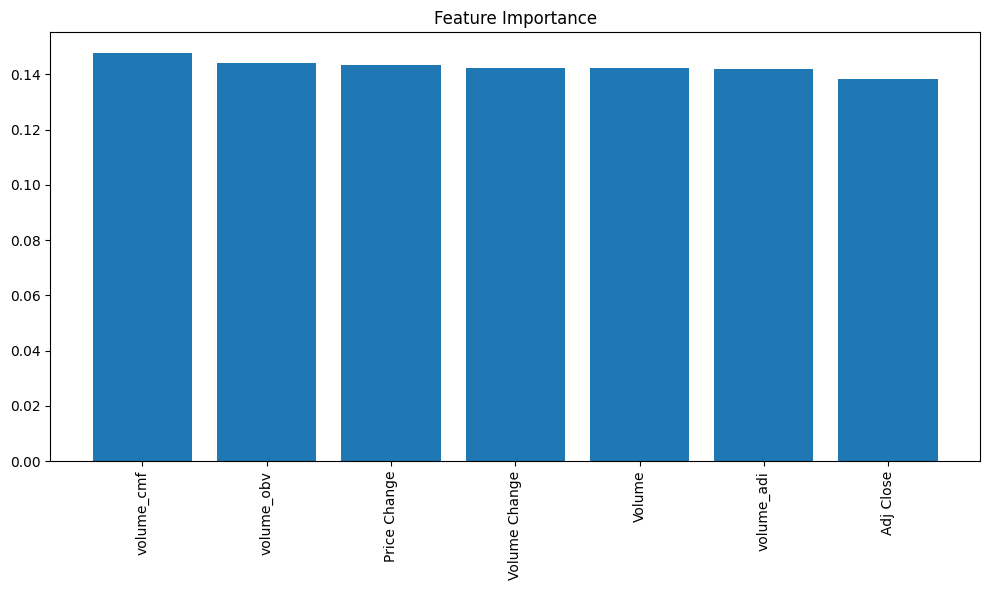

Top 7 features remaining
Score: 0.4910025706940874
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv', 'volume_cmf']
importances: [0.13832844 0.14238058 0.14325326 0.14238374 0.14187701 0.14398118
 0.14779578]
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv']


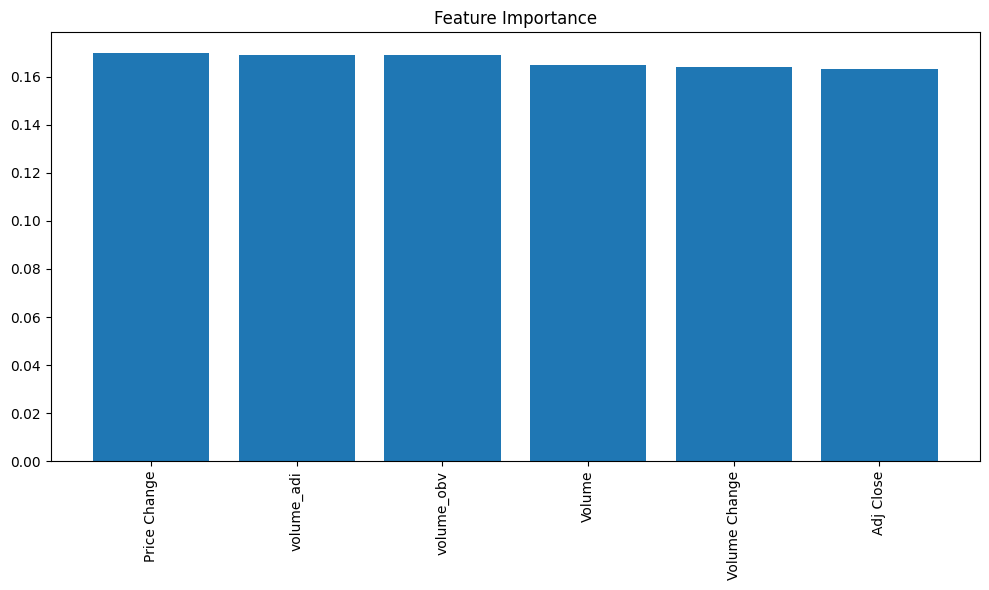

Top 6 features remaining
Score: 0.4755784061696658
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi', 'volume_obv']
importances: [0.16317204 0.16477927 0.16999872 0.16409326 0.1690285  0.16892821]
features: ['Adj Close', 'Volume', 'Price Change', 'Volume Change', 'volume_adi']
Top 5 features remaining


In [222]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
import numpy as np

features = [i for i in df.columns if i not in ['Target']+['Open','High','Low','Close']]

# test_list = np.arange(1, len(features) + 1)

scores = []
number_of_features = []

for i in range(1, len(features) + 1):
    if i > 1 and len(features) > 5:
        # Select Top n_features-1 features
        features = features[:-1]
    print(f'features: {features}')

    if len(features) <= 5:
        print(f'Top {len(features)} features remaining')
        break

    # Prepare the data
    X = df[features]
    y = df['Target']

    # Split the data
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)

    # Initialize and fit the model
    model = RandomForestClassifier()
    model.fit(X_train, y_train)

    # Feature Importance
    importances = model.feature_importances_
    sorted_indices = np.argsort(importances)[::-1]

    plt.figure(figsize=(10, 6))
    plt.title('Feature Importance')
    plt.bar(range(X_train.shape[1]), importances[sorted_indices], align='center')
    plt.xticks(range(X_train.shape[1]), X.columns[sorted_indices], rotation=90)
    plt.tight_layout()
    plt.show()
    
    # Append to list
    scores.append(model.score(X_test, y_test))
    number_of_features.append(len(features))

    print(f'Top {len(features)} features remaining')
    print(f'Score: {model.score(X_test, y_test)}')
    print(f'features: {features}')
    print(f'importances: {importances}')
